In [903]:
import sys
sys.path.append('/home/annie/Documents/multi-Ecoli/strains/')
from pymodulon.io import *
from pymodulon.plotting import *
from os import path
from pymodulon.enrichment import *

In [904]:
sys.path.append('/home/annie/Documents/modulome/notebook/iModulon/pyvenn/')
from venn import venn
from matplotlib_venn import venn2

In [905]:
import matplotlib
import matplotlib.font_manager
# plt.style.use('figures')
matplotlib.rcParams['pdf.fonttype'] = 42

In [4]:
old = load_json_model('../Tahani/selon.json')

In [906]:
data_dir = path.join('..','data','processed_data')
# interim_dir = path.join('..','data','interim')

In [907]:
ica_data = load_json_model(path.join(data_dir,'ica_wip.json.gz'))

In [908]:
DF_enrichments = pd.read_csv(path.join(data_dir,'functional_enrichments.csv'),index_col=0)

<BarContainer object of 57 artists>

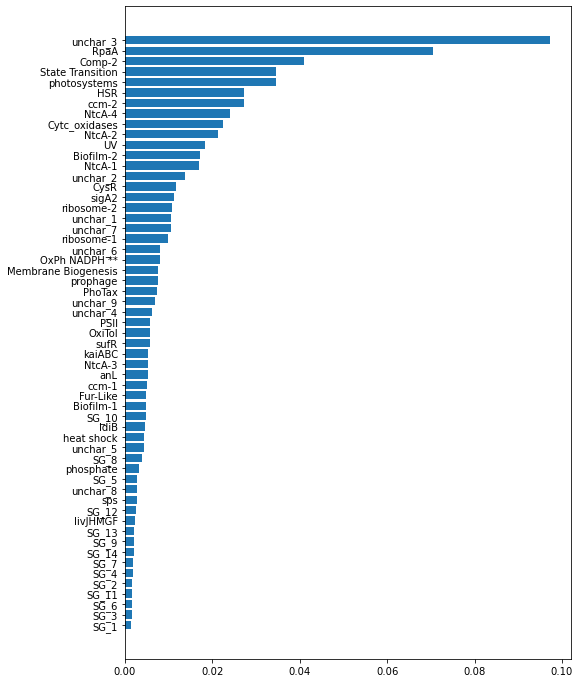

In [256]:
plt.figure(figsize = (8,12))
plt.barh(y = [str(x) for x in ica_data.imodulon_table.sort_values(by='explained_variance', ascending=True).index],
        width=ica_data.imodulon_table.sort_values(by='explained_variance', ascending=True).explained_variance)

In [284]:
# ica_data.rename_imodulons({'sigA2':'sigA2/rpoD2'})

In [297]:
# ica_data.imodulon_table.loc['sigA2/rpoD2','category'] = 'genomic'

In [909]:
characterized=['RpaA','NtcA-1','NtcA-2','ccm-1','ccm-2','UV','Biofilm-1','Biofilm-2','sufR',
               'CysR','prophage','ribosome-1','ribosome-2','kaiABC','sps','livJHMGF',
               'sigA2/rpoD2']

In [910]:
uncharacterized = ['anL','unchar_4','unchar_5','unchar_8']

In [911]:
[x for x in ica_data.imodulon_names if 'SG_' not in x and x not in characterized and x not in uncharacterized]

['PSII',
 'unchar_1',
 'unchar_2',
 'unchar_3',
 'Cytc_oxidases',
 'heat shock',
 'Fur-Like',
 'OxPh NADPH **',
 'HSR',
 'IdiB',
 'phosphate',
 'Membrane Biogenesis',
 'Comp-2',
 'PhoTax',
 'OxiTol',
 'photosystems',
 'unchar_6',
 'State Transition',
 'unchar_7',
 'NtcA-3',
 'unchar_9',
 'NtcA-4']

In [375]:
[x for x in np.unique(DF_enrichments.imodulon) if x not in characterized and x not in uncharacterized]

['Cytc_oxidases',
 'Fur-Like',
 'HSR',
 'PSII',
 'PhoTax',
 'heat shock',
 'phosphate',
 'photosystems',
 'unchar_6']

In [912]:
DF_enrichments[DF_enrichments.imodulon=='Fur-Like']

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
12,Fur-Like,M00190,1.513488e-07,0.000031,0.3,0.75,0.428571,3.0,4.0,10.0,KEGG modules,NaN,NaN


In [122]:
for i in ica_data.imodulon_names:
    if 'Synpcc7942_1849' in ica_data.view_imodulon(i).index:
        print(i)

unchar_4
prophage
RpaA
SG_10


In [381]:
for i in ica_data.imodulon_names:
    corr = ica_data.A.loc[i].corr(ica_data.A.loc['Fur-Like']) 
    if abs(corr) > 0.6:
        print(i)

Fur-Like
State Transition


<AxesSubplot:xlabel='IdiB Gene Weight', ylabel='Fur-Like Gene Weight'>

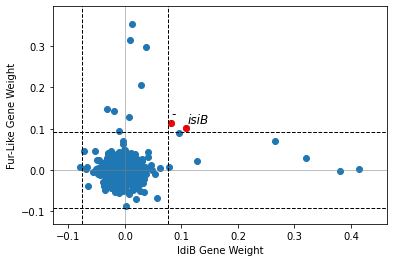

In [386]:
compare_gene_weights(ica_data,'IdiB','Fur-Like')

In [916]:
ica_data.view_imodulon('IdiB')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0808,0.078778,spsA,CP000100.1,NaN,800851,802980,-,HAD-superfamily hydrolase subfamily IIB,Cell wall/membrane/envelope biogenesis,Q31Q29,Op621,NaN
Synpcc7942_1461,0.320320,irpB,CP000100.1,NaN,1512709,1513965,-,thiol oxidoreductase-like,Energy production and conversion,Q31N78,Op1106,NaN
Synpcc7942_1462,0.380281,irpA,CP000100.1,NaN,1514071,1515141,-,imelysin. Metallo peptidase. MEROPS family M75,Inorganic ion transport and metabolism,P12608,Op1106,NaN
Synpcc7942_1463,0.128174,somB(1),CP000100.1,NaN,1515369,1517000,+,probable porin,Cell wall/membrane/envelope biogenesis,Q31N76,Op1107,zur
Synpcc7942_1540,0.081780,-,CP000100.1,NaN,1597856,1598566,-,conserved hypothetical protein,Lipid transport and metabolism,Q31MZ9,Op1161,NaN
Synpcc7942_1541,0.107687,isiB,CP000100.1,NaN,1598656,1599168,-,Flavodoxin%2C long chain,Energy production and conversion,P10340,Op1162,"Fur,perR"
Synpcc7942_1542,0.095321,isiA,CP000100.1,NaN,1599353,1600381,-,iron-stress chlorophyll-binding protein,Function unknown,P15347,Op1162,"Fur,perR"
Synpcc7942_1607,0.414992,somA(2),CP000100.1,NaN,1672123,1673679,-,probable porin%3B major outer membrane protein,Cell wall/membrane/envelope biogenesis,Q9KHA8,Op1213,NaN
Synpcc7942_2070,-0.078757,pilT1,CP000100.1,NaN,2146366,2147454,-,twitching motility protein,Cell motility,Q31LG9,Op1558,NaN
Synpcc7942_2175,0.265279,idiA,CP000100.1,NaN,2254747,2255847,-,transport system substrate-binding protein,Inorganic ion transport and metabolism,Q31L64,Op1640,NaN


<AxesSubplot:ylabel='Fur-Like iModulon\nActivity'>

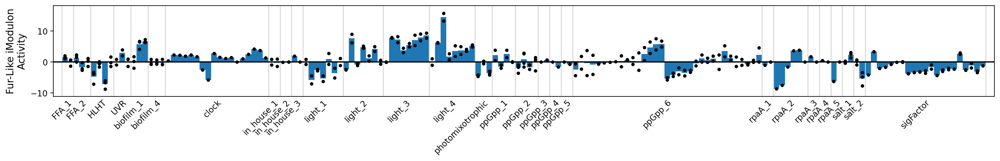

In [914]:
plot_activities(ica_data,'Fur-Like')

<AxesSubplot:ylabel='IdiB iModulon\nActivity'>

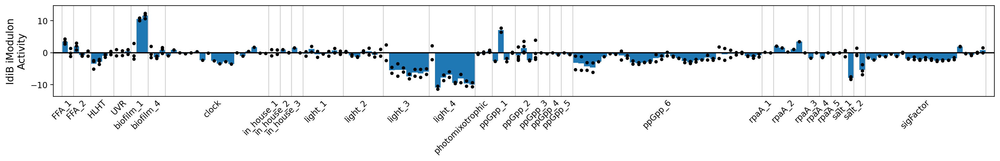

In [918]:
plot_activities(ica_data,'IdiB')

In [924]:
for i in ica_data.imodulon_names:
    if 'Synpcc7942_2174' in ica_data.view_imodulon(i).index:
        print(i)

Fur-Like


<AxesSubplot:xlabel='Gene Start', ylabel='IdiB Gene Weight'>

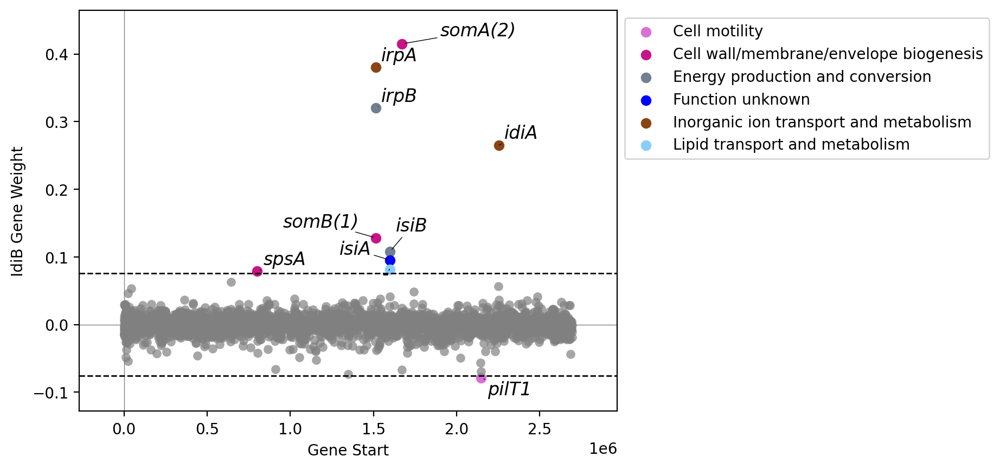

In [922]:
plot_gene_weights(ica_data,'IdiB')

In [928]:
delete_later =  load_json_model('/home/annie/Desktop/modulome-workflow/data/interim/bsu_raw.json.gz')

In [929]:
delete_later.M

,S-box,1,WalR,3,Rex,Fnr,6,7,CsoR/Fnr,9,...,SG_5,MntR,FapR,AbrB,CcpA-2,KipR,68,69,70,71
BSU_00010,0.000089,0.001263,0.004293,0.001821,-0.004466,-0.001390,-0.001226,-0.005982,0.000030,0.001977,...,0.013069,-0.008429,-0.004673,0.001406,0.005669,-0.014088,-0.014478,-0.002071,-0.000660,-0.004791
BSU_00020,0.002526,-0.008419,0.002271,-0.000484,0.001463,-0.012141,0.006787,0.000108,0.003197,0.000947,...,0.012092,-0.003590,-0.025058,0.003270,-0.000066,0.004522,-0.010857,0.001325,0.003742,0.002508
BSU_00030,-0.006134,0.004802,-0.000736,-0.002625,-0.001030,0.000369,-0.000804,-0.006967,-0.000507,-0.006854,...,0.005007,0.015416,-0.005955,-0.011572,0.004045,0.004161,0.009912,-0.008561,0.029579,-0.010810
BSU_00040,-0.010967,-0.004224,-0.004924,0.000193,-0.002249,-0.007987,0.007028,-0.001294,-0.001841,0.001454,...,0.003362,0.008901,0.005104,0.000793,0.003879,-0.003548,-0.002160,-0.017138,0.001262,-0.000834
BSU_00050,-0.011480,-0.004222,0.000500,0.000852,0.004117,-0.012795,-0.013120,0.001118,0.000746,-0.003700,...,-0.006374,0.010765,0.009774,-0.005853,0.006335,-0.001074,0.003010,-0.011063,0.000148,0.000443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BSU_41020,-0.008436,0.003287,-0.001561,-0.000033,-0.007478,-0.001155,0.003877,-0.003057,-0.000713,0.000075,...,-0.002534,-0.007991,-0.002422,-0.005021,0.000761,-0.000717,-0.000802,0.005263,0.000173,0.005251
BSU_41030,0.002472,-0.011317,0.002040,-0.000572,-0.006395,-0.011670,-0.004577,-0.002586,0.000276,0.001726,...,-0.001909,-0.010786,0.009638,0.001547,0.000937,0.004653,-0.005057,-0.000747,-0.010236,-0.013024
BSU_41040,0.001873,-0.013807,0.008770,0.000041,-0.008043,-0.015184,0.001587,-0.002120,0.001220,0.000253,...,0.001171,-0.002209,0.019436,-0.001925,0.000738,0.006315,-0.004539,-0.003527,0.008522,-0.004171
BSU_41050,-0.012614,-0.001386,0.026078,0.006240,-0.017750,-0.019581,0.013401,-0.000853,0.001634,0.003976,...,-0.002290,-0.023111,0.013132,-0.005871,0.004115,0.008342,-0.021092,-0.006018,-0.009225,0.004406


<AxesSubplot:xlabel='Gene Start', ylabel='Fur-Like Gene Weight'>

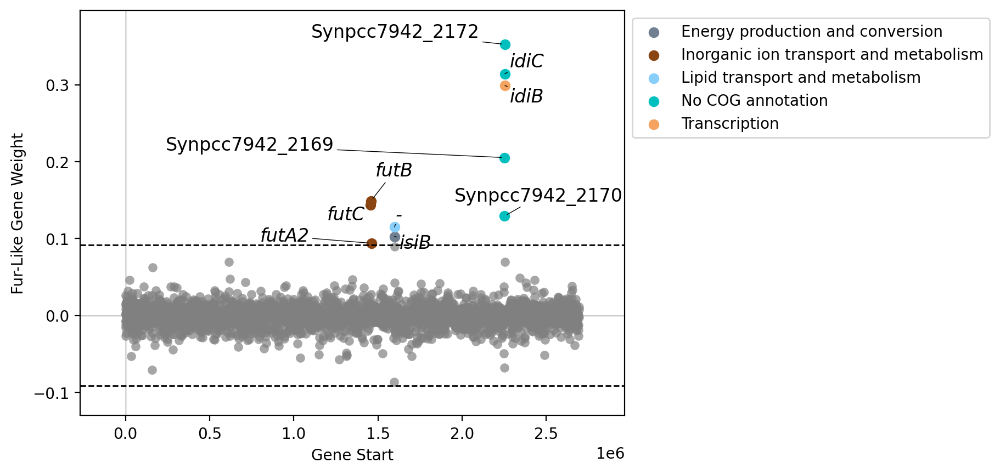

In [925]:
plot_gene_weights(ica_data,'Fur-Like')

<AxesSubplot:xlabel='Fur-Like iModulon Activity', ylabel='IdiB iModulon Activity'>

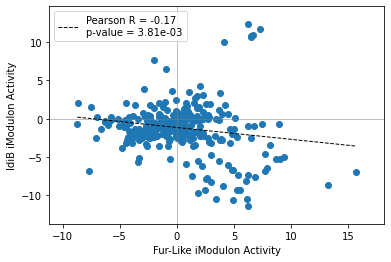

In [387]:
compare_activities(ica_data,'Fur-Like','IdiB')

/Users/annieyuan/opt/anaconda3/envs/pymodulon/lib/python3.10/site-packages/sklearn/tree/_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(


<AxesSubplot:xlabel='Fur-Like'>

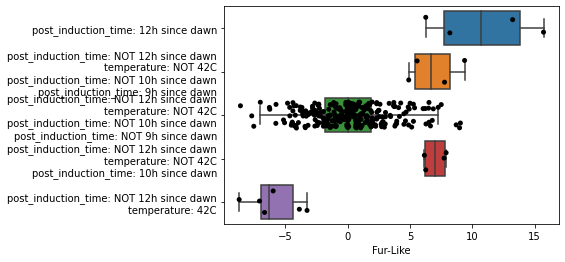

In [382]:
metadata_boxplot(ica_data,'Fur-Like',n_boxes=5,
                 use_cols=['biosample_genotype','post_induction_time','base_media',
                           'carbon_source','supplement','temperature','entrainment',
                          'growth_phase'])

<AxesSubplot:ylabel='Fur-Like iModulon\nActivity'>

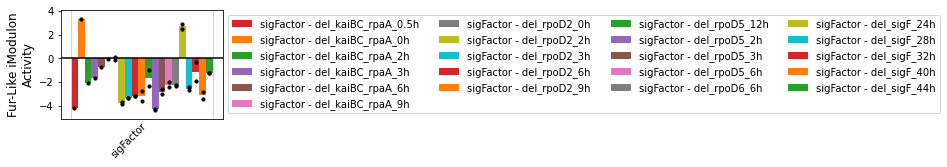

In [383]:
plot_activities(ica_data,'Fur-Like',projects='sigFactor')

<AxesSubplot:ylabel='Fur-Like iModulon\nActivity'>

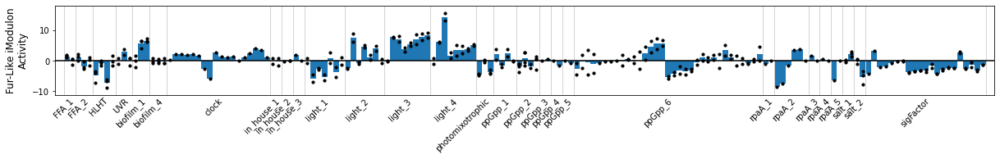

In [384]:
plot_activities(ica_data,'Fur-Like')

<AxesSubplot:ylabel='HSR iModulon\nActivity'>

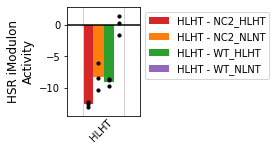

In [328]:
plot_activities(ica_data,'HSR',projects='HLHT')

<AxesSubplot:ylabel='HSR iModulon\nActivity'>

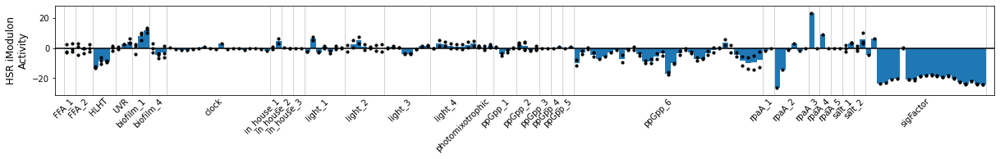

In [324]:
plot_activities(ica_data,'HSR')

<AxesSubplot:xlabel='Gene Start', ylabel='kaiABC Gene Weight'>

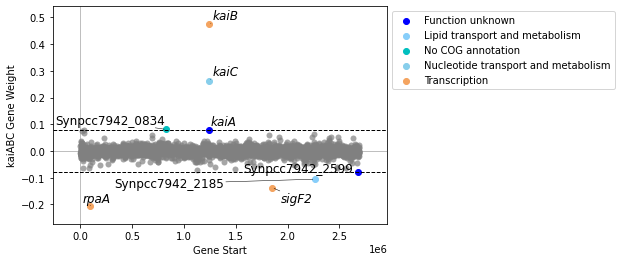

In [60]:
plot_gene_weights(ica_data,'kaiABC')

Text(0, 0.5, 'iModulon Activity')

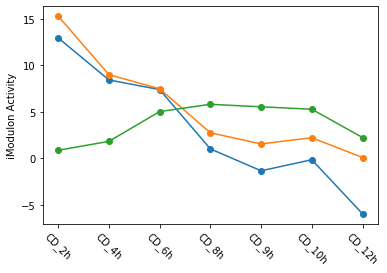

In [59]:
plt.plot(light4_activity(ica_data,['ribosome-1','ribosome-2','kaiABC']).T,'-o')
plt.xticks(rotation=-45)
plt.ylabel('iModulon Activity')
# plt.ylim([-10,20])

In [52]:
ica_data.sample_table[ica_data.sample_table.project == 'light_3'].publication

SRX3211304    29239721
SRX3211305    29239721
SRX3211306    29239721
SRX3211307    29239721
SRX3211308    29239721
SRX3211309    29239721
SRX3211310    29239721
SRX3211311    29239721
SRX3211312    29239721
SRX3211313    29239721
SRX3211314    29239721
SRX3211315    29239721
SRX3211316    29239721
SRX3211317    29239721
SRX3211318    29239721
SRX3211319    29239721
Name: publication, dtype: object

<AxesSubplot:ylabel='ribosome-1 iModulon\nActivity'>

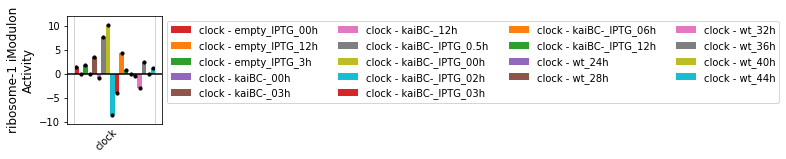

In [34]:
plot_activities(ica_data,'ribosome-1',projects='clock')

<AxesSubplot:xlabel='Gene Start', ylabel='ribosome-2 Gene Weight'>

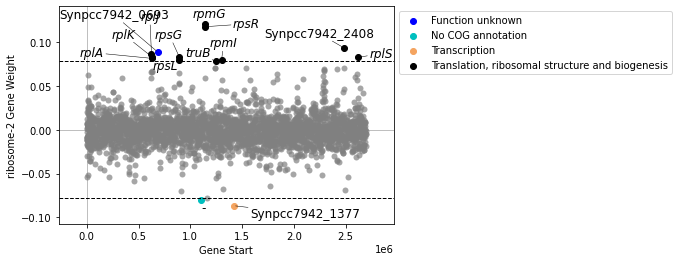

In [33]:
plot_gene_weights(ica_data,'ribosome-2')

<AxesSubplot:ylabel='unchar_3 iModulon\nActivity'>

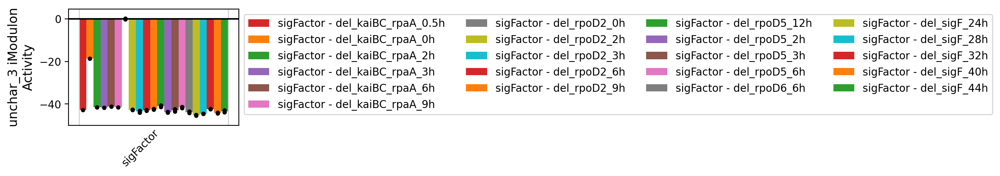

In [581]:
plot_activities(ica_data,'unchar_3',projects='sigFactor')

<AxesSubplot:ylabel='State Transition iModulon\nActivity'>

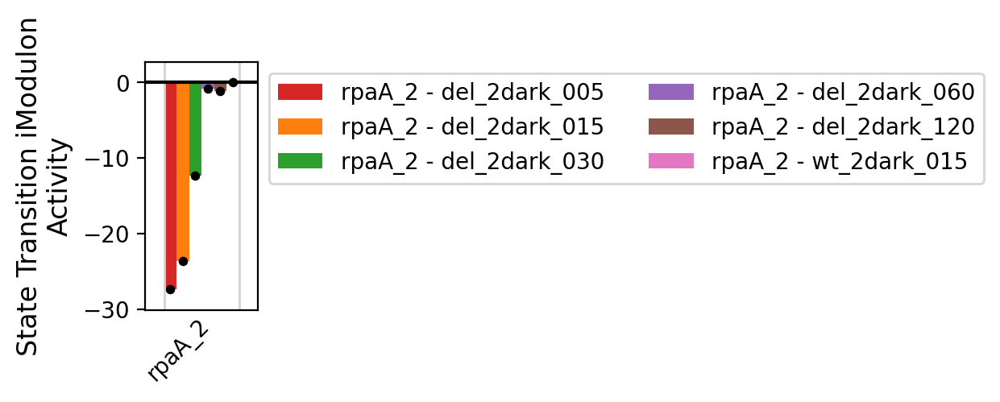

In [603]:
plot_activities(ica_data,'State Transition',projects='rpaA_2')

In [601]:
ica_data.view_imodulon('unchar_3').sort_values('gene_weight',ascending=False)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_2352,0.112212,yfiA,CP000100.1,NaN,2419575,2420198,-,sigma 54 modulation protein / SSU ribosomal pr...,"Translation, ribosomal structure and biogenesis",Q31KN7,Op1762,NaN
Synpcc7942_0491,0.107984,ndhQ,CP000100.1,NaN,479700,479837,+,hypothetical protein,No COG annotation,Q31QZ6,Op393,NaN
Synpcc7942_0905,0.103975,Synpcc7942_0905,CP000100.1,NaN,915588,916130,+,hypothetical protein,No COG annotation,Q31PT4,Op694,NaN
Synpcc7942_1150,0.093005,Synpcc7942_1150,CP000100.1,NaN,1175078,1175734,-,conserved hypothetical protein,Function unknown,Q31P39,Op877,NaN
Synpcc7942_1302,0.092715,Synpcc7942_1302,CP000100.1,NaN,1330250,1330726,+,conserved hypothetical protein,Signal transduction mechanisms,Q31NN7,Op979,NaN
Synpcc7942_0955,0.090675,Synpcc7942_0955,CP000100.1,NaN,963272,963790,-,conserved hypothetical protein,No COG annotation,Q31PN4,Op729,NaN
Synpcc7942_2185,0.086702,Synpcc7942_2185,CP000100.1,NaN,2263403,2263807,+,conserved hypothetical protein,Lipid transport and metabolism,Q31L54,Op1650,NaN
Synpcc7942_0522,0.086381,Synpcc7942_0522,CP000100.1,NaN,507941,508312,+,hypothetical protein,No COG annotation,Q31QW5,Op411,NaN
Synpcc7942_0900,0.086368,Synpcc7942_0900,CP000100.1,NaN,909440,909643,-,conserved hypothetical protein,No COG annotation,Q31PT9,Op689,NaN
Synpcc7942_2540,0.084623,Synpcc7942_2540,CP000100.1,NaN,2621837,2622298,-,blue-copper-protein-like protein,Inorganic ion transport and metabolism,Q31K49,Op1902,NaN


<AxesSubplot:xlabel='Gene Start', ylabel='unchar_3 Gene Weight'>

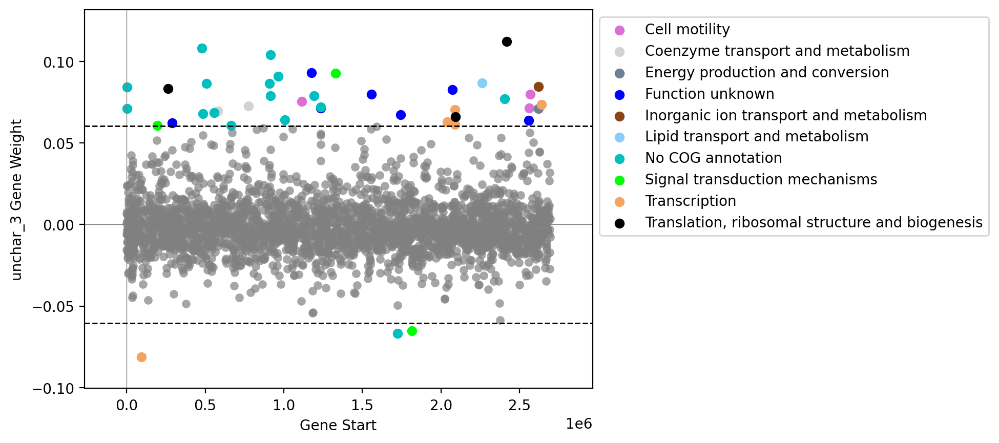

In [586]:
plot_gene_weights(ica_data,'unchar_3')

In [537]:
ica_data.imodulon_table.sort_values(by='explained_variance',ascending=False)

,regulator,pvalue,qvalue,precision,recall,f1score,TP,regulon_size,imodulon_size,n_regs,single_gene,explained_variance,category
unchar_3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42,NaN,NaN,0.097238,uncharacterized
RpaA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121,NaN,NaN,0.070433,functional
Comp-2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41,NaN,NaN,0.040916,uncharacterized
State Transition,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31,NaN,NaN,0.034515,uncharacterized
photosystems,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,NaN,NaN,0.034484,functional
HSR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31,NaN,NaN,0.027318,uncharacterized
ccm-2,ccmR,1.397716e-10,1.397716e-10,0.227273,0.833333,0.357143,5.0,6.0,22,1.0,NaN,0.027318,regulatory
NtcA-4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,NaN,NaN,0.023951,uncharacterized
Cytc_oxidases,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19,NaN,NaN,0.022565,uncharacterized
NtcA-2,ntcA,2.770449e-09,8.311348e-09,0.175000,0.388889,0.241379,7.0,18.0,40,1.0,NaN,0.021265,regulatory


<AxesSubplot:xlabel='RpaA iModulon Activity', ylabel='Comp-2 iModulon Activity'>

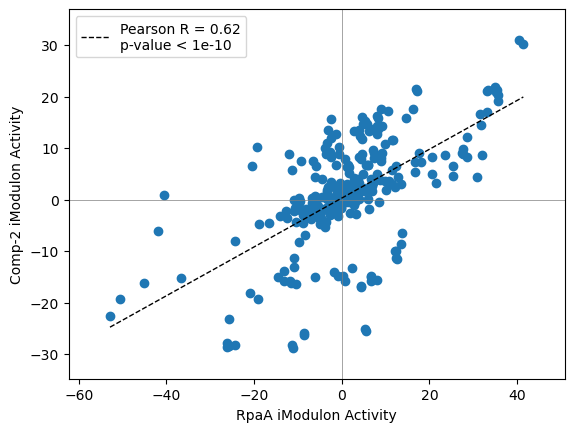

In [197]:
compare_activities(ica_data,'RpaA','Comp-2')

<AxesSubplot:xlabel='Gene Start', ylabel='NtcA-4 Gene Weight'>

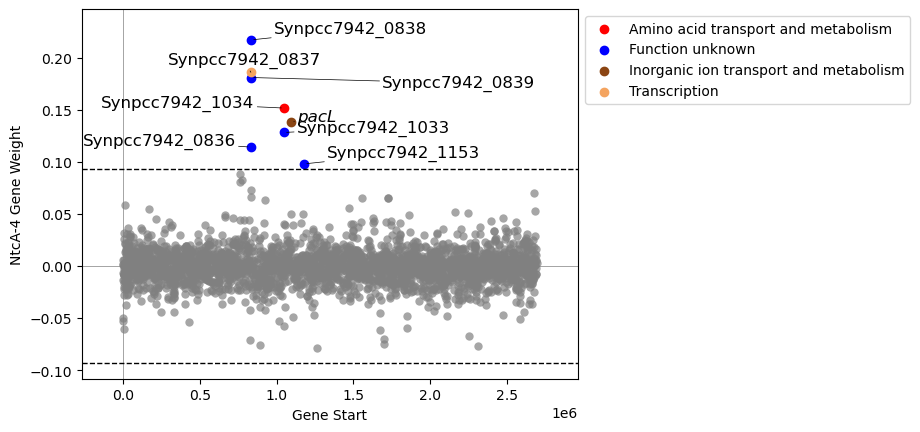

In [85]:
plot_gene_weights(ica_data,'livJHMGF',show_labels=True)

<AxesSubplot:xlabel='Gene Start', ylabel='ccmR-1 Gene Weight'>

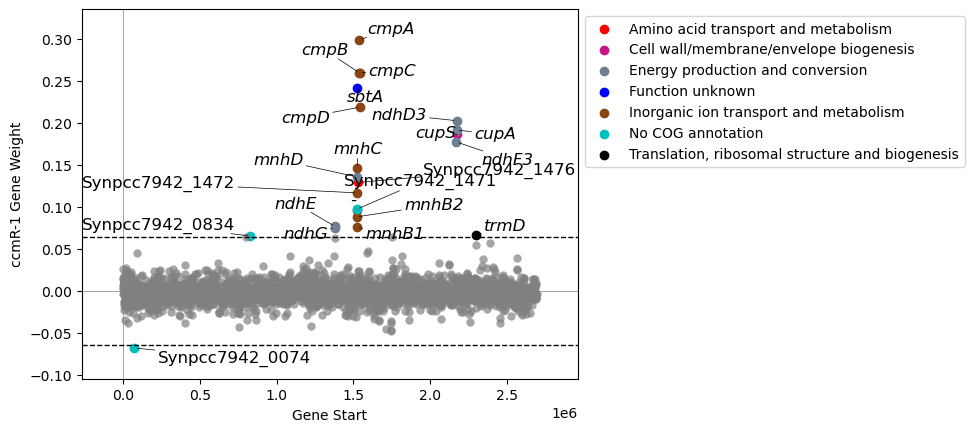

In [72]:
plot_gene_weights(ica_data,'ccmR-1',show_labels=True)

In [93]:
ica_data.view_imodulon('livJHMGF')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0726,0.101279,Synpcc7942_0726,CP000100.1,NaN,720068,720430,+,conserved hypothetical protein,No COG annotation,Q31QB1,Op565,NaN
Synpcc7942_1377,0.121401,Synpcc7942_1377,CP000100.1,NaN,1417540,1419879,+,metal dependent phosphohydrolase,Transcription,Q31NG2,Op1036,NaN
Synpcc7942_2492,0.148315,livF,CP000100.1,NaN,2573355,2574068,-,ATPase,Amino acid transport and metabolism,Q31K97,Op1871,NaN
Synpcc7942_2493,0.203961,livG,CP000100.1,NaN,2574061,2574822,-,ATPase,Amino acid transport and metabolism,Q8GIU0,Op1871,NaN
Synpcc7942_2494,0.221265,livM,CP000100.1,NaN,2574819,2575742,-,putative branched-chain amino acid ABC transpo...,Amino acid transport and metabolism,Q8GIU1,Op1871,NaN
Synpcc7942_2495,0.229308,livH,CP000100.1,NaN,2575746,2576687,-,integral membrane protein of the ABC-type Nat ...,Amino acid transport and metabolism,Q935W9,Op1871,NaN
Synpcc7942_2496,0.219909,livJ,CP000100.1,NaN,2576687,2577886,-,branched-chain amino-acid ABC transport system...,Amino acid transport and metabolism,Q935X0,Op1871,NaN
Synpcc7942_2497,0.169913,ndk,CP000100.1,NaN,2577916,2578371,-,nucleoside diphosphate kinase,Nucleotide transport and metabolism,P50590,Op1871,NaN


In [75]:
ica_data.view_imodulon('ccmR-1')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0074,-0.067794,Synpcc7942_0074,CP000100.1,NaN,73306,73659,-,conserved hypothetical protein,No COG annotation,Q31S63,Op93,NaN
Synpcc7942_0834,0.065401,Synpcc7942_0834,CP000100.1,NaN,828582,829235,+,conserved hypothetical protein,No COG annotation,Q31Q04,Op640,NaN
Synpcc7942_1345,0.074989,ndhG,CP000100.1,NaN,1378990,1379595,+,NADH dehydrogenase subunit 6,Energy production and conversion,Q31NJ4,Op1011,NaN
Synpcc7942_1346,0.076882,ndhE,CP000100.1,NaN,1379614,1379925,+,NADH dehydrogenase subunit 4L,Energy production and conversion,Q31NJ3,Op1011,NaN
Synpcc7942_1468,0.075560,mnhB1,CP000100.1,NaN,1521482,1522141,-,putative multicomponent Na+:H+ antiporter subu...,Inorganic ion transport and metabolism,Q31N71,Op1111,NaN
Synpcc7942_1469,0.088137,mnhB2,CP000100.1,NaN,1522138,1522719,-,putative multicomponent Na+:H+ antiporter subu...,Inorganic ion transport and metabolism,Q31N70,Op1111,NaN
Synpcc7942_1470,0.096660,-,CP000100.1,NaN,1522712,1523005,-,conserved hypothetical protein,Inorganic ion transport and metabolism,Q31N69,Op1112,NaN
Synpcc7942_1471,0.097226,Synpcc7942_1471,CP000100.1,NaN,1523002,1523259,-,conserved hypothetical protein,No COG annotation,Q31N68,Op1111,NaN
Synpcc7942_1472,0.116698,Synpcc7942_1472,CP000100.1,NaN,1523256,1523642,-,conserved hypothetical protein,Inorganic ion transport and metabolism,Q31N67,Op1111,NaN
Synpcc7942_1473,0.135673,mnhD,CP000100.1,NaN,1523639,1525081,-,putative multicomponent Na+:H+ antiporter subu...,Energy production and conversion,Q31N66,Op1111,NaN


<AxesSubplot:ylabel='ccmR-1 iModulon\nActivity'>

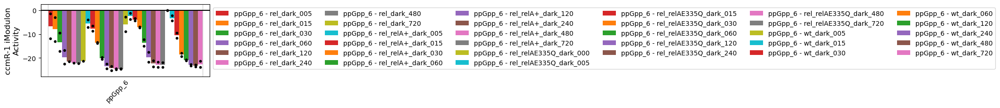

In [74]:
plot_activities(ica_data,'ccmR-1',projects='ppGpp_6')

<AxesSubplot:xlabel='Gene Start', ylabel='ccm Gene Weight'>

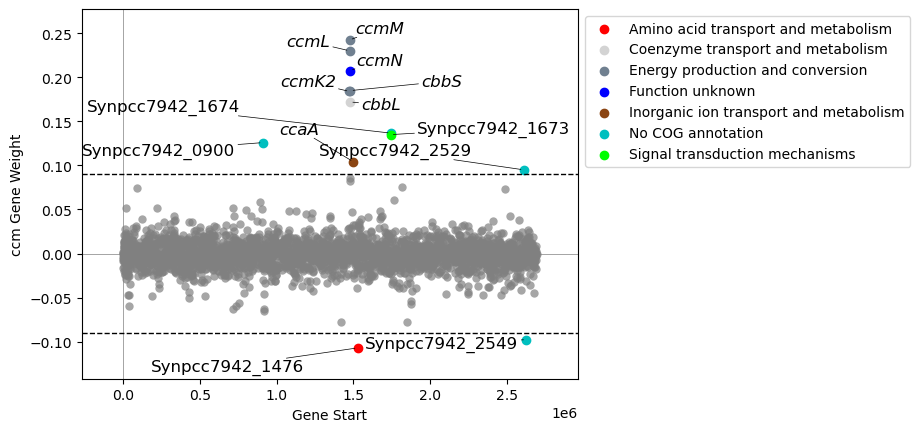

In [63]:
plot_gene_weights(ica_data,'ccm')

<AxesSubplot:ylabel='ccm iModulon\nActivity'>

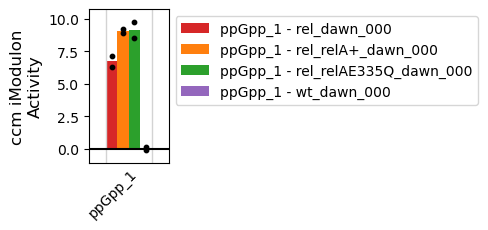

In [91]:
plot_activities(ica_data,'ccm',projects='ppGpp_1')

<AxesSubplot:ylabel='livJHMGF iModulon\nActivity'>

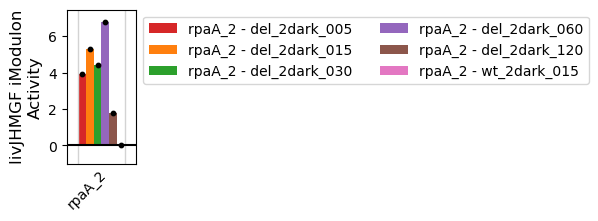

In [97]:
plot_activities(ica_data,'livJHMGF',projects='rpaA_2')

<AxesSubplot:ylabel='Comp-2 iModulon\nActivity'>

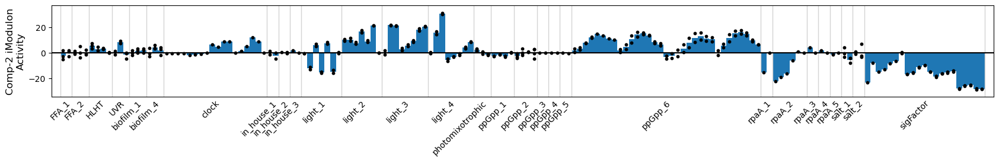

In [198]:
plot_activities(ica_data,'Comp-2')

<AxesSubplot:ylabel='ccmR-1 iModulon\nActivity'>

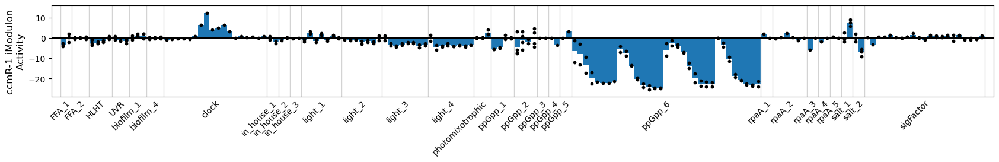

In [76]:
plot_activities(ica_data,'ccmR-1')

In [1182]:
DF_enrichments[DF_enrichments.imodulon == '14']

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
18,14,identical protein binding|protein binding|entr...,0.002997,0.042962,0.125,1.000000,0.222222,1.0,1.0,8.0,GO,NaN,NaN
19,14,negative regulation of phosphorylation,0.002997,0.042962,0.125,1.000000,0.222222,1.0,1.0,8.0,GO,NaN,NaN
20,14,regulation of circadian rhythm,0.002997,0.042962,0.125,1.000000,0.222222,1.0,1.0,8.0,GO,NaN,NaN
21,14,entrainment of circadian clock,0.008969,0.096412,0.125,0.333333,0.181818,1.0,3.0,8.0,GO,NaN,NaN


In [1176]:
np.unique(DF_enrichments.imodulon)

array(['0', '1', '14', '15', '16', '17', '18', '2', '25', '26', '28',
       '33', '36', '38', '42', '5', '51', '6', 'ccmR-1', 'ccmR-2',
       'ntcA-1', 'ntcA-2'], dtype=object)

In [11]:
ica_data.view_imodulon('unchar_3')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0095,-0.081149,rpaA,CP000100.1,NaN,92590,93339,-,two component transcriptional regulator%2C win...,Transcription,Q31S42,Op108,NaN
Synpcc7942_0195,0.060531,Synpcc7942_0195,CP000100.1,NaN,195630,196058,+,conserved hypothetical protein,Signal transduction mechanisms,Q31RU2,Op181,NaN
Synpcc7942_0267,0.083137,rsmG,CP000100.1,NaN,263757,264485,+,methyltransferase GidB,"Translation, ribosomal structure and biogenesis",Q31RM0,Op230,NaN
Synpcc7942_0291,0.062169,Synpcc7942_0291,CP000100.1,NaN,288312,288530,+,conserved hypothetical protein,Function unknown,Q31RJ6,Op244,NaN
Synpcc7942_0491,0.107984,ndhQ,CP000100.1,NaN,479700,479837,+,hypothetical protein,No COG annotation,Q31QZ6,Op393,NaN
Synpcc7942_0497,0.068040,-,CP000100.1,NaN,484328,484504,-,conserved hypothetical protein,No COG annotation,Q31QZ0,Op398,NaN
Synpcc7942_0522,0.086381,Synpcc7942_0522,CP000100.1,NaN,507941,508312,+,hypothetical protein,No COG annotation,Q31QW5,Op411,NaN
Synpcc7942_0573,0.068486,Synpcc7942_0573,CP000100.1,NaN,555297,555533,-,hypothetical protein,No COG annotation,Q31QR4,Op447,NaN
Synpcc7942_0592,0.069449,pfkA,CP000100.1,NaN,579312,580394,-,6-phosphofructokinase,Coenzyme transport and metabolism,Q31QP5,Op463,NaN
Synpcc7942_0667,0.060560,Synpcc7942_0667,CP000100.1,NaN,663985,664296,+,conserved hypothetical protein,No COG annotation,Q31QH0,Op520,NaN


<AxesSubplot:ylabel='unchar_3 iModulon\nActivity'>

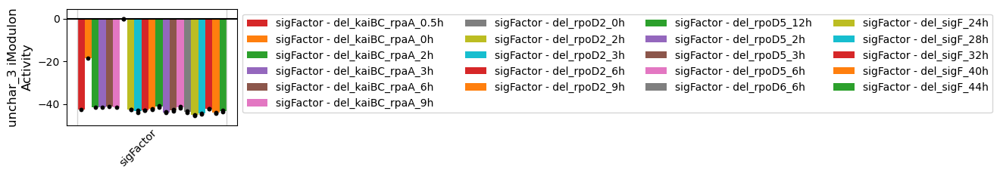

In [14]:
plot_activities(ica_data,'unchar_3',projects='sigFactor')

In [1208]:
ica_data.view_imodulon('State Transition')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0096,0.080034,Synpcc7942_0096,CP000100.1,,93764,94285,-,conserved hypothetical protein,Function unknown,Q31S41,Op109,
Synpcc7942_0122,0.065471,Synpcc7942_0122,CP000100.1,,121831,123408,-,EAL,Signal transduction mechanisms,Q31S15,Op129,
Synpcc7942_0193,0.078883,Synpcc7942_0193,CP000100.1,,192247,192471,-,conserved hypothetical protein,No COG annotation,Q31RU4,Op179,
Synpcc7942_0215,0.117702,Synpcc7942_0215,CP000100.1,,217424,217813,-,conserved hypothetical protein,"Replication, recombination and repair",Q31RS2,Op194,
Synpcc7942_0236,0.073112,Synpcc7942_0236,CP000100.1,,232018,232557,+,cyclic nucleotide-binding domain (cNMP-BD) pro...,No COG annotation,Q31RQ1,Op209,
Synpcc7942_0267,0.079543,rsmG,CP000100.1,,263757,264485,+,methyltransferase GidB,"Translation, ribosomal structure and biogenesis",Q31RM0,Op230,
Synpcc7942_0415,0.082752,Synpcc7942_0415,CP000100.1,,405168,406145,-,conserved hypothetical protein,Function unknown,Q31R72,Op335,
Synpcc7942_0433,0.112566,Synpcc7942_0433,CP000100.1,,423632,424840,+,conserved hypothetical protein,No COG annotation,Q8GMQ5,Op348,
Synpcc7942_0708,-0.072814,ubiB1,CP000100.1,,698708,700459,+,conserved hypothetical protein,Function unknown,Q31QC9,Op550,
Synpcc7942_0768,0.068486,Synpcc7942_0768,CP000100.1,,760522,761178,+,conserved hypothetical protein,No COG annotation,Q31Q69,Op589,


In [1217]:
light_1_idx = ica_data.sample_table[ica_data.sample_table['project'] == 'light_1'].index
light_2_idx = ica_data.sample_table[ica_data.sample_table['project'] == 'light_2'].index

<AxesSubplot:xlabel='Gene Start', ylabel='State Transition Gene Weight'>

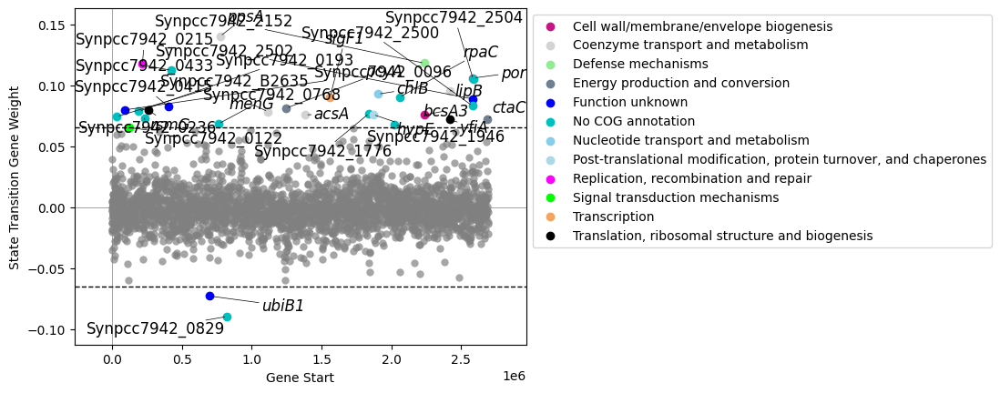

In [1188]:
plot_gene_weights(ica_data,'State Transition',show_labels=True)

In [223]:
for i in ica_data.imodulon_names:
    corr = ica_data.A.loc[i].corr(ica_data.A.loc['anL']) 
    if abs(corr) > 0.5:
        print(i)

anL
unchar_7


<AxesSubplot:ylabel='Comp-2 iModulon\nActivity'>

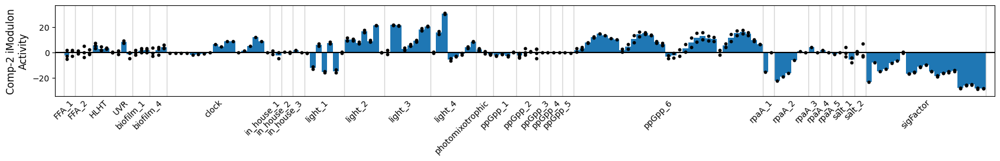

In [1119]:
plot_activities(ica_data,'Comp-2')

<AxesSubplot:ylabel='State Transition iModulon\nActivity'>

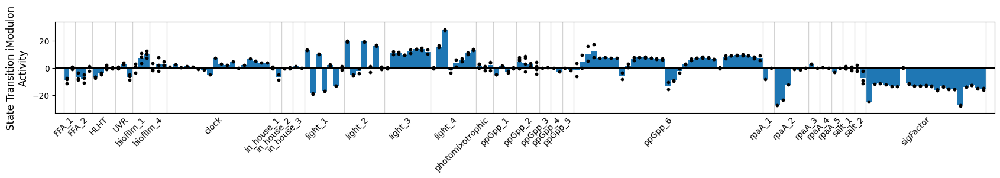

In [1115]:
plot_activities(ica_data,'State Transition')

<AxesSubplot:ylabel='State Transition iModulon\nActivity'>

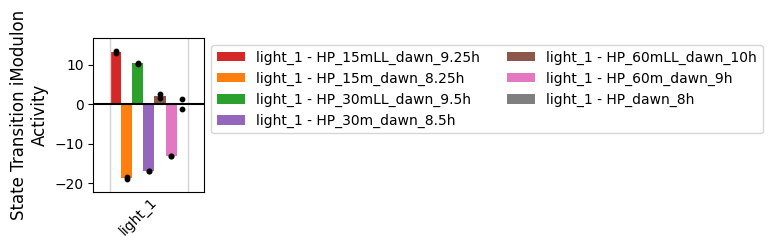

In [1166]:
plot_activities(ica_data,'State Transition',projects='light_1')

<AxesSubplot:ylabel='State Transition iModulon\nActivity'>

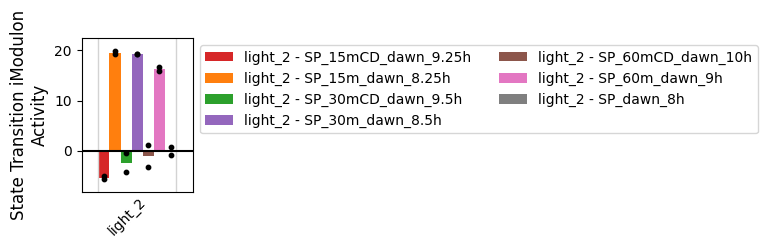

In [1165]:
plot_activities(ica_data,'State Transition',projects='light_2')

<AxesSubplot:ylabel='State Transition iModulon\nActivity'>

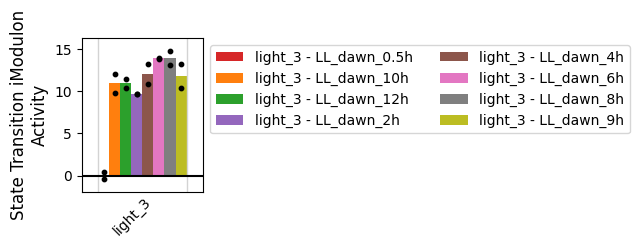

In [1139]:
plot_activities(ica_data,'State Transition',projects='light_3')

<AxesSubplot:ylabel='State Transition iModulon\nActivity'>

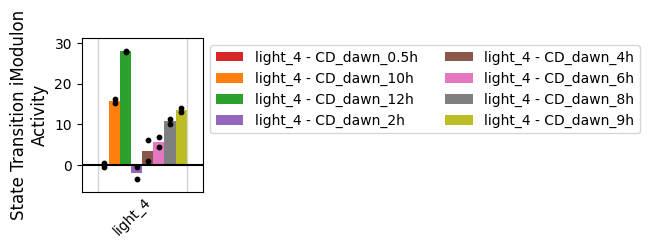

In [1141]:
plot_activities(ica_data,'State Transition',projects='light_4')

In [1153]:
light_4_idx

Index(['SRX3211320', 'SRX3211321', 'SRX3211322', 'SRX3211323', 'SRX3211324',
       'SRX3211325', 'SRX3211326', 'SRX3211327', 'SRX3211328', 'SRX3211329',
       'SRX3211330', 'SRX3211331', 'SRX3211332', 'SRX3211333', 'SRX3211334',
       'SRX3211335'],
      dtype='object')

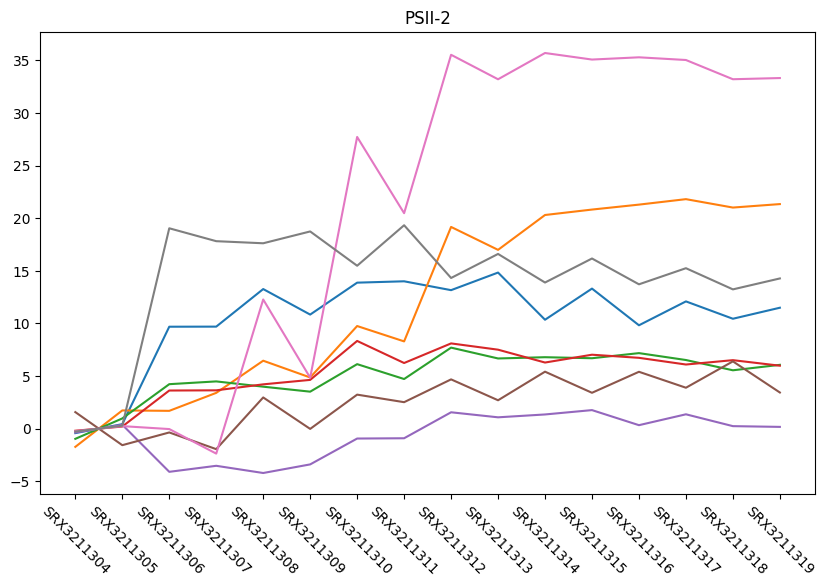

In [1168]:
plt.figure(figsize = (10,6))
for i in ['State Transition','Comp-2','unchar_3','unchar_7','HSR','kaiABC','RpaA','PSII-2']:
#     plt.figure(figsize = (14,6))
    plt.plot(ica_data.A[light_3_idx].loc[i])
    plt.xticks(rotation=-45)
#     plt.xticks(range(len(l)),l,rotation=-45)
    plt.title(i)

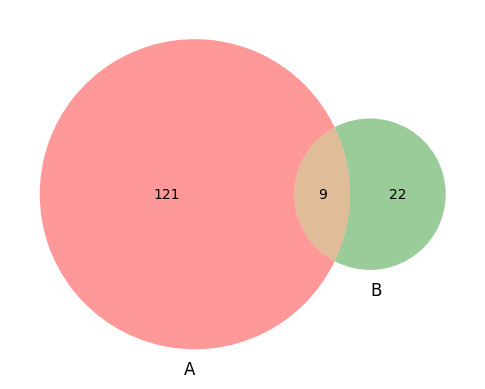

In [1152]:
venn2([set(dusk1+dawn2),set(ica_data.view_imodulon('State Transition').index)])

In [1701]:
dots

[('ccm', 'CMM', 0.7635740932661379),
 ('ribosome-1', 'Translation', 0.8347086811785245),
 ('kaiABC', 'RpaB', 0.789922960778401),
 ('UV', 'PS', 0.42666181759012867),
 ('UV', 'NblS-RpaB-SrrA-2 ', 0.6725252633283262),
 ('unchar_1', 'Purine Metabolism', 0.7869260272010375),
 ('unchar_2', 'U_7', 0.8462336080328862),
 ('SG_3', 'SG_3', 0.8166825384553836),
 ('anL', 'STR', 0.6809797211872523),
 ('ccmR-1', 'CmpR', 0.694070990149599),
 ('ccmR-1', 'Carbon Transport', 0.5690560013527252),
 ('sigA2', 'RpaA/RpaB', 0.8340143453398532),
 ('Cytc_oxidases', 'Cytc Oxidases ', 0.8254048496267826),
 ('Fur-Like', 'Fur-Like', 0.7342504598534109),
 ('OxPh NADPH **', 'OxPh NADPH **', 0.8747436398031392),
 ('unchar_4', 'U_11', 0.37383399757269387),
 ('unchar_4', 'U_12', 0.6306834923912426),
 ('NtcA-1', 'NtcA-1', 0.8428591758478832),
 ('Biofilm-1', 'Biofilm-1', 0.4902076699214551),
 ('Phage Related', 'Phage Related', 0.9070266634982248),
 ('unchar_5', 'Cell Division', 0.3643206359688412),
 ('unchar_5', 'U_5', 0.

In [1744]:
for i in table.index:
    if table.loc[i,'category'] == 'Energy Metabolism':
        table.loc[i,'category'] = 'Energy'

In [1755]:
# table.reset_index().rename(columns={'index':'imod'}).to_csv('/home/annie/Documents/elongatus_table_conference.csv')

In [1756]:
# table.reset_index().rename(columns={'index':'imod'}).sort_values(by='explained_variance',ascending=False)[['imod','category']]

# Of interest

## Regulatory -- RpaA

From this paper:https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3935230/#SD1, https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE51112or the 'clock' study in our metadata: <br>

rpaA is required for global circadian gene expression and its deletion arrests cells in a subjective dawn-like state <br>

clock rescue restores circadian gene expression oscillations. No strong oscillations were observed in either class of genes in the ΔrpaA clock rescue . We conclude that RpaA is required for the orchestration of robust circadian gene expression by the PTO, ruling out the scenario in which RpaA’s role is limited to supporting oscillator function <br>

Phosphorylated RpaA binds to the kaiBC promoter and upregulates kaiBC expression <br>

Active RpaA is sufficient to switch cells between the two major gene expression states produced by the circadian clock

In [59]:
# https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3935230/#SD1
rpaa_regulon = ["Synpcc7942_0004", "Synpcc7942_0012", "Synpcc7942_0013", "Synpcc7942_0017", "Synpcc7942_0018", "Synpcc7942_0065", "Synpcc7942_0095", "Synpcc7942_0100", "Synpcc7942_0101", "Synpcc7942_0102", "Synpcc7942_0156", "Synpcc7942_0157", "Synpcc7942_0170", "Synpcc7942_0171", "Synpcc7942_0172", "Synpcc7942_0243", "Synpcc7942_0244", "Synpcc7942_0245", "Synpcc7942_0314", "Synpcc7942_0315", "Synpcc7942_0316", "Synpcc7942_0342", "Synpcc7942_0369", "Synpcc7942_0370", "Synpcc7942_0371", "Synpcc7942_0394", "Synpcc7942_0433", "Synpcc7942_0434", "Synpcc7942_0457", "Synpcc7942_0462", "Synpcc7942_0463", "Synpcc7942_0464", "Synpcc7942_0465", "Synpcc7942_0466", "Synpcc7942_0467", "Synpcc7942_0468", "Synpcc7942_0469", "Synpcc7942_0482", "Synpcc7942_0483", "Synpcc7942_0556", "Synpcc7942_0557", "Synpcc7942_0558", "Synpcc7942_0570", "Synpcc7942_0571", "Synpcc7942_0572", "Synpcc7942_0657", "Synpcc7942_0797", "Synpcc7942_0834", "Synpcc7942_0846", "Synpcc7942_0847", "Synpcc7942_0891", "Synpcc7942_0905", "Synpcc7942_0906", "Synpcc7942_1150", "Synpcc7942_1156", "Synpcc7942_1157", "Synpcc7942_1164", "Synpcc7942_1216", "Synpcc7942_1217", "Synpcc7942_1313", "Synpcc7942_1327", "Synpcc7942_1328", "Synpcc7942_1336", "Synpcc7942_1337", "Synpcc7942_1393", "Synpcc7942_1475", "Synpcc7942_1505", "Synpcc7942_1506", "Synpcc7942_1548", "Synpcc7942_1552", "Synpcc7942_1553", "Synpcc7942_1557", "Synpcc7942_1572", "Synpcc7942_1573", "Synpcc7942_1574", "Synpcc7942_1575", "Synpcc7942_1586", "Synpcc7942_1610", "Synpcc7942_1611", "Synpcc7942_1612", "Synpcc7942_1621", "Synpcc7942_1622", "Synpcc7942_1646", "Synpcc7942_1647", "Synpcc7942_1656", "Synpcc7942_1661", "Synpcc7942_1740", "Synpcc7942_1741", "Synpcc7942_1742", "Synpcc7942_1745", "Synpcc7942_1746", "Synpcc7942_1753", "Synpcc7942_1754", "Synpcc7942_1755", "Synpcc7942_1756", "Synpcc7942_1757", "Synpcc7942_1784", "Synpcc7942_1802", "Synpcc7942_1803", "Synpcc7942_1804", "Synpcc7942_1833", "Synpcc7942_1834", "Synpcc7942_1835", "Synpcc7942_1849", "Synpcc7942_1914", "Synpcc7942_1949", "Synpcc7942_1950", "Synpcc7942_1951", "Synpcc7942_1960", "Synpcc7942_1974", "Synpcc7942_1975", "Synpcc7942_1976", "Synpcc7942_1987", "Synpcc7942_1999", "Synpcc7942_2058", "Synpcc7942_2059", "Synpcc7942_2113", "Synpcc7942_2114", "Synpcc7942_2116", "Synpcc7942_2117", "Synpcc7942_2118", "Synpcc7942_2119", "Synpcc7942_2120", "Synpcc7942_2121", "Synpcc7942_2185", "Synpcc7942_2248", "Synpcc7942_2254", "Synpcc7942_2266", "Synpcc7942_2267", "Synpcc7942_2279", "Synpcc7942_2306", "Synpcc7942_2307", "Synpcc7942_2308", "Synpcc7942_2326", "Synpcc7942_2333", "Synpcc7942_2334", "Synpcc7942_2335", "Synpcc7942_2336", "Synpcc7942_2378", "Synpcc7942_2379", "Synpcc7942_2387", "Synpcc7942_2388", "Synpcc7942_2394", "Synpcc7942_2395", "Synpcc7942_2460", "Synpcc7942_2473", "Synpcc7942_2474", "Synpcc7942_2475", "Synpcc7942_2487", "Synpcc7942_2488", "Synpcc7942_2522", "Synpcc7942_2523", "Synpcc7942_2524", "Synpcc7942_2525", "Synpcc7942_2526", "Synpcc7942_2527", "Synpcc7942_2552", "Synpcc7942_2553", "Synpcc7942_2554", "Synpcc7942_2555", "Synpcc7942_2556", "Synpcc7942_2557", "Synpcc7942_2590", "Synpcc7942_2591", "Synpcc7942_2596", "Synpcc7942_2597", "Synpcc7942_2605", "Synpcc7942_R0032", "Synpcc7942_R0002", "Synpcc7942_R0024"]
# Remove the last few locus tags as they're not in the collection of genes in the imodulons
# rpaa_regulon = rpaa_regulon[:-3]

In [235]:
for i in ica_data.imodulon_names:
    imod = ica_data.view_imodulon(i).index
    f1 = compute_enrichment(imod,rpaa_regulon,ica_data.gene_names)['f1score']
    if f1 > 0.05:
        print(i)

kaiABC
unchar_3
RpaA
Comp-2
unchar_6


<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

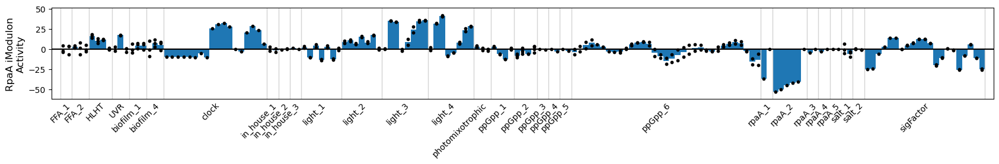

In [253]:
plot_activities(ica_data,'RpaA')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

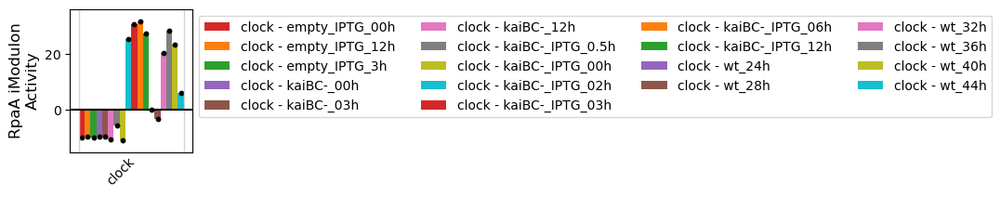

In [269]:
plot_activities(ica_data,'RpaA',projects='clock')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

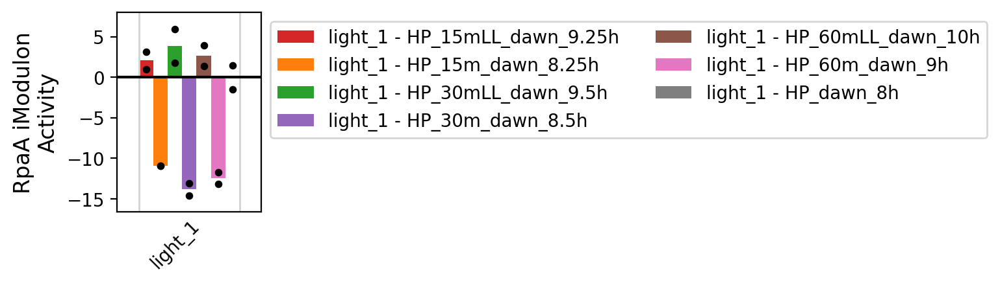

In [438]:
plot_activities(ica_data,'RpaA',projects='light_1')

<AxesSubplot:ylabel='UV iModulon\nActivity'>

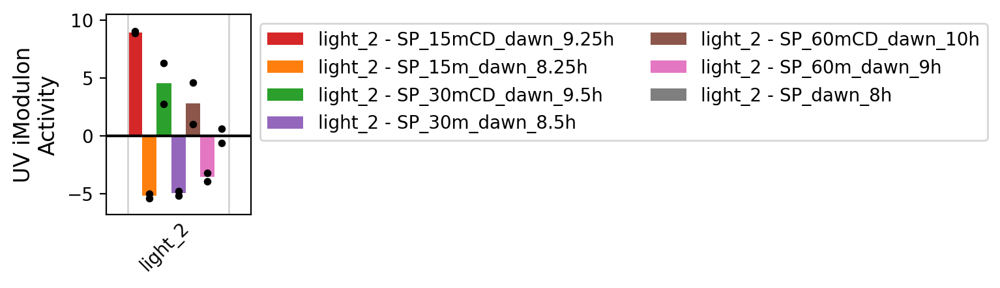

In [449]:
plot_activities(ica_data,'UV',projects='light_2')

<AxesSubplot:xlabel='rpaA_2:del_2dark_015', ylabel='rpaA_2:wt_2dark_015'>

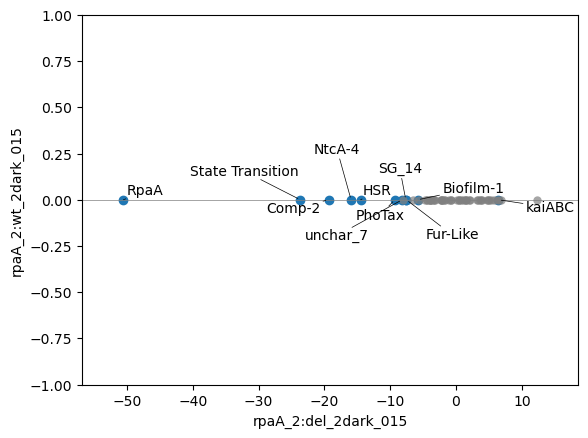

In [348]:
plot_dima(ica_data,'rpaA_2:del_2dark_015','rpaA_2:wt_2dark_015')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

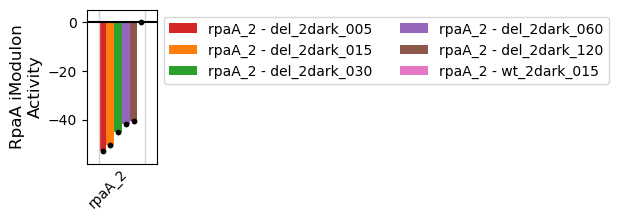

In [355]:
plot_activities(ica_data,'RpaA',projects='rpaA_2')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

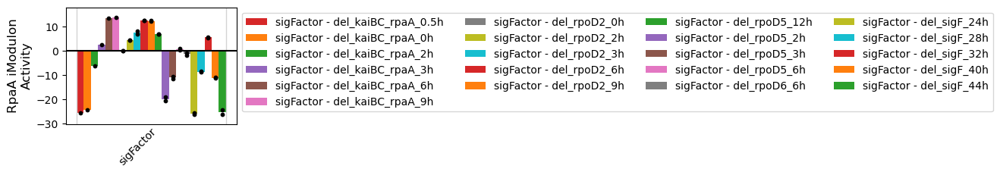

In [278]:
plot_activities(ica_data,'RpaA',projects='sigFactor')

In [252]:
ica_data.view_imodulon('RpaA').loc[set(ica_data.view_imodulon('RpaA').index) - set(rpaa_regulon)].sort_values('gene_weight',ascending=False)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0304,0.176768,Synpcc7942_0304,CP000100.1,NaN,302833,303480,+,conserved hypothetical protein,Coenzyme transport and metabolism,Q31RI3,Op254,NaN
Synpcc7942_2082,0.126375,fusA,CP000100.1,NaN,2161587,2163575,-,elongation factor EF-G,"Translation, ribosomal structure and biogenesis",Q31LF7,Op1567,NaN
Synpcc7942_1391,0.124901,Synpcc7942_1391,CP000100.1,NaN,1436154,1437692,+,Mg chelatase-related protein,"Post-translational modification, protein turno...",Q31NE8,Op1049,NaN
Synpcc7942_2461,0.121784,Synpcc7942_2461,CP000100.1,NaN,2541304,2542737,-,conserved hypothetical protein,Amino acid transport and metabolism,Q31KC8,Op1843,NaN
Synpcc7942_1567,0.116406,Synpcc7942_1567,CP000100.1,NaN,1625702,1626019,-,possible ribosomal protein L36,No COG annotation,Q31MX2,Op1184,NaN
Synpcc7942_1354,0.100505,Synpcc7942_1354,CP000100.1,NaN,1386587,1388083,+,putative export protein,Amino acid transport and metabolism,Q31NI5,Op1016,NaN
Synpcc7942_1668,0.088496,kdpA,CP000100.1,NaN,1737882,1739552,+,potassium-transporting ATPase%2C A subunit,Inorganic ion transport and metabolism,Q31MM1,Op1261,NaN
Synpcc7942_0599,0.088293,Synpcc7942_0599,CP000100.1,NaN,587802,588404,-,putative transcriptional regulator%2C TetR family,Transcription,Q31QN8,Op467,NaN
Synpcc7942_0278,0.073397,hoxE,CP000100.1,NaN,273657,274154,+,NADH:ubiquinone oxidoreductase 24 kD subunit-like,Energy production and conversion,Q31RK9,Op235,NaN
Synpcc7942_0581,0.068999,Synpcc7942_0581,CP000100.1,NaN,562634,562981,-,conserved hypothetical protein,No COG annotation,Q31QQ6,Op454,NaN


In [322]:
ica_data.view_imodulon('RpaA').loc[set(ica_data.view_imodulon('RpaA').index) - set(rpaa_regulon) - set(early+middle+late)].sort_values('gene_weight',ascending=False)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1391,0.124901,Synpcc7942_1391,CP000100.1,NaN,1436154,1437692,+,Mg chelatase-related protein,"Post-translational modification, protein turno...",Q31NE8,Op1049,NaN
Synpcc7942_1354,0.100505,Synpcc7942_1354,CP000100.1,NaN,1386587,1388083,+,putative export protein,Amino acid transport and metabolism,Q31NI5,Op1016,NaN
Synpcc7942_1668,0.088496,kdpA,CP000100.1,NaN,1737882,1739552,+,potassium-transporting ATPase%2C A subunit,Inorganic ion transport and metabolism,Q31MM1,Op1261,NaN
Synpcc7942_0278,0.073397,hoxE,CP000100.1,NaN,273657,274154,+,NADH:ubiquinone oxidoreductase 24 kD subunit-like,Energy production and conversion,Q31RK9,Op235,NaN
Synpcc7942_2551,0.068372,hypF,CP000100.1,NaN,2629750,2632062,-,(NiFe) hydrogenase maturation protein HypF,"Post-translational modification, protein turno...",Q31K38,Op1911,NaN
Synpcc7942_2238,0.067363,Synpcc7942_2238,CP000100.1,NaN,2303629,2305044,-,glucose transport protein,Amino acid transport and metabolism,Q31L01,Op1677,NaN
Synpcc7942_1653,0.066902,Synpcc7942_1653,CP000100.1,NaN,1723540,1724736,-,glycerol dehydrogenase,Energy production and conversion,Q31MN6,Op1248,NaN
Synpcc7942_1991,0.066509,mscL,CP000100.1,NaN,2061920,2062321,-,large conductance mechanosensitive channel pro...,Cell wall/membrane/envelope biogenesis,Q31LP8,Op1498,NaN
Synpcc7942_1234,0.065442,Synpcc7942_1234,CP000100.1,NaN,1254739,1255242,+,conserved hypothetical protein,"Post-translational modification, protein turno...",Q31NV5,Op933,NaN
Synpcc7942_0202,0.059481,ccoN,CP000100.1,NaN,202638,204089,-,Cbb3-type cytochrome oxidase subunit 1-like,No COG annotation,Q31RT5,Op183,NaN


In [295]:
cat = dict(collections. Counter(ica_data.view_imodulon('RpaA')['COG']))

In [296]:
l = ica_data.view_imodulon('RpaA').shape[0]
key = []
val = []
for k in cat:
    pct = round(100*cat[k]/l, 2)
    key.append(str(k)+ '(' + str(cat[k]) + ')')
    val.append(cat[k])

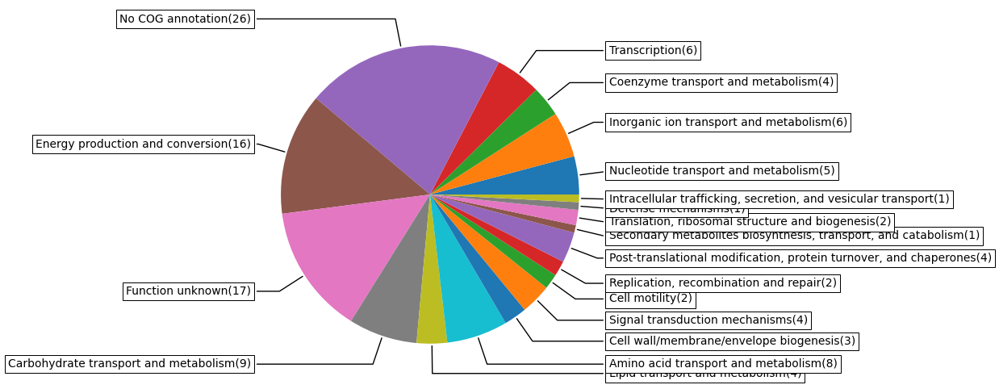

In [297]:
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw=dict(aspect="equal"))
wedges, texts = ax.pie(val)


bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(key[i], xy=(x, y), xytext=(1.2*np.sign(x),1.2*y),
                horizontalalignment=horizontalalignment, **kw)
None

{'matrix': <AxesSubplot:>,
 'shading': <AxesSubplot:>,
 'totals': <AxesSubplot:>,
 'intersections': <AxesSubplot:ylabel='Intersection size'>}

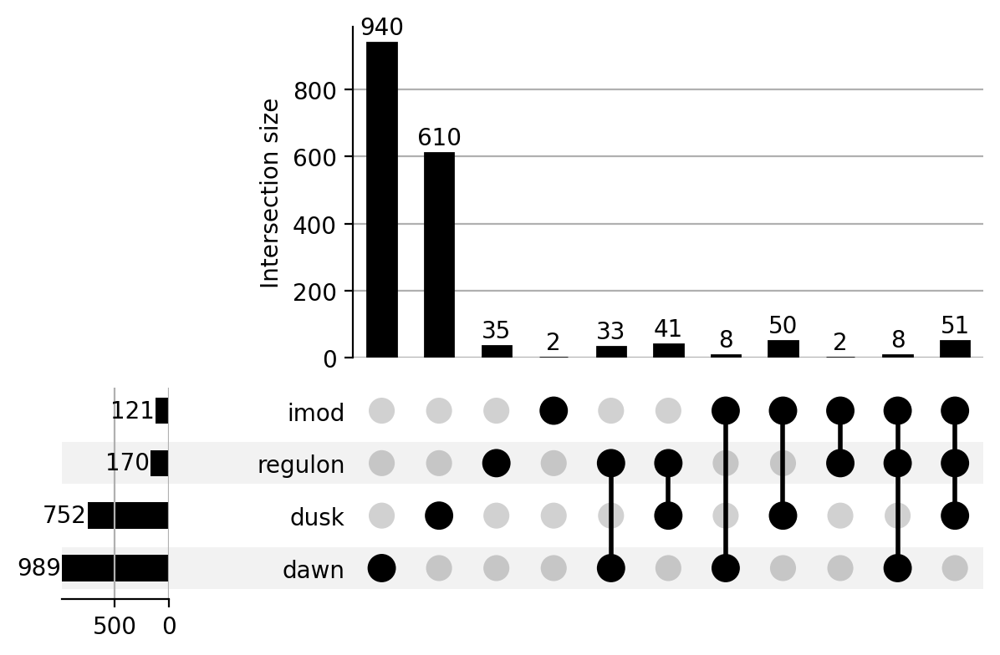

In [425]:
UpSet(from_contents({
    'dusk':set(dusk_genes),
    'dawn':set(dawn_genes),
    'imod':set(ica_data.view_imodulon('RpaA').index),
    'regulon':set(rpaa_regulon)
}),show_counts=True).plot()

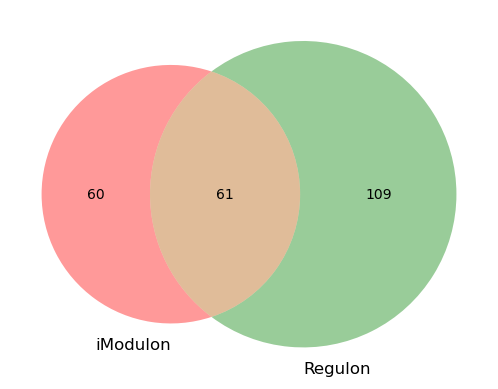

In [335]:
venn2([set(ica_data.view_imodulon('RpaA').index),set(rpaa_regulon)],
     set_labels=('iModulon','Regulon'))
# plt.savefig('/home/annie/Pictures/rpaa.pdf')

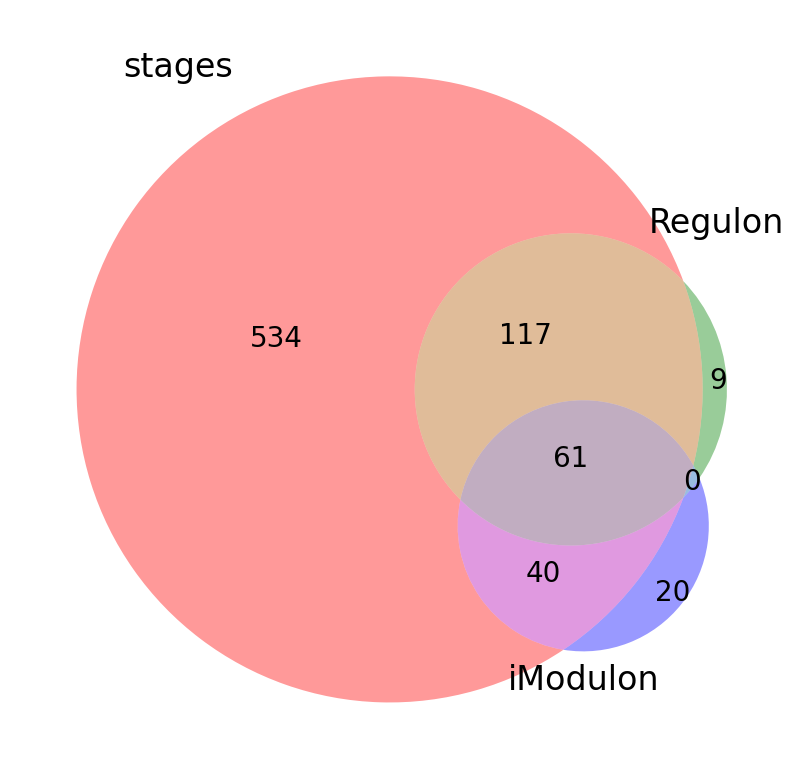

In [406]:
venn3([set(dusk_genes),set(early+middle+late),set(ica_data.view_imodulon('RpaA').index)],
     set_labels=('stages','Regulon','iModulon'))

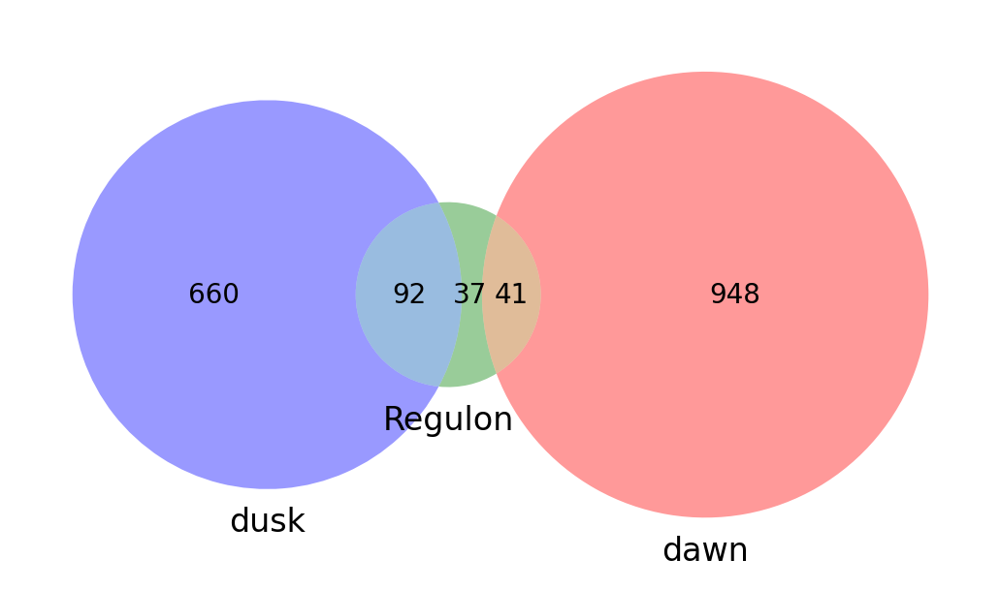

In [418]:
venn3([set(dawn_genes),set(rpaa_regulon),set(dusk_genes)],
     set_labels=('dawn','Regulon','dusk'))

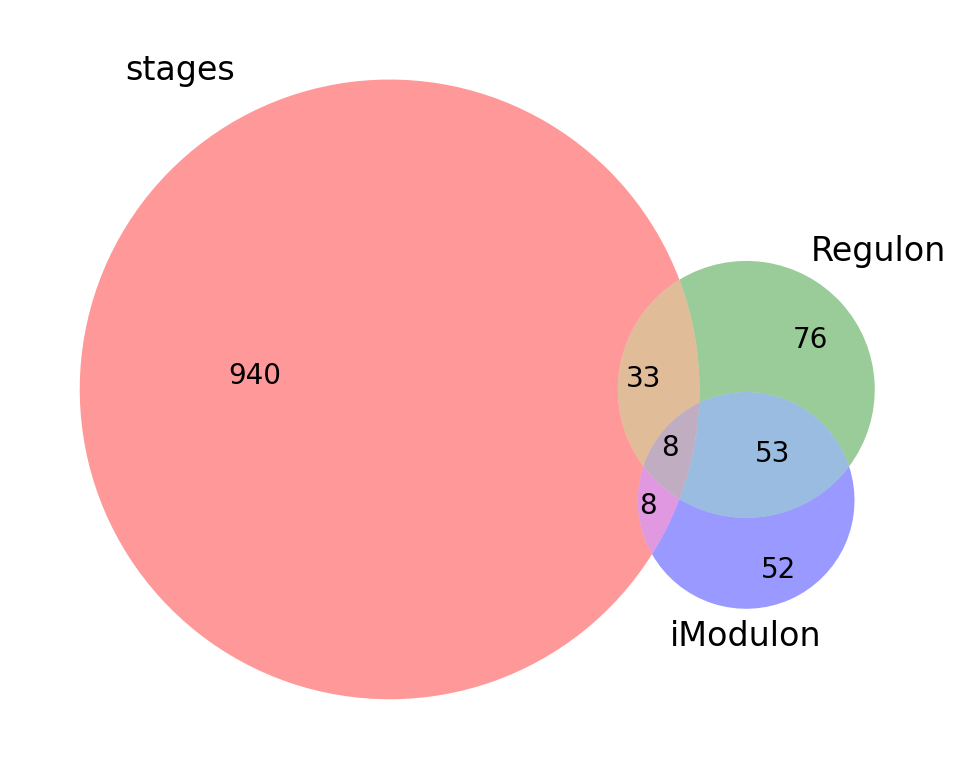

In [410]:
venn3([set(dawn_genes),set(rpaa_regulon),set(ica_data.view_imodulon('RpaA').index)],
     set_labels=('stages','Regulon','iModulon'))

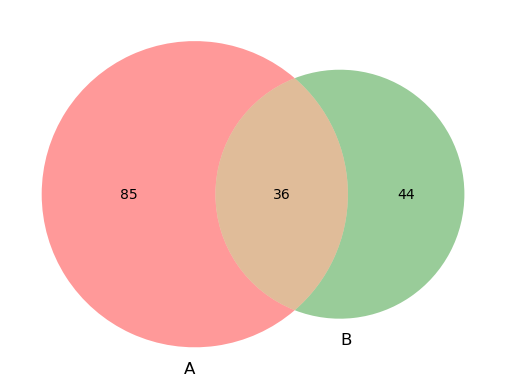

In [321]:
venn2([set(set(ica_data.view_imodulon('RpaA').index)),set(middle)])

In [66]:
# https://elifesciences.org/articles/32032
early = [
    "Synpcc7942_2487", "Synpcc7942_2369", "Synpcc7942_1809", "Synpcc7942_1125",
    "Synpcc7942_0309", "Synpcc7942_2243", "Synpcc7942_0236", "Synpcc7942_2476",
    "Synpcc7942_1275", "Synpcc7942_0577", "Synpcc7942_2367", "Synpcc7942_1827",
    "Synpcc7942_0595", "Synpcc7942_0421", "Synpcc7942_1587", "Synpcc7942_0307",
    "Synpcc7942_0096", "Synpcc7942_0686", "Synpcc7942_1656", "Synpcc7942_0668",
    "Synpcc7942_2603", "Synpcc7942_1557", "Synpcc7942_0680", "Synpcc7942_1108",
    "Synpcc7942_0383", "Synpcc7942_2604", "Synpcc7942_2602", "Synpcc7942_0687",
    "Synpcc7942_0199", "Synpcc7942_0316", "Synpcc7942_0201", "Synpcc7942_1804",
    "Synpcc7942_0556", "Synpcc7942_0198", "Synpcc7942_1960"
]

middle = [
    "Synpcc7942_0223", "Synpcc7942_2500", "Synpcc7942_1466", "Synpcc7942_0781",
    "Synpcc7942_0267", "Synpcc7942_2609", "Synpcc7942_2499", "Synpcc7942_1976",
    "Synpcc7942_1567", "Synpcc7942_1460", "Synpcc7942_1445", "Synpcc7942_0215",
    "Synpcc7942_1506", "Synpcc7942_1397", "Synpcc7942_0770", "Synpcc7942_2498",
    "Synpcc7942_1446", "Synpcc7942_1914", "Synpcc7942_0571", "Synpcc7942_2185",
    "Synpcc7942_2200", "Synpcc7942_2002", "Synpcc7942_2352", "Synpcc7942_1572",
    "Synpcc7942_0391", "Synpcc7942_2297", "Synpcc7942_1115", "Synpcc7942_1646",
    "Synpcc7942_2384", "Synpcc7942_1195", "Synpcc7942_1573", "Synpcc7942_2388",
    "Synpcc7942_0422", "Synpcc7942_2385", "Synpcc7942_2326", "Synpcc7942_2103",
    "Synpcc7942_0369", "Synpcc7942_1678", "Synpcc7942_1987", "Synpcc7942_2306",
    "Synpcc7942_2333", "Synpcc7942_2387", "Synpcc7942_1402", "Synpcc7942_2334",
    "Synpcc7942_2484", "Synpcc7942_2307", "Synpcc7942_1849", "Synpcc7942_0305",
    "Synpcc7942_0989", "Synpcc7942_2335", "Synpcc7942_2080", "Synpcc7942_0244",
    "Synpcc7942_1150", "Synpcc7942_0527", "Synpcc7942_2079", "Synpcc7942_0581",
    "Synpcc7942_0370", "Synpcc7942_1949", "Synpcc7942_2556", "Synpcc7942_1950",
    "Synpcc7942_0245", "Synpcc7942_1757", "Synpcc7942_0769", "Synpcc7942_2308",
    "Synpcc7942_0304", "Synpcc7942_2557", "Synpcc7942_1209", "Synpcc7942_2082",
    "Synpcc7942_2336", "Synpcc7942_0086", "Synpcc7942_1830", "Synpcc7942_0644",
    "Synpcc7942_2485", "Synpcc7942_1290", "Synpcc7942_2486", "Synpcc7942_0491",
    "Synpcc7942_0780", "Synpcc7942_1824", "Synpcc7942_0180", "Synpcc7942_0252"
]
late = [
    "Synpcc7942_2349", "Synpcc7942_2540", "Synpcc7942_2096", "Synpcc7942_2458",
    "Synpcc7942_0768", "Synpcc7942_1411", "Synpcc7942_2432", "Synpcc7942_0401",
    "Synpcc7942_2535", "Synpcc7942_0100", "Synpcc7942_0573", "Synpcc7942_0522",
    "Synpcc7942_2507", "Synpcc7942_1784", "Synpcc7942_2553", "Synpcc7942_0033",
    "Synpcc7942_1327", "Synpcc7942_0703", "Synpcc7942_1096", "Synpcc7942_1777",
    "Synpcc7942_1412", "Synpcc7942_0256", "Synpcc7942_0834", "Synpcc7942_0704",
    "Synpcc7942_1420", "Synpcc7942_2590", "Synpcc7942_2187", "Synpcc7942_2591",
    "Synpcc7942_1610", "Synpcc7942_1227", "Synpcc7942_1612", "Synpcc7942_0599",
    "Synpcc7942_2346", "Synpcc7942_0647", "Synpcc7942_0312", "Synpcc7942_1095",
    "Synpcc7942_1556", "Synpcc7942_0032", "Synpcc7942_1838", "Synpcc7942_1611",
    "Synpcc7942_1064", "Synpcc7942_2461", "Synpcc7942_0069", "Synpcc7942_1776",
    "Synpcc7942_0677", "Synpcc7942_1396", "Synpcc7942_2301", "Synpcc7942_0499",
    "Synpcc7942_1636", "Synpcc7942_2254", "Synpcc7942_2192", "Synpcc7942_1019",
    "Synpcc7942_0705", "Synpcc7942_0590", "Synpcc7942_1696", "Synpcc7942_0355",
    "Synpcc7942_1419", "Synpcc7942_2404", "Synpcc7942_0423", "Synpcc7942_1865",
    "Synpcc7942_0291", "Synpcc7942_1661", "Synpcc7942_2554", "Synpcc7942_1040",
    "Synpcc7942_0529", "Synpcc7942_2253", "Synpcc7942_0963", "Synpcc7942_0477",
    "Synpcc7942_1416", "Synpcc7942_1871", "Synpcc7942_1499", "Synpcc7942_1057"
]

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

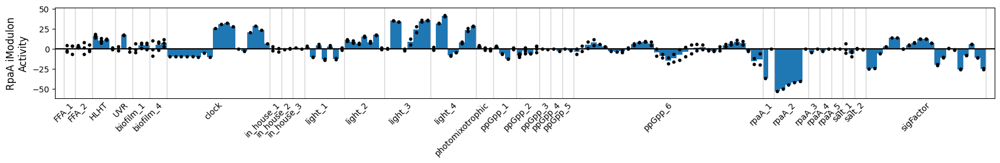

In [966]:
plot_activities(ica_data,'RpaA')

wt_24:subjective dawn   wt_36:subjective dusk <br>
strains are del_rpaA_del_kaiBC_RpaA~P<br>
empty: del_rpaA_del_kaiBC_<br>

See the activity of the RpaA iModulon increase when the strain has phosphomimetic RpaA and IPTG expression induction. Also high activity around subjective dusk. Highly consistent with literature

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

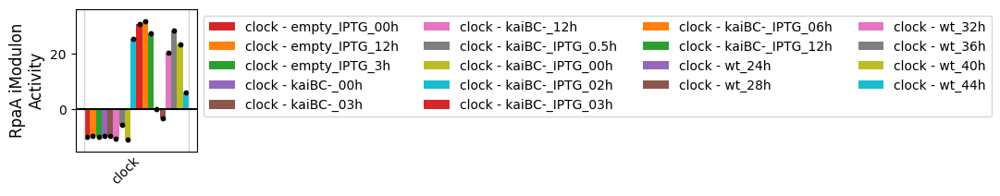

In [967]:
plot_activities(ica_data,'RpaA',projects='clock')

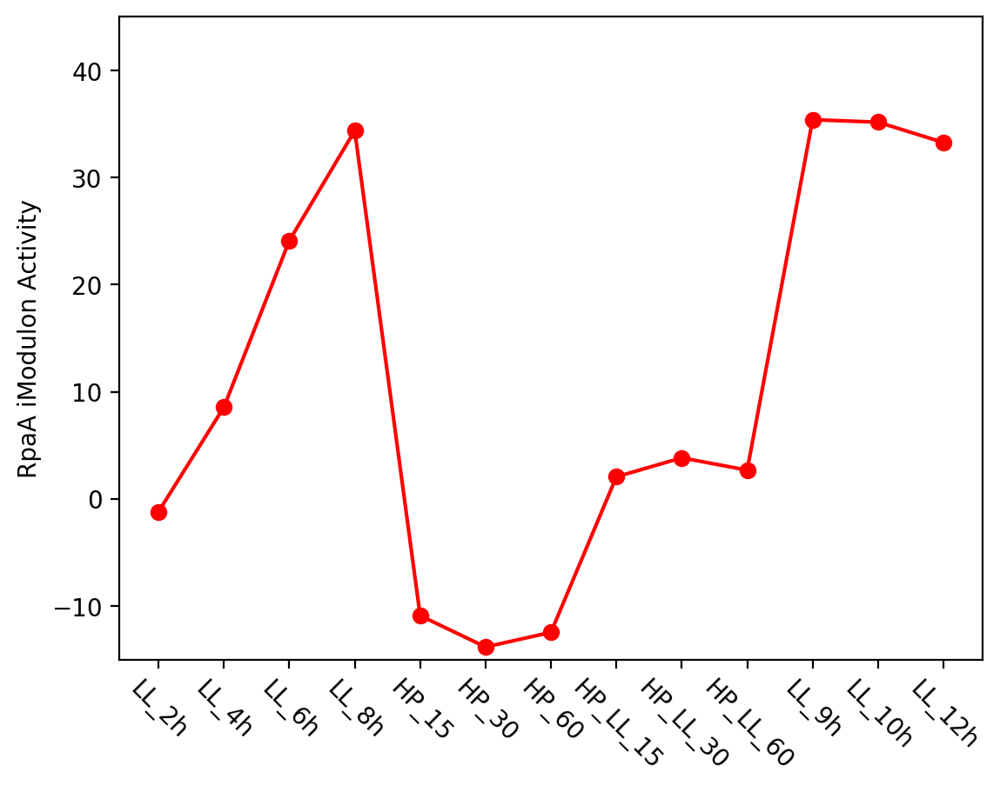

In [656]:
plt.plot(high_light(ica_data,['RpaA']).T,'-ro')
plt.xticks(rotation=-45)
plt.ylabel('RpaA iModulon Activity')
plt.ylim([-15,45])
# plt.savefig('/home/annie/Documents/high_light.pdf',bbox_inches='tight')
None

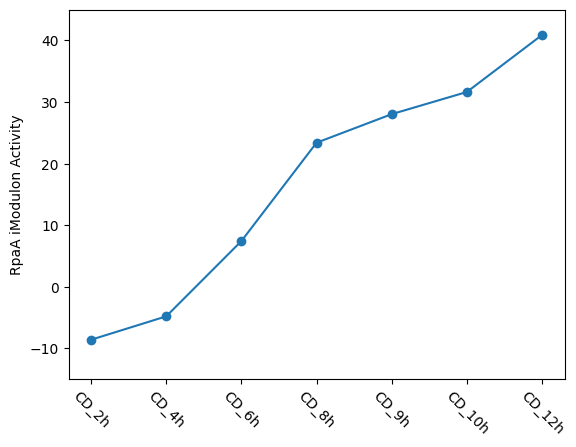

In [110]:
plt.plot(light4_activity(ica_data,['RpaA']).T,'-o')
plt.xticks(rotation=-45)
plt.ylabel('RpaA iModulon Activity')
plt.ylim([-15,45])
plt.savefig('/home/annie/Documents/Clear_day.pdf',bbox_inches='tight')
None

In [8]:
wt_time_idx = ica_data.sample_table[ica_data.sample_table['project'] == 'clock']['condition'][0:6].index

In [38]:
ica_data.sample_table[ica_data.sample_table['project'] == 'clock']['condition']

SRX359366              wt_24h
SRX359367              wt_28h
SRX359368              wt_32h
SRX359369              wt_36h
SRX359370              wt_40h
SRX359371              wt_44h
SRX359372     kaiBC-_IPTG_00h
SRX359373    kaiBC-_IPTG_0.5h
SRX359374     kaiBC-_IPTG_02h
SRX359375     kaiBC-_IPTG_03h
SRX359376     kaiBC-_IPTG_06h
SRX359377     kaiBC-_IPTG_12h
SRX359378          kaiBC-_00h
SRX359379          kaiBC-_03h
SRX359380          kaiBC-_12h
SRX359381      empty_IPTG_00h
SRX359382       empty_IPTG_3h
SRX359383      empty_IPTG_12h
Name: condition, dtype: object

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

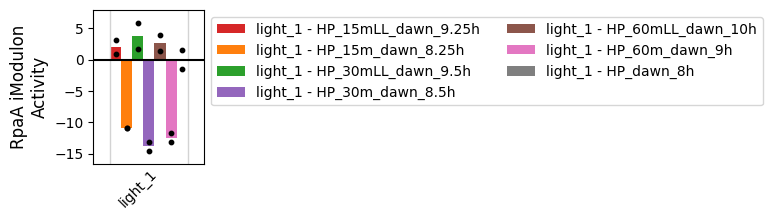

In [1763]:
plot_activities(ica_data,'RpaA',projects='light_1')

In [195]:
# https://www.pnas.org/doi/full/10.1073/pnas.0912673106
dusk_dawn = pd.read_excel('~/Downloads/sd1.xlsx',sheet_name = 'Analysis of Circadian Gene Exp',index_col=0)

In [196]:
dusk_genes = dusk_dawn[dusk_dawn['Non-Circadian 0, Dusk 1, Dawn 2'] == 1]['7942 ID'].dropna()
dawn_genes = dusk_dawn[dusk_dawn['Non-Circadian 0, Dusk 1, Dawn 2'] == 2]['7942 ID'].dropna()

In [1004]:
ica_data.sample_table.loc[wt_time_idx]['condition']

SRX359366    wt_24h
SRX359367    wt_28h
SRX359368    wt_32h
SRX359369    wt_36h
SRX359370    wt_40h
SRX359371    wt_44h
Name: condition, dtype: object

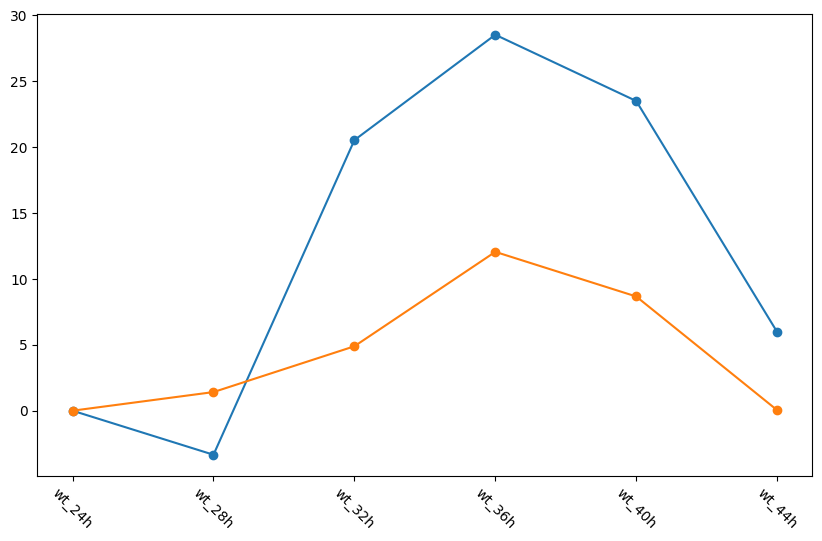

In [9]:
plt.figure(figsize = (10,6))
for i in ['RpaA','Comp-2']:
#     plt.figure(figsize = (14,6))
    plt.plot(ica_data.A[wt_time_idx].loc[i],'-o')
    plt.xticks(range(6),ica_data.sample_table.loc[wt_time_idx]['condition'],rotation=-45)
#     plt.title(i)

Time information encoded in the PTO is read out through the histidine kinases SasA and CikA, which antagonistically regulate RpaA phosphorylation to generate oscillations of RpaA~P that peak at or immediately preceding subjective dusk. The accumulation of RpaA~P switches the cell’s gene expression program from subjective dawn to subjective dusk via transcriptional programs hardwired into the RpaA regulon. RpaA~P accumulation also initiates closure of the cell division gate. RpaA~P decreases during the subjective night, allowing gene expression to revert to its default dawn-like state and also opening the cell division gate.

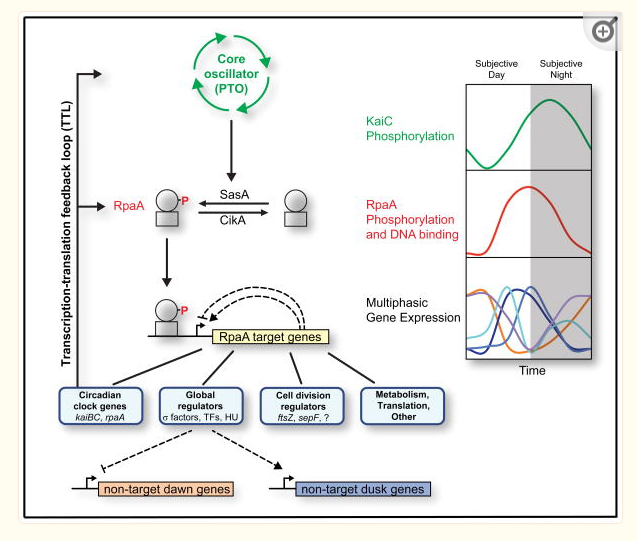

Activity of RpaA peaks right before dusk (12 hours since dawn) <br>
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5785211/ <br>
https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE104203

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

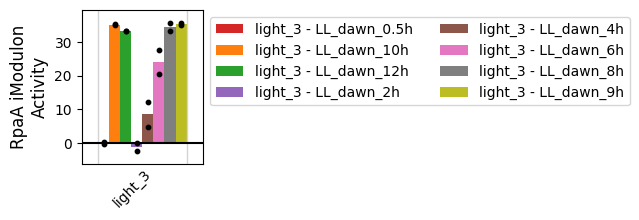

In [969]:
plot_activities(ica_data,'RpaA',projects='light_3')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

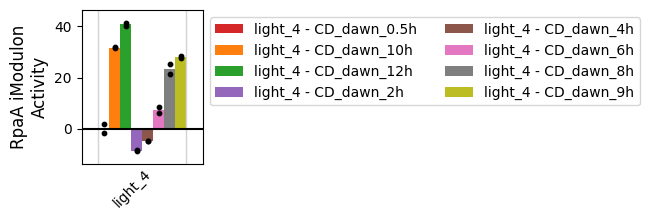

In [970]:
plot_activities(ica_data,'RpaA',projects='light_4')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

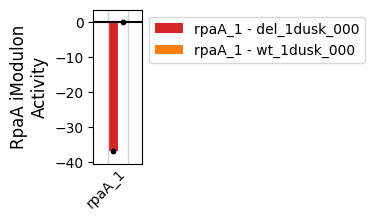

In [972]:
plot_activities(ica_data,'RpaA',projects='rpaA_1')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

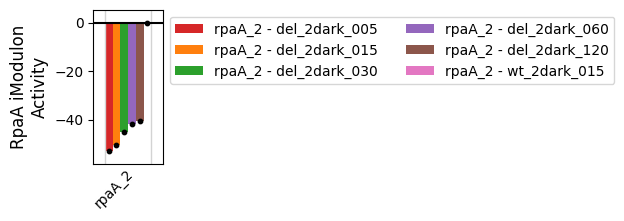

In [971]:
plot_activities(ica_data,'RpaA',projects='rpaA_2')

## Regulatory -- NtcA-1, NtcA-2

<AxesSubplot:>

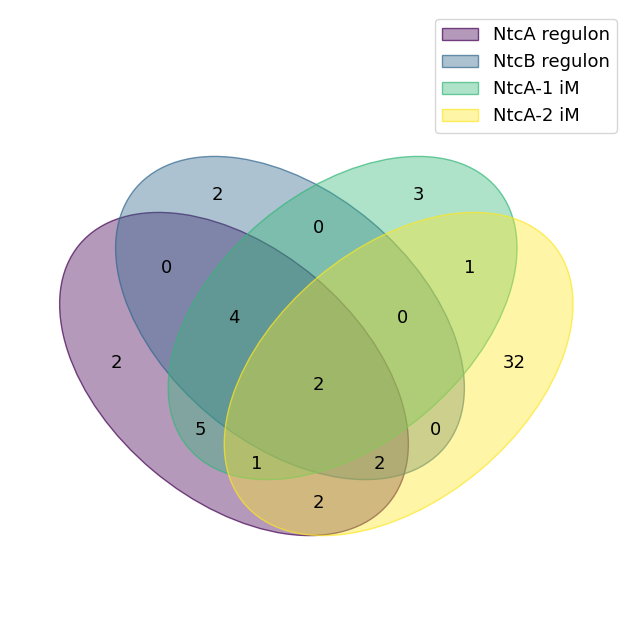

In [797]:
venn({'NtcA regulon':set(ica_data.trn[ica_data.trn.regulator=='ntcA'].gene_id),
      'NtcB regulon':set(ica_data.trn[ica_data.trn.regulator=='ntcB'].gene_id),
      'NtcA-1 iM':set(ica_data.view_imodulon('NtcA-1').index),
      'NtcA-2 iM':set(ica_data.view_imodulon('NtcA-2').index)})

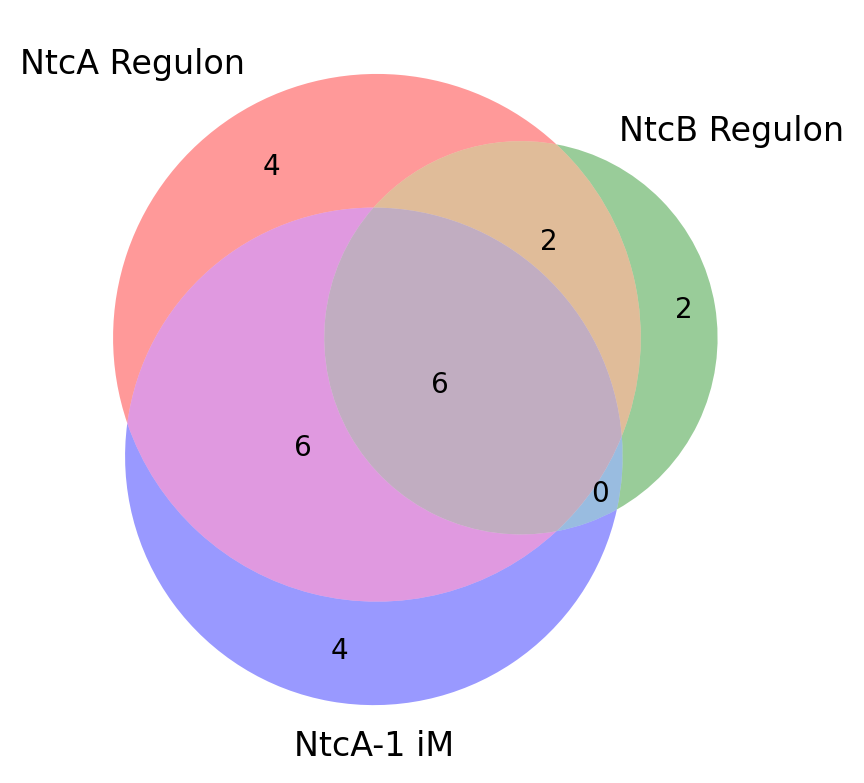

In [748]:
venn3([set(ica_data.trn[ica_data.trn.regulator=='ntcA'].gene_id),
       set(ica_data.trn[ica_data.trn.regulator=='ntcB'].gene_id),
      set(ica_data.view_imodulon('NtcA-1').index)],
      set_labels=['NtcA Regulon','NtcB Regulon','NtcA-1 iM'])

<AxesSubplot:xlabel='NtcA-1 iModulon Activity', ylabel='NtcA-2 iModulon Activity'>

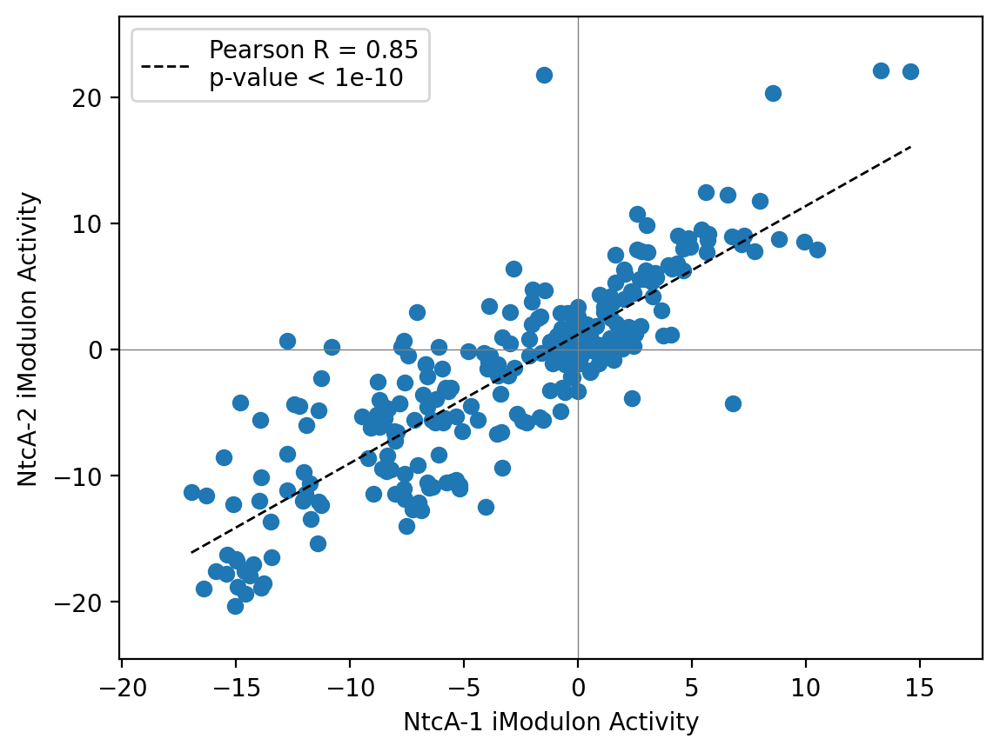

In [704]:
compare_activities(ica_data,'NtcA-1','NtcA-2')

<AxesSubplot:xlabel='Gene Start', ylabel='NtcA-1 Gene Weight'>

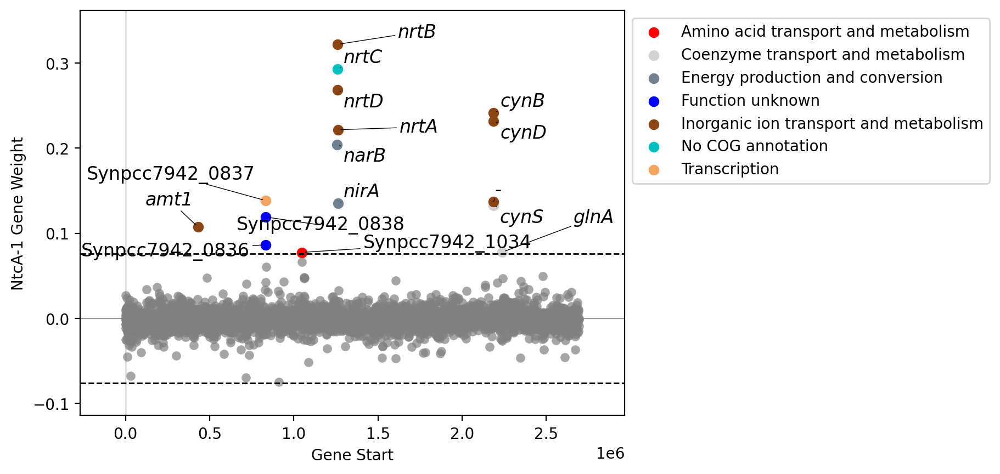

In [708]:
plot_gene_weights(ica_data,'NtcA-1')

<AxesSubplot:ylabel='NtcA-1 iModulon\nActivity'>

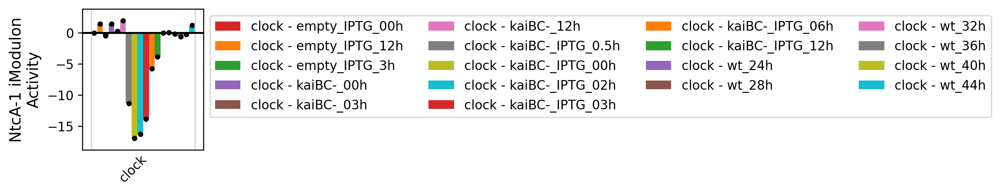

In [752]:
plot_activities(ica_data,'NtcA-1',projects='clock')

In [753]:
nitrogen_starvation = pd.read_excel('/home/annie/Downloads/srep30584-s1.xls')

ImportError: Missing optional dependency 'xlrd'. Install xlrd >= 1.0.0 for Excel support Use pip or conda to install xlrd.

In [745]:
ica_data.view_imodulon('NtcA-2')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0037,0.088739,Synpcc7942_0037,CP000100.1,,36123,36326,-,hypothetical protein,No COG annotation,Q31SA0,Op59,
Synpcc7942_0115,0.054752,-,CP000100.1,,113631,114146,-,conserved hypothetical protein,Cell wall/membrane/envelope biogenesis,Q31S22,Op123,
Synpcc7942_0127,0.109176,ntcA,CP000100.1,,126390,127058,+,transcriptional regulator%2C Crp/Fnr family,Transcription,P29283,Op133,ntcA
Synpcc7942_0169,0.091217,glnN,CP000100.1,,168176,170347,+,glutamate-ammonia ligase%2C glutamine syntheta...,Function unknown,Q31RW8,Op162,
Synpcc7942_0303,0.168140,Synpcc7942_0303,CP000100.1,,301543,302697,+,response regulator receiver domain protein (Ch...,Inorganic ion transport and metabolism,Q31RI4,Op253,
Synpcc7942_0342,0.080609,Synpcc7942_0342,CP000100.1,,336363,336590,+,hypothetical protein,No COG annotation,Q31RE5,Op278,
Synpcc7942_0365,0.143965,Synpcc7942_0365,CP000100.1,,356676,357305,+,response regulator receiver domain protein (Ch...,Signal transduction mechanisms,Q31RC2,Op297,
Synpcc7942_0569,0.052823,sigA4,CP000100.1,,550718,551653,-,DNA-directed RNA polymerase sigma subunit (sig...,Transcription,Q31QR8,Op444,
Synpcc7942_0838,0.089039,Synpcc7942_0838,CP000100.1,,832860,833957,-,Elongator protein 3/MiaB/NifB,Function unknown,Q31Q00,Op643,
Synpcc7942_0839,0.189129,Synpcc7942_0839,CP000100.1,,833950,834954,-,Nitrilase,Function unknown,Q31PZ9,Op643,


In [731]:
ica_data.imodulon_table.reset_index()

,index,regulator,pvalue,qvalue,precision,recall,f1score,TP,regulon_size,imodulon_size,n_regs,single_gene,explained_variance,category
0,ccm-1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,NaN,,0.005086,functional
1,PSII,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,NaN,,0.005835,functional
2,ribosome-1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26,NaN,,0.009849,functional
3,SG_1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,NaN,True,0.001377,single_gene
4,SG_2,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,True,0.001744,single_gene
5,kaiABC,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,NaN,,0.005302,functional
6,UV,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77,NaN,,0.018320,uncharacterized
7,unchar_1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,NaN,,0.010668,uncharacterized
8,unchar_2,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45,NaN,,0.013696,uncharacterized
9,SG_3,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,NaN,True,0.001553,single_gene


<AxesSubplot:xlabel='Gene Start', ylabel='sigA2 Gene Weight'>

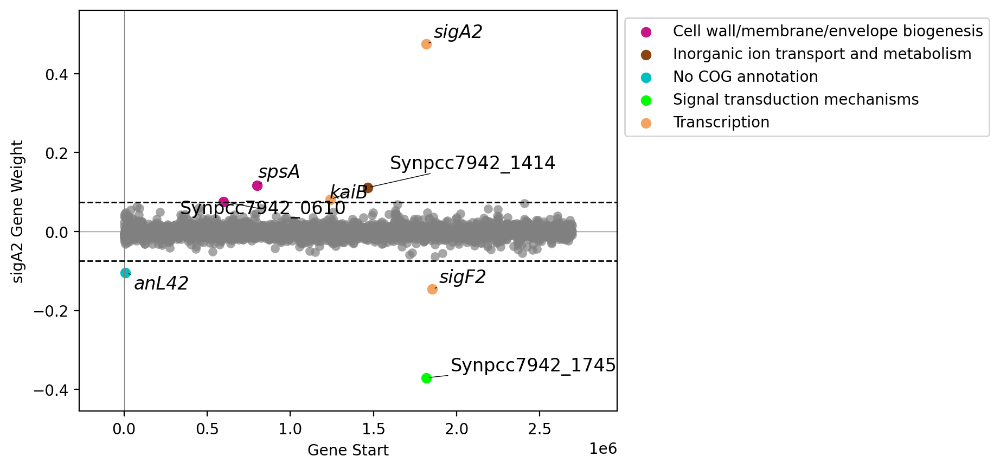

In [737]:
plot_gene_weights(ica_data,'sigA2')

<AxesSubplot:ylabel='sigA2 iModulon\nActivity'>

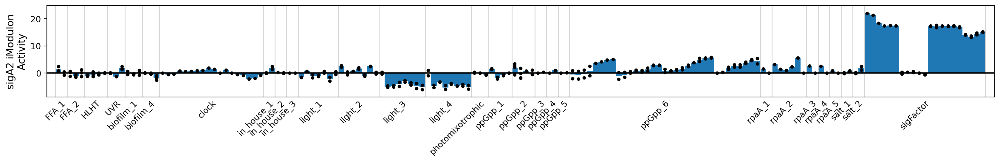

In [738]:
plot_activities(ica_data,'sigA2')

In [733]:
DF_enrichments[20:30]

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
20,14,regulation of circadian rhythm,0.002997,0.042962,0.125000,1.000000,0.222222,1.0,1.0,8.0,GO,NaN,NaN
21,14,entrainment of circadian clock,0.008969,0.096412,0.125000,0.333333,0.181818,1.0,3.0,8.0,GO,NaN,NaN
22,25,heme binding,0.010865,0.066745,0.034483,1.000000,0.066667,1.0,1.0,29.0,GO,NaN,NaN
23,25,hydrogen peroxide metabolic process,0.010865,0.066745,0.034483,1.000000,0.066667,1.0,1.0,29.0,GO,NaN,NaN
24,25,iron ion binding,0.010865,0.066745,0.034483,1.000000,0.066667,1.0,1.0,29.0,GO,NaN,NaN
25,25,oxidation-reduction process,0.010865,0.066745,0.034483,1.000000,0.066667,1.0,1.0,29.0,GO,NaN,NaN
26,25,periplasmic space,0.010865,0.066745,0.034483,1.000000,0.066667,1.0,1.0,29.0,GO,NaN,NaN
27,25,peroxidase activity,0.010865,0.066745,0.034483,1.000000,0.066667,1.0,1.0,29.0,GO,NaN,NaN
28,25,peroxidase activity|iron ion binding|periplasm...,0.010865,0.066745,0.034483,1.000000,0.066667,1.0,1.0,29.0,GO,NaN,NaN
29,33,circadian regulation of translation|circadian ...,0.002039,0.087680,0.016529,1.000000,0.032520,2.0,2.0,121.0,GO,NaN,NaN


In [714]:
ica_data.view_imodulon('NtcA-2')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0037,0.088739,Synpcc7942_0037,CP000100.1,,36123,36326,-,hypothetical protein,No COG annotation,Q31SA0,Op59,
Synpcc7942_0115,0.054752,-,CP000100.1,,113631,114146,-,conserved hypothetical protein,Cell wall/membrane/envelope biogenesis,Q31S22,Op123,
Synpcc7942_0127,0.109176,ntcA,CP000100.1,,126390,127058,+,transcriptional regulator%2C Crp/Fnr family,Transcription,P29283,Op133,ntcA
Synpcc7942_0169,0.091217,glnN,CP000100.1,,168176,170347,+,glutamate-ammonia ligase%2C glutamine syntheta...,Function unknown,Q31RW8,Op162,
Synpcc7942_0303,0.168140,Synpcc7942_0303,CP000100.1,,301543,302697,+,response regulator receiver domain protein (Ch...,Inorganic ion transport and metabolism,Q31RI4,Op253,
Synpcc7942_0342,0.080609,Synpcc7942_0342,CP000100.1,,336363,336590,+,hypothetical protein,No COG annotation,Q31RE5,Op278,
Synpcc7942_0365,0.143965,Synpcc7942_0365,CP000100.1,,356676,357305,+,response regulator receiver domain protein (Ch...,Signal transduction mechanisms,Q31RC2,Op297,
Synpcc7942_0569,0.052823,sigA4,CP000100.1,,550718,551653,-,DNA-directed RNA polymerase sigma subunit (sig...,Transcription,Q31QR8,Op444,
Synpcc7942_0838,0.089039,Synpcc7942_0838,CP000100.1,,832860,833957,-,Elongator protein 3/MiaB/NifB,Function unknown,Q31Q00,Op643,
Synpcc7942_0839,0.189129,Synpcc7942_0839,CP000100.1,,833950,834954,-,Nitrilase,Function unknown,Q31PZ9,Op643,


<AxesSubplot:ylabel='NtcA-2 iModulon\nActivity'>

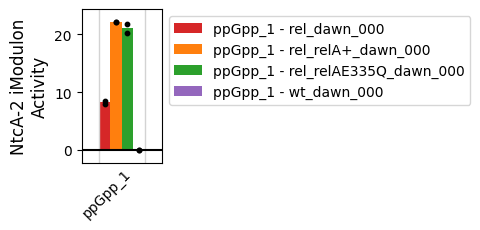

In [762]:
plot_activities(ica_data,'NtcA-2',projects='ppGpp_1')

<AxesSubplot:ylabel='NtcA-1 iModulon\nActivity'>

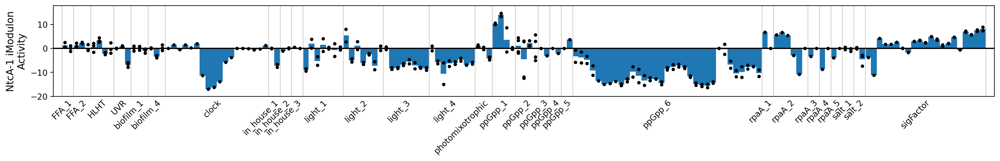

In [566]:
plot_activities(ica_data,'NtcA-1')

<AxesSubplot:ylabel='NtcA-2 iModulon\nActivity'>

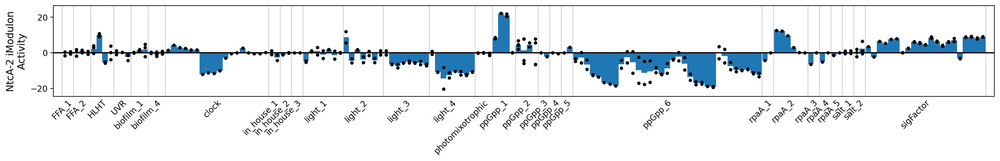

In [716]:
plot_activities(ica_data,'NtcA-2')

<AxesSubplot:ylabel='NtcA-1 iModulon\nActivity'>

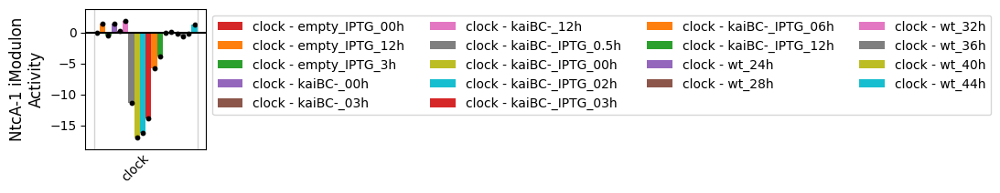

In [755]:
plot_activities(ica_data,'NtcA-1',projects='clock')

## literature validation: carbon concentrating mechanisms

In [637]:
# ica_data.rename_imodulons({'CmpR-2':'sps'})

In [458]:
ccmr = set(ica_data.trn[ica_data.trn.regulator=='ccmR'].gene_id)

In [459]:
ccmr1 = set(ica_data.view_imodulon('ccmR-1').index)

In [460]:
ccmr2 = set(ica_data.view_imodulon('ccmR-2').index)

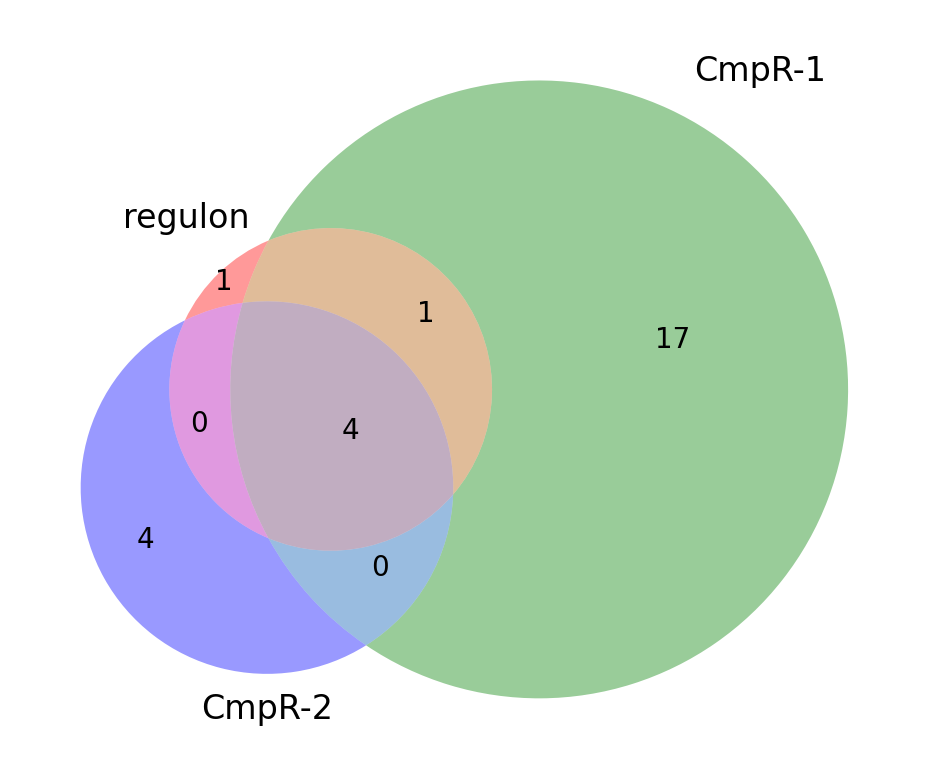

In [552]:
venn3([ccmr,ccmr1,ccmr2],set_labels=('regulon','CmpR-1','CmpR-2'))

In [572]:
ica_data.view_imodulon('ccm-1')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0900,0.125901,Synpcc7942_0900,CP000100.1,NaN,909440,909643,-,conserved hypothetical protein,No COG annotation,Q31PT9,Op689,NaN
Synpcc7942_1421,0.183955,ccmK2,CP000100.1,NaN,1475239,1475547,+,putative carboxysome assembly protein,Energy production and conversion,Q03511,Op1073,NaN
Synpcc7942_1422,0.230108,ccmL,CP000100.1,NaN,1475694,1475993,+,carbon dioxide concentrating mechanism protein...,Energy production and conversion,Q03512,Op1074,NaN
Synpcc7942_1423,0.242445,ccmM,CP000100.1,NaN,1476059,1477678,+,Carbonate dehydratase,Energy production and conversion,Q03513,Op1075,NaN
Synpcc7942_1424,0.207627,ccmN,CP000100.1,NaN,1477713,1478198,+,carbon dioxide concentrating mechanism protein,Function unknown,P46204,Op1075,NaN
Synpcc7942_1426,0.172065,cbbL,CP000100.1,NaN,1479461,1480879,+,ribulose-1%2C5-bisphosphate carboxylase/oxygen...,Coenzyme transport and metabolism,Q31NB3,Op1077,NaN
Synpcc7942_1427,0.184956,cbbS,CP000100.1,NaN,1480970,1481305,+,ribulose 1%2C5-bisphosphate carboxylase small ...,Energy production and conversion,Q31NB2,Op1077,NaN
Synpcc7942_1447,0.104194,ccaA,CP000100.1,NaN,1500489,1501307,+,Carbonate dehydratase,Inorganic ion transport and metabolism,P27134,Op1095,NaN
Synpcc7942_1476,-0.107101,Synpcc7942_1476,CP000100.1,NaN,1527717,1528031,+,conserved hypothetical protein,Amino acid transport and metabolism,Q31N63,Op1114,NaN
Synpcc7942_1673,0.134972,Synpcc7942_1673,CP000100.1,NaN,1743189,1743854,-,conserved hypothetical protein,Signal transduction mechanisms,Q31ML6,Op1264,NaN


In [557]:
ica_data.view_imodulon('ccm-2')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0074,-0.067794,Synpcc7942_0074,CP000100.1,NaN,73306,73659,-,conserved hypothetical protein,No COG annotation,Q31S63,Op93,NaN
Synpcc7942_0834,0.065401,Synpcc7942_0834,CP000100.1,NaN,828582,829235,+,conserved hypothetical protein,No COG annotation,Q31Q04,Op640,NaN
Synpcc7942_1345,0.074989,ndhG,CP000100.1,NaN,1378990,1379595,+,NADH dehydrogenase subunit 6,Energy production and conversion,Q31NJ4,Op1011,NaN
Synpcc7942_1346,0.076882,ndhE,CP000100.1,NaN,1379614,1379925,+,NADH dehydrogenase subunit 4L,Energy production and conversion,Q31NJ3,Op1011,NaN
Synpcc7942_1468,0.075560,mnhB1,CP000100.1,NaN,1521482,1522141,-,putative multicomponent Na+:H+ antiporter subu...,Inorganic ion transport and metabolism,Q31N71,Op1111,NaN
Synpcc7942_1469,0.088137,mnhB2,CP000100.1,NaN,1522138,1522719,-,putative multicomponent Na+:H+ antiporter subu...,Inorganic ion transport and metabolism,Q31N70,Op1111,NaN
Synpcc7942_1470,0.096660,-,CP000100.1,NaN,1522712,1523005,-,conserved hypothetical protein,Inorganic ion transport and metabolism,Q31N69,Op1112,NaN
Synpcc7942_1471,0.097226,Synpcc7942_1471,CP000100.1,NaN,1523002,1523259,-,conserved hypothetical protein,No COG annotation,Q31N68,Op1111,NaN
Synpcc7942_1472,0.116698,Synpcc7942_1472,CP000100.1,NaN,1523256,1523642,-,conserved hypothetical protein,Inorganic ion transport and metabolism,Q31N67,Op1111,NaN
Synpcc7942_1473,0.135673,mnhD,CP000100.1,NaN,1523639,1525081,-,putative multicomponent Na+:H+ antiporter subu...,Energy production and conversion,Q31N66,Op1111,NaN


In [519]:
all_genes = set()
for i in ica_data.imodulon_names:
    imod_genes = set(ica_data.view_imodulon(i).index)
    all_genes = all_genes.union(imod_genes)

<AxesSubplot:xlabel='Gene Start', ylabel='ccm-1 Gene Weight'>

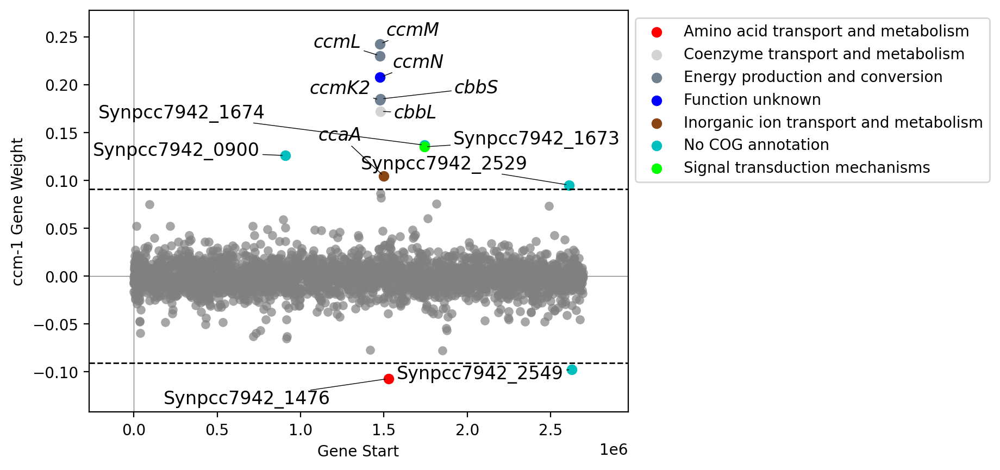

In [573]:
plot_gene_weights(ica_data,'ccm-1')

<AxesSubplot:xlabel='Gene Start', ylabel='CmpR-2 Gene Weight'>

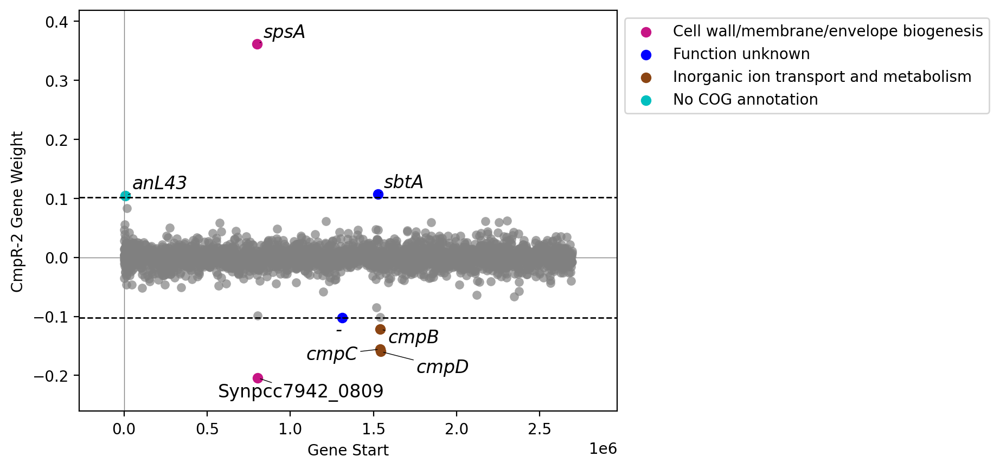

In [634]:
plot_gene_weights(ica_data,'CmpR-2')

<AxesSubplot:ylabel='ccm-1 iModulon\nActivity'>

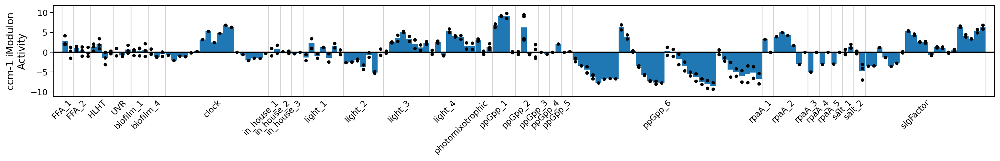

In [682]:
plot_activities(ica_data,'ccm-1')

<AxesSubplot:ylabel='ccm-1 iModulon\nActivity'>

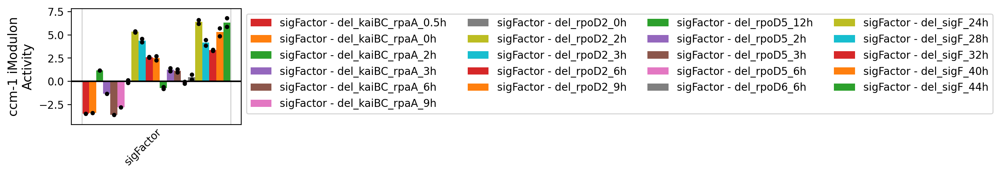

In [690]:
plot_activities(ica_data,'ccm-1',projects='sigFactor')

<AxesSubplot:xlabel='Gene Start', ylabel='ccm-2 Gene Weight'>

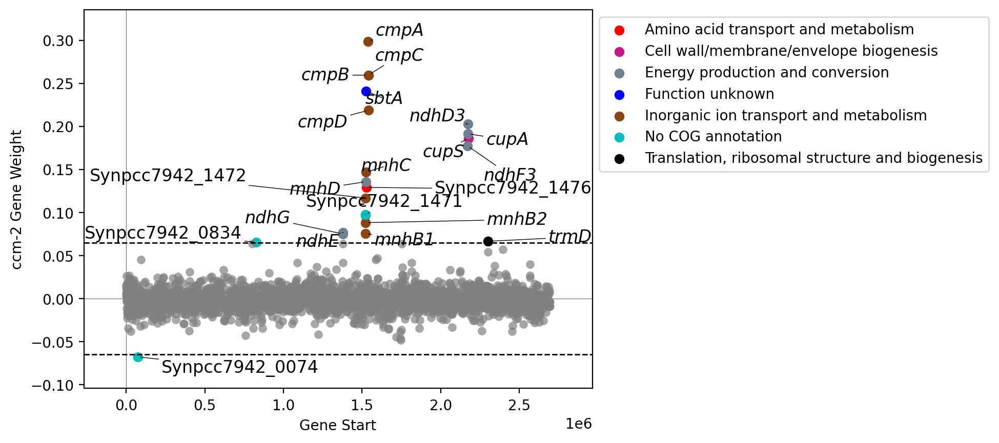

In [605]:
plot_gene_weights(ica_data,'ccm-2',show_labels=True)

<AxesSubplot:ylabel='ccm-1 iModulon\nActivity'>

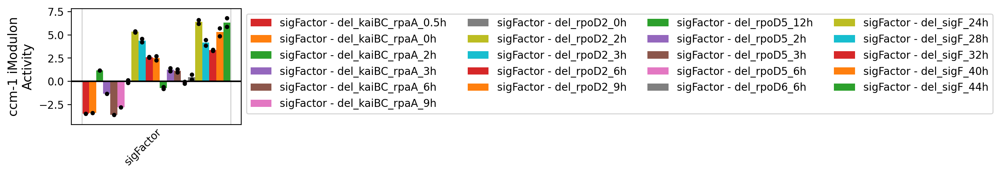

In [571]:
plot_activities(ica_data,'ccm-1')

## Functional -- UV

In [97]:
ica_data.view_imodulon('UV')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0091,0.091744,ubiC,CP000100.1,NaN,89715,90326,-,conserved hypothetical protein YCF21,Coenzyme transport and metabolism,Q31S46,Op105,NaN
Synpcc7942_0196,0.061992,bcmo1,CP000100.1,NaN,196094,197575,-,Beta-carotene 15%2C15'-dioxygenase,Energy production and conversion,Q31RU1,Op182,NaN
Synpcc7942_0197,0.083055,Synpcc7942_0197,CP000100.1,NaN,197572,198933,-,folate/biopterin transporter,Carbohydrate transport and metabolism,O68867,Op182,NaN
Synpcc7942_0217,0.085053,Synpcc7942_0217,CP000100.1,NaN,219113,219871,+,phosphatases-like,Function unknown,Q31RS0,Op196,NaN
Synpcc7942_0243,0.153191,hliC,CP000100.1,NaN,238379,238522,-,possible high light inducible polypeptide HliC,Function unknown,Q31RP4,Op214,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
Synpcc7942_2414,0.112962,Synpcc7942_2414,CP000100.1,NaN,2485595,2486650,-,conserved hypothetical protein,"Secondary metabolites biosynthesis, transport,...",Q31KH5,Op1807,NaN
Synpcc7942_2416,0.097898,Synpcc7942_2416,CP000100.1,NaN,2488440,2489207,-,two component transcriptional regulator%2C win...,Transcription,Q31KH3,Op1809,NaN
Synpcc7942_2425,0.090701,ycf39,CP000100.1,NaN,2497699,2498661,-,chaperon-like protein for quinone binding in p...,Carbohydrate transport and metabolism,Q31KG4,Op1817,NaN
Synpcc7942_2503,-0.071350,por,CP000100.1,NaN,2584495,2585460,-,chlorophyll synthase / NADPH-protochlorophylli...,Energy production and conversion,Q935X4,Op1875,NaN


<AxesSubplot:xlabel='Gene Start', ylabel='UV Gene Weight'>

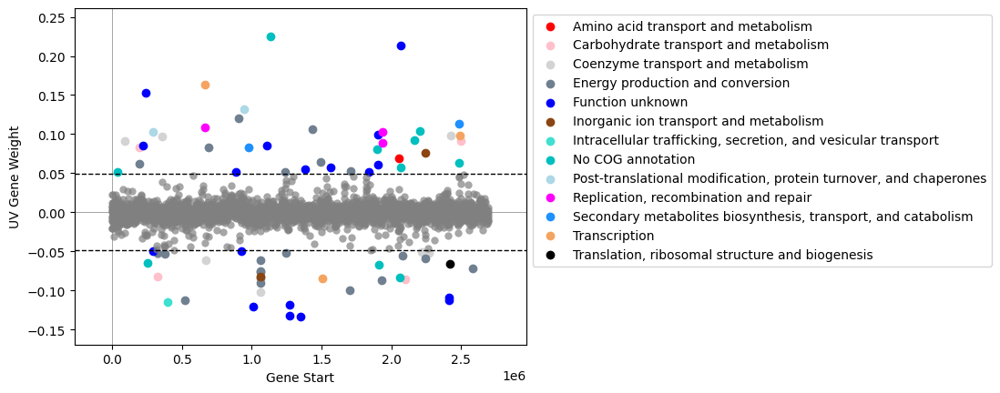

In [683]:
plot_gene_weights(ica_data,'UV')

<AxesSubplot:ylabel='UV iModulon\nActivity'>

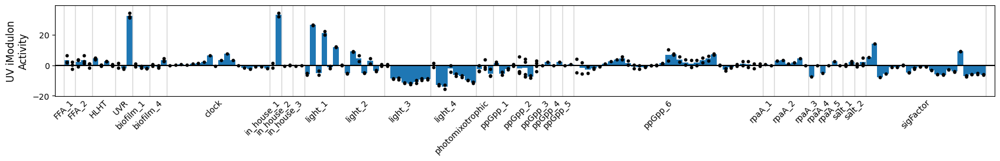

In [684]:
plot_activities(ica_data,'UV')

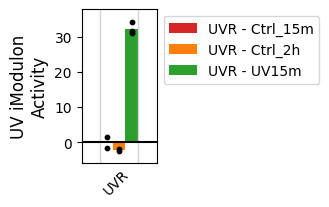

In [89]:
plot_activities(ica_data,'UV',projects = ['UVR'])
# plt.savefig('/home/annie/Documents/UV1.pdf',bbox_inches='tight')

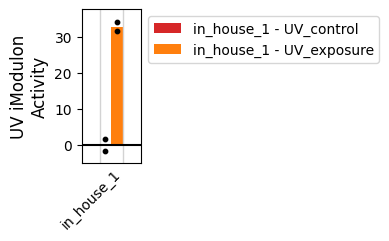

In [90]:
plot_activities(ica_data,'UV',projects = ['in_house_1'])
plt.savefig('/home/annie/Documents/UV2.pdf',bbox_inches='tight')

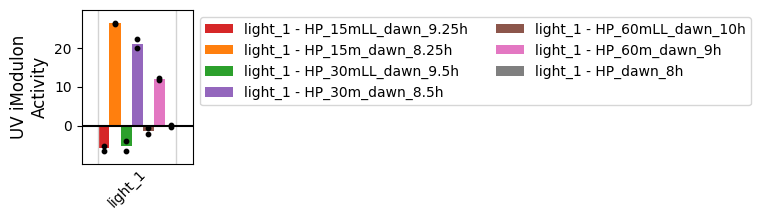

In [91]:
plot_activities(ica_data,'UV',projects = ['light_1'])
plt.savefig('/home/annie/Documents/UV3.pdf',bbox_inches='tight')

In [755]:
de = pd.read_excel('/home/annie/Downloads/pnas.2211789119.sd01.xlsx',index_col=0)

In [756]:
de_15m = de[(de['log2FoldChange_15m'] > 2) | (de['log2FoldChange_15m'] < -2) & (de['padj_15m'] < 0.05)]

In [758]:
de_2hr = de[(de['log2FoldChange_2hr'] > 2) | (de['log2FoldChange_2hr'] < -2) & (de['padj_2hr'] < 0.05)]

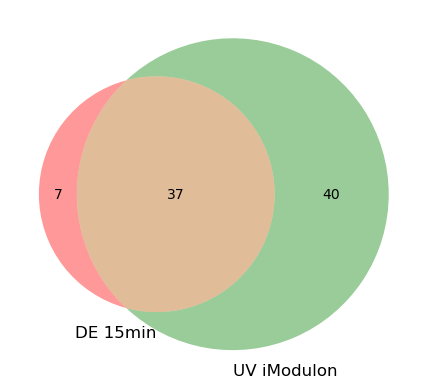

In [138]:
venn2([set(de_15m.index),set(ica_data.view_imodulon('UV').index)],set_labels=('DE 15min','UV iModulon'))

In [140]:
ica_data.view_imodulon('UV').loc[set(ica_data.view_imodulon('UV').index)-set(de.index)]

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0674,-0.061623,hemF,CP000100.1,NaN,669347,670300,+,coproporphyrinogen oxidase,Coenzyme transport and metabolism,Q31QG3,Op524,NaN
Synpcc7942_1353,0.054707,Synpcc7942_1353,CP000100.1,NaN,1385412,1386080,+,conserved hypothetical protein,Function unknown,Q31NI6,Op1015,NaN
Synpcc7942_0920,-0.049655,psaK,CP000100.1,NaN,926720,926974,-,photosystem I reaction center,Function unknown,Q31PR9,Op706,NaN
Synpcc7942_1048,-0.075743,cpcA1,CP000100.1,NaN,1060891,1061382,+,phycocyanin%2C alpha subunit,Energy production and conversion,P13530,Op801,NaN
Synpcc7942_0294,-0.049354,psbO,CP000100.1,NaN,290394,291227,+,photosystem II manganese-stabilizing polypeptide,Function unknown,P11472,Op246,NaN
Synpcc7942_0328,-0.082034,apcE,CP000100.1,NaN,323781,325898,-,phycobilisome core-membrane linker polypeptide,Carbohydrate transport and metabolism,Q31RF9,Op271,NaN
Synpcc7942_1987,-0.083500,rpaC,CP000100.1,NaN,2057819,2058133,+,conserved hypothetical protein,No COG annotation,Q31LQ2,Op1494,NaN
Synpcc7942_B2645,0.051650,anL21,CP000101.1,NaN,39571,40194,+,conserved hypothetical protein,No COG annotation,P72559,Op68,NaN
Synpcc7942_0970,0.083292,pds,CP000100.1,NaN,976311,977882,+,phytoene dehydrogenase-like,"Secondary metabolites biosynthesis, transport,...",Q31PL9,Op741,NaN
Synpcc7942_1867,0.103072,phr,CP000100.1,NaN,1936937,1937818,+,Deoxyribodipyrimidine photo-lyase family protein,"Replication, recombination and repair",Q31M22,Op1409,NaN


In [29]:
DF_enrichments[DF_enrichments.imodulon=='6'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [103]:
# Update the ica_data object
# ica_data.rename_imodulons({6:'UV'})

## Functional -- Biofilm

In [889]:
ica_data.view_imodulon('Comp-2').sort_values('gene_weight',ascending=False)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1784,0.203489,sigF2,CP000100.1,NaN,1852529,1853311,+,group3 RNA polymerase sigma factor SigF,Transcription,Q31MA5,Op1346,NaN
Synpcc7942_0703,0.202762,dprA,CP000100.1,NaN,694072,695280,+,DNA processing protein DprA%2C putative,"Replication, recombination and repair",Q31QD4,Op548,NaN
Synpcc7942_0069,0.176756,Synpcc7942_0069,CP000100.1,NaN,69079,69375,+,hypothetical protein,No COG annotation,Q31S68,Op90,NaN
Synpcc7942_0499,0.176308,Synpcc7942_0499,CP000100.1,NaN,487375,488370,-,hydroxyneurosporene-O-methyltransferase,"Secondary metabolites biosynthesis, transport,...",Q31QY8,Op400,NaN
Synpcc7942_B2632,0.165165,anL59,CP000101.1,NaN,23609,24160,-,hypothetical protein,No COG annotation,Q31JU8,Op40,NaN
Synpcc7942_0312,0.161766,Synpcc7942_0312,CP000100.1,NaN,311280,311708,-,Protein of unknown function UPF0102,No COG annotation,Q31RH5,Op258,NaN
Synpcc7942_0573,0.159744,Synpcc7942_0573,CP000100.1,NaN,555297,555533,-,hypothetical protein,No COG annotation,Q31QR4,Op447,NaN
Synpcc7942_1227,0.153672,radC,CP000100.1,NaN,1248593,1249327,-,DNA repair protein RadC,Amino acid transport and metabolism,Q31NW2,Op927,NaN
Synpcc7942_1040,0.146066,Synpcc7942_1040,CP000100.1,NaN,1054722,1055279,+,conserved hypothetical protein,No COG annotation,Q31PE9,Op794,NaN
Synpcc7942_0100,0.133701,Synpcc7942_0100,CP000100.1,NaN,100528,101082,-,conserved hypothetical protein,No COG annotation,Q31S37,Op113,NaN


<AxesSubplot:xlabel='Biofilm-2 iModulon Activity', ylabel='Comp-2 iModulon Activity'>

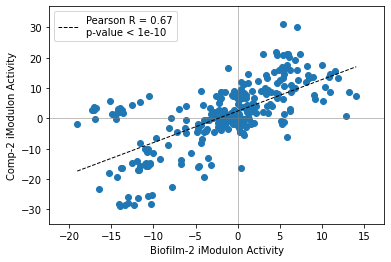

In [32]:
compare_activities(ica_data,'Biofilm-2','Comp-2')

In [696]:
ica_data.view_imodulon('Biofilm-1')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1128,0.191740,Synpcc7942_1128,CP000100.1,,1147349,1148437,+,conserved hypothetical protein,"Secondary metabolites biosynthesis, transport,...",Q31P61,Op856,
Synpcc7942_1132,0.155034,Synpcc7942_1132,CP000100.1,,1151670,1153373,-,conserved hypothetical protein,Defense mechanisms,Q31P57,Op860,
Synpcc7942_1133,0.247298,Synpcc7942_1133,CP000100.1,,1153415,1155559,-,bacteriocin-processing peptidase. Cysteine pep...,Defense mechanisms,Q31P56,Op861,
Synpcc7942_1134,0.469370,Synpcc7942_1134,CP000100.1,,1155654,1155962,-,hypothetical protein,No COG annotation,Q31P55,Op862,
Synpcc7942_1798,0.170659,Synpcc7942_1798,CP000100.1,,1867864,1868490,+,conserved hypothetical protein,No COG annotation,Q31M91,Op1355,


<AxesSubplot:xlabel='Gene Start', ylabel='Biofilm-1 Gene Weight'>

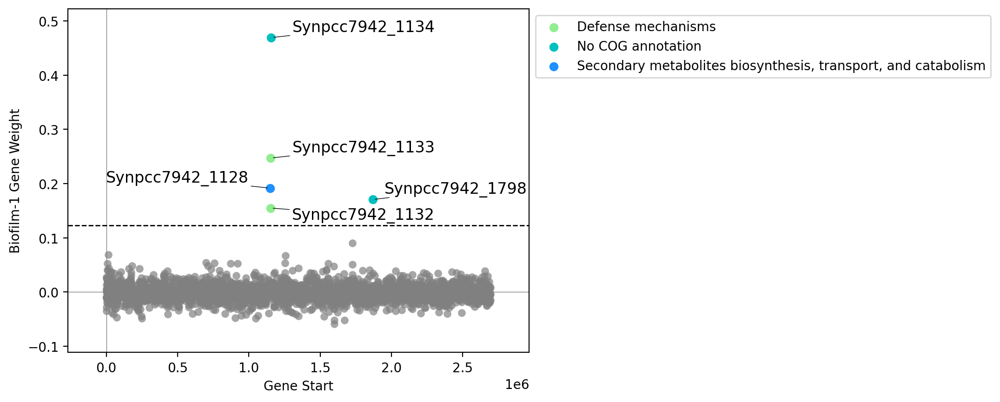

In [858]:
plot_gene_weights(ica_data,'Biofilm-1')

In [19]:
for i in ica_data.imodulon_names:
    if 'Synpcc7942_0051' in list(ica_data.view_imodulon(i).index):
        print(i)

unchar_6


In [702]:
ica_data.view_imodulon('Biofilm-2').sort_values('gene_weight',ascending=False)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0049,0.258774,-,CP000100.1,,49550,49984,-,pilin polypeptide PilA-like,"Intracellular trafficking, secretion, and vesi...",Q31S88,Op80,
Synpcc7942_2070,0.206815,pilT1,CP000100.1,,2146366,2147454,-,twitching motility protein,Cell motility,Q31LG9,Op1558,
Synpcc7942_1890,0.201919,Synpcc7942_1890,CP000100.1,,1963748,1964254,+,conserved hypothetical protein,No COG annotation,Q31LZ9,Op1424,
Synpcc7942_2069,0.180399,pilC,CP000100.1,,2145109,2146341,-,fimbrial assembly protein PilC-like,"Intracellular trafficking, secretion, and vesi...",Q31LH0,Op1558,
Synpcc7942_1821,0.166704,Synpcc7942_1821,CP000100.1,,1893904,1894263,+,conserved hypothetical protein,No COG annotation,Q8GJL3,Op1376,
Synpcc7942_2483,0.161619,Synpcc7942_2483,CP000100.1,,2563680,2565164,-,conserved hypothetical protein,No COG annotation,Q31KA6,Op1862,
Synpcc7942_2482,0.146825,Synpcc7942_2482,CP000100.1,,2563111,2563704,-,hypothetical protein,No COG annotation,Q8GIS8,Op1861,
Synpcc7942_0048,0.143679,-,CP000100.1,,48927,49361,-,pilin polypeptide PilA-like,"Intracellular trafficking, secretion, and vesi...",Q31S89,Op79,
Synpcc7942_0046,0.137374,Synpcc7942_0046,CP000100.1,,45164,46507,+,Methylase involved in ubiquinone/menaquinone b...,"Secondary metabolites biosynthesis, transport,...",Q31S91,Op77,
Synpcc7942_1839,0.134953,Synpcc7942_1839,CP000100.1,,1906094,1906834,-,conserved hypothetical protein,Function unknown,Q31M50,Op1389,


<AxesSubplot:xlabel='Gene Start', ylabel='Biofilm-2 Gene Weight'>

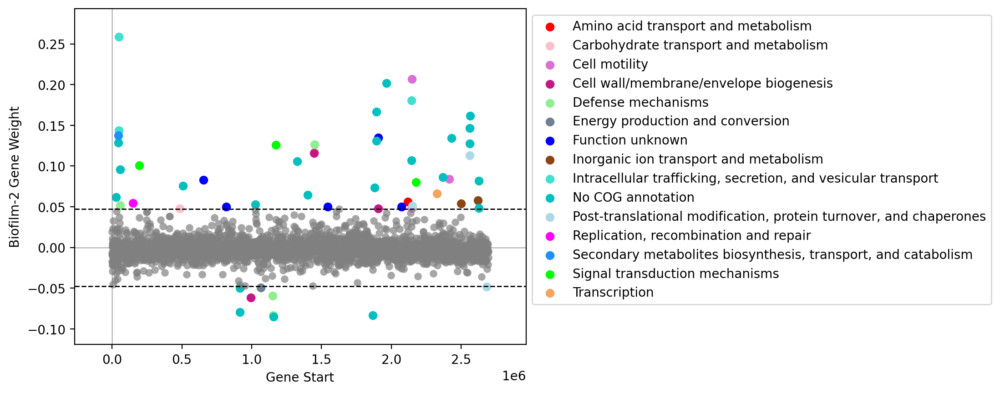

In [855]:
plot_gene_weights(ica_data,'Biofilm-2')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

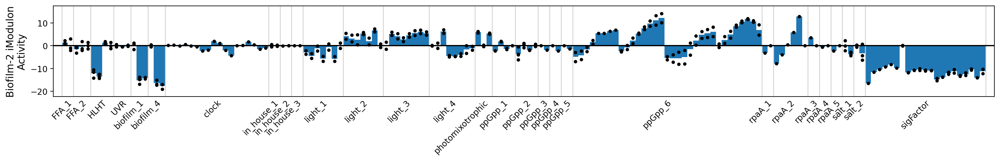

In [862]:
plot_activities(ica_data,'Biofilm-2')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

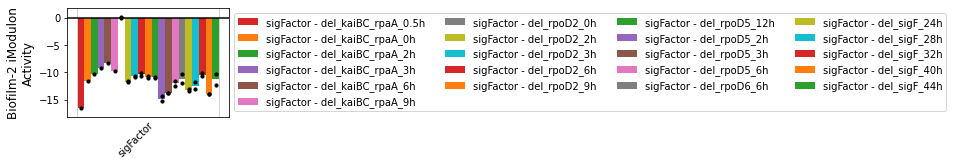

In [30]:
plot_activities(ica_data,'Biofilm-2',projects='sigFactor')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

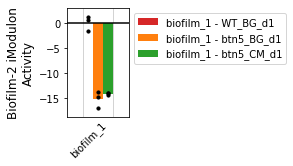

In [17]:
plot_activities(ica_data,'Biofilm-2',projects='biofilm_1')

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

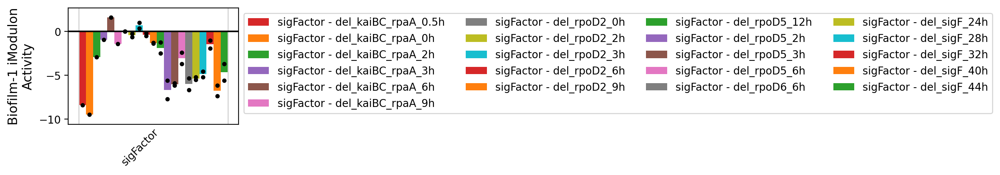

In [853]:
plot_activities(ica_data,'Biofilm-1',projects='sigFactor')

<AxesSubplot:xlabel='biofilm_4:WT_BG_d4', ylabel='biofilm_4:btn5_biofilm_BG_d4'>

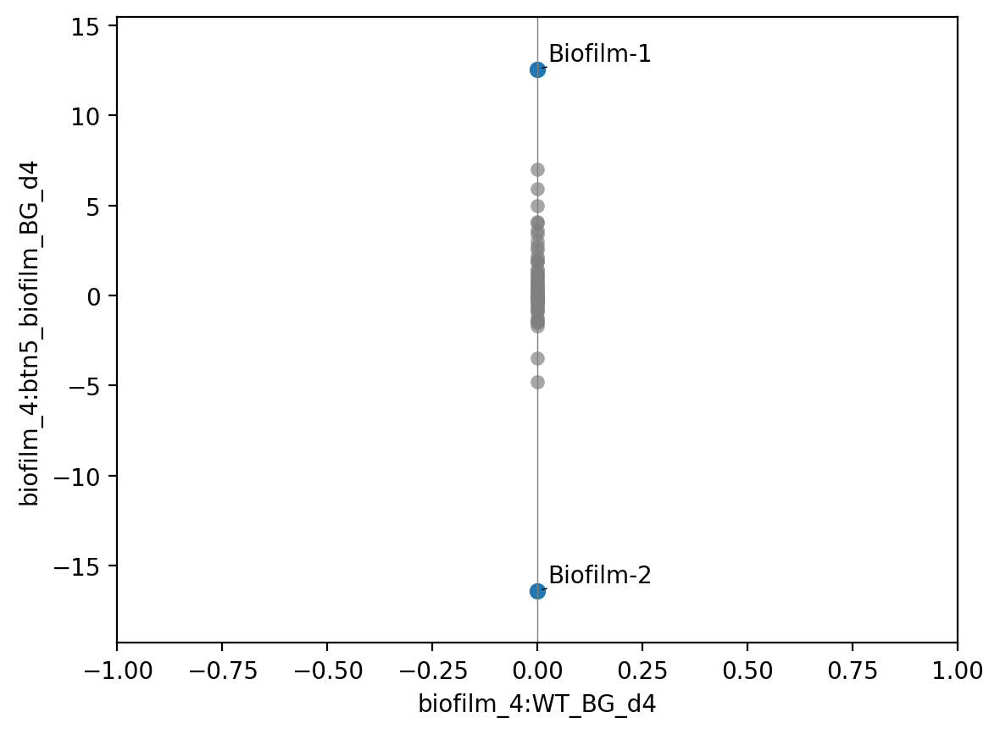

In [847]:
plot_dima(ica_data,'biofilm_4:WT_BG_d4','biofilm_4:btn5_biofilm_BG_d4')

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

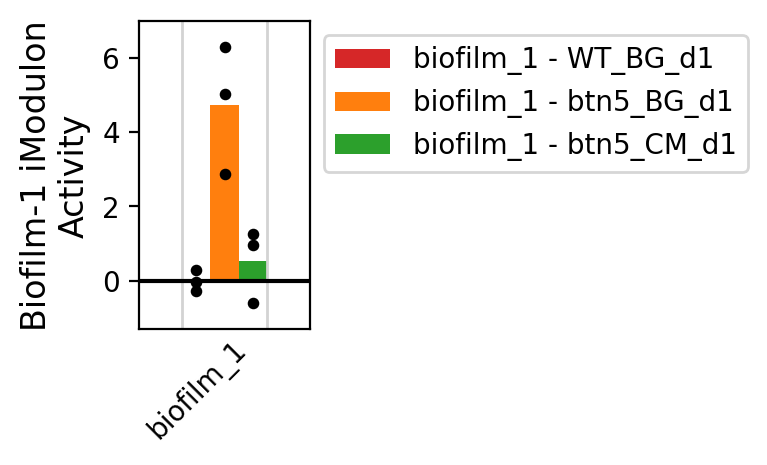

In [845]:
plot_activities(ica_data,'Biofilm-1',projects='biofilm_1')

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

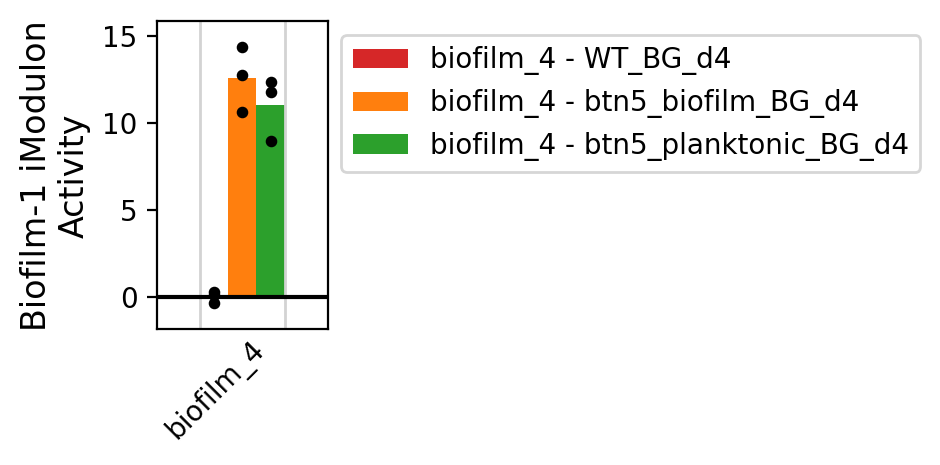

In [840]:
plot_activities(ica_data,'Biofilm-1',projects='biofilm_4')

<AxesSubplot:xlabel='biofilm_1:WT_BG_d1', ylabel='biofilm_1:btn5_BG_d1'>

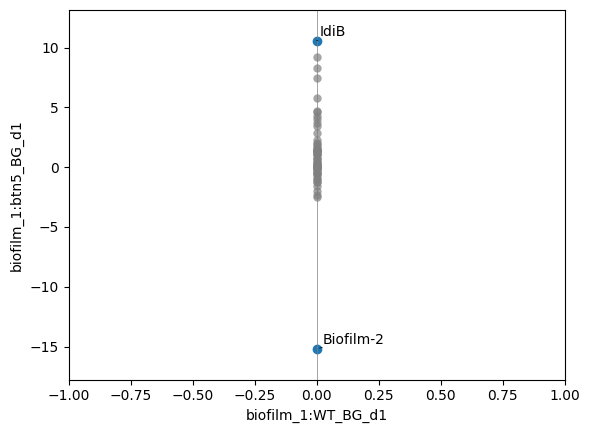

In [903]:
plot_dima(ica_data,'biofilm_1:WT_BG_d1','biofilm_1:btn5_BG_d1')

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

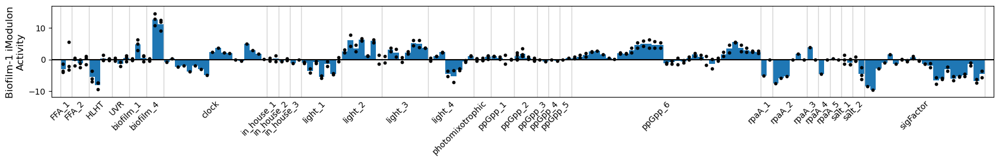

In [142]:
plot_activities(ica_data,'Biofilm-1')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

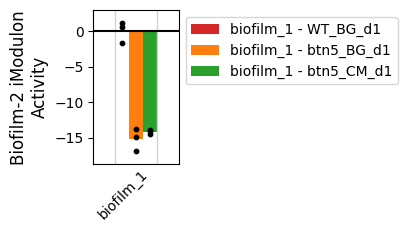

In [698]:
plot_activities(ica_data,'Biofilm-2',projects='biofilm_1')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

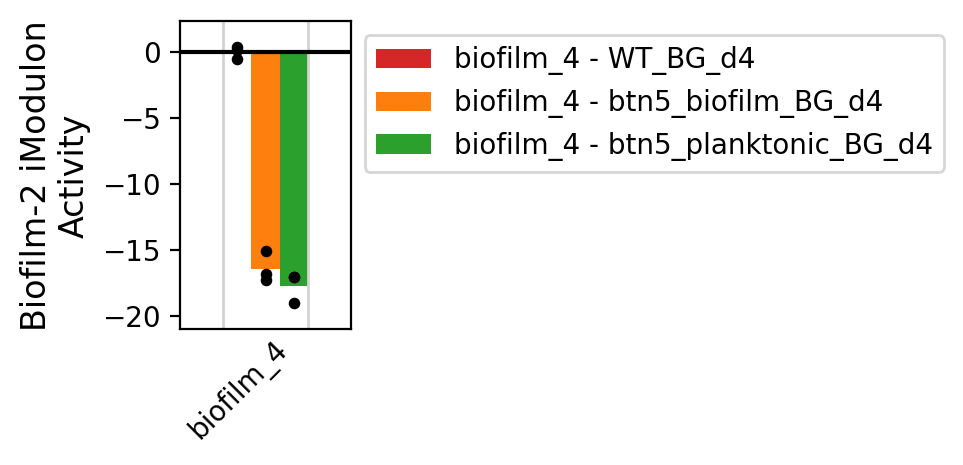

In [832]:
plot_activities(ica_data,'Biofilm-2',projects='biofilm_4')

<AxesSubplot:xlabel='biofilm_4:WT_BG_d4', ylabel='biofilm_4:btn5_biofilm_BG_d4'>

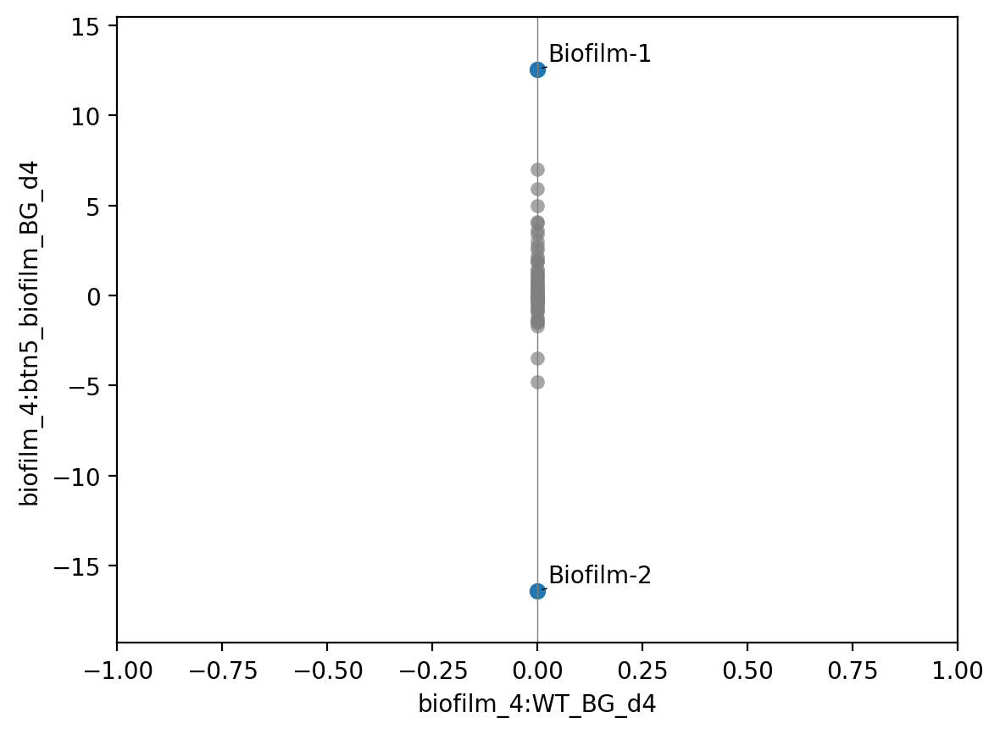

In [836]:
plot_dima(ica_data,'biofilm_4:WT_BG_d4','biofilm_4:btn5_biofilm_BG_d4')

NC2-1 mutation proved effective in improving the HLHT tolerance in Synechococcus

<AxesSubplot:ylabel='Biofilm-1 iModulon\nActivity'>

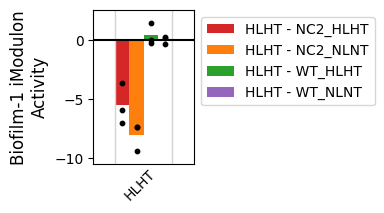

In [896]:
plot_activities(ica_data,'Biofilm-1',projects='HLHT')

<AxesSubplot:ylabel='Biofilm-2 iModulon\nActivity'>

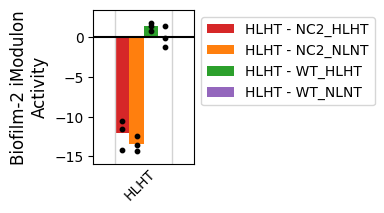

In [894]:
plot_activities(ica_data,'Biofilm-2',projects='HLHT')

/home/annie/Documents/multi-Ecoli/strains/pymodulon/util.py:174: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  _diff[":".join(name)] = abs(A_to_use[i1] - A_to_use[i2])


<AxesSubplot:xlabel='HLHT:NC2_HLHT', ylabel='HLHT:WT_HLHT'>

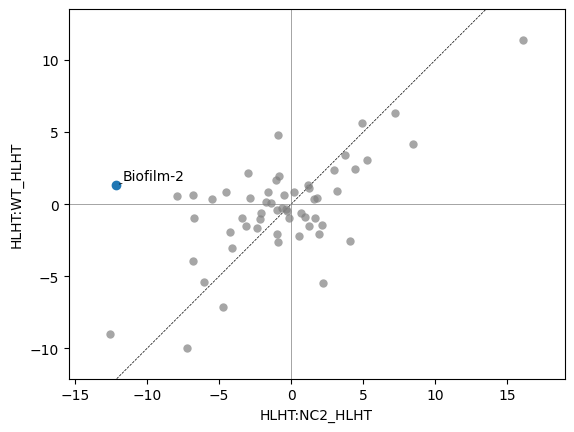

In [893]:
plot_dima(ica_data,'HLHT:NC2_HLHT','HLHT:WT_HLHT')

<AxesSubplot:xlabel='HLHT:WT_NLNT', ylabel='HLHT:NC2_NLNT'>

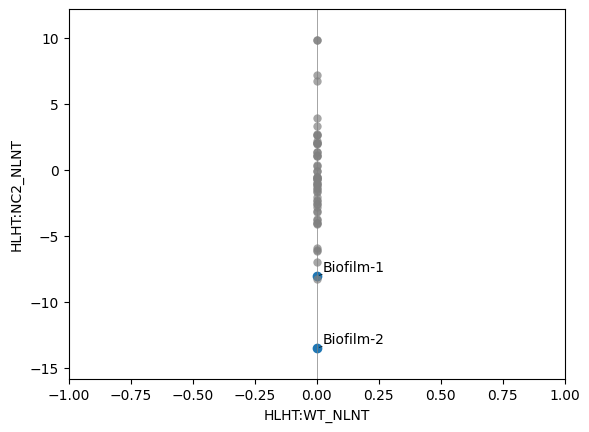

In [895]:
plot_dima(ica_data,'HLHT:WT_NLNT','HLHT:NC2_NLNT')

In [778]:
de_biofilm = pd.read_excel('/home/annie/Downloads/Data_Sheet_2.XLSX',sheet_name='6) DEG Summary',
                           header=7)

In [829]:
de_biofilm.columns[11]

'B▽_CM_D1 vs WT_CM_D1'

In [ ]:
10,11,15,16,20,21,22

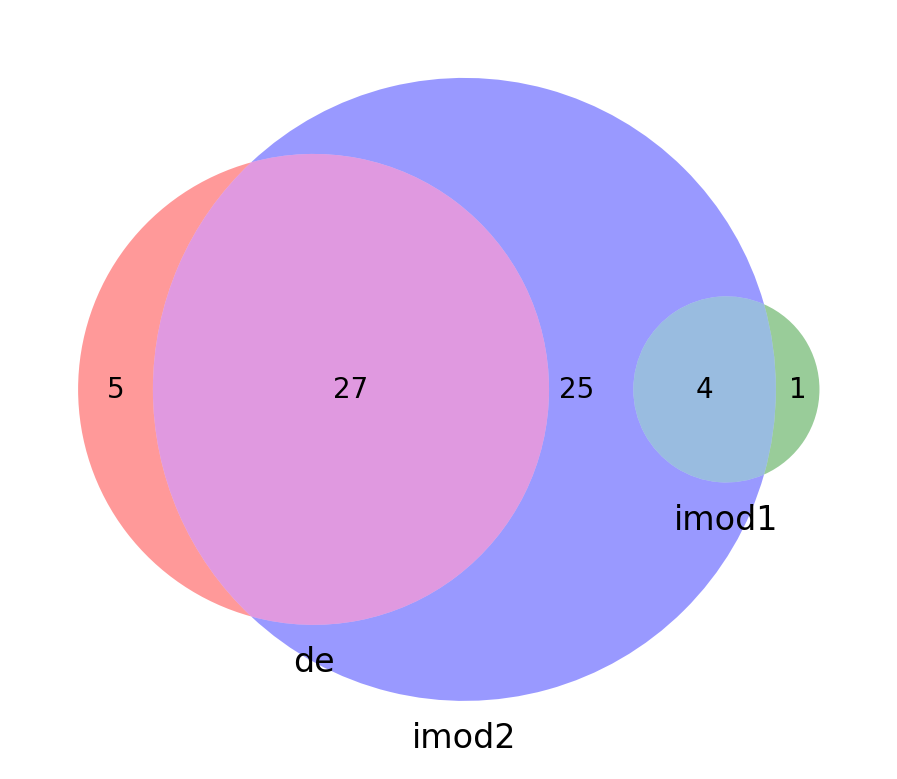

In [827]:
venn3([set(de_biofilm[de_biofilm[de_biofilm.columns[10]] == 'Down'].ORF),
       set(ica_data.view_imodulon('Biofilm-1').index),
       set(ica_data.view_imodulon('Biofilm-2').index)],
       set_labels=['de','imod1','imod2'])

## Functional -- sufR and HLHT

In [899]:
ica_data.view_imodulon('sufR')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1731,0.129343,Synpcc7942_1731,CP000100.1,NaN,1802686,1803171,-,conserved hypothetical protein,Nucleotide transport and metabolism,Q31MF8,Op1306,NaN
Synpcc7942_1732,0.106568,Synpcc7942_1732,CP000100.1,NaN,1803168,1803578,-,conserved hypothetical protein,No COG annotation,Q31MF7,Op1306,NaN
Synpcc7942_1734,0.130198,ftrC,CP000100.1,NaN,1804395,1804757,+,ferredoxin-thioredoxin reductase catalytic chain,Energy production and conversion,Q31MF5,Op1307,sufR
Synpcc7942_1735,0.141866,sufB,CP000100.1,NaN,1804805,1806244,+,Iron-regulated ABC transporter membrane compon...,"Post-translational modification, protein turno...",Q31MF4,Op1308,sufR
Synpcc7942_1736,0.172991,sufC,CP000100.1,NaN,1806290,1807075,+,Iron-regulated ABC transporter ATPase subunit ...,"Post-translational modification, protein turno...",Q31MF3,Op1309,sufR
Synpcc7942_1737,0.176528,sufD,CP000100.1,NaN,1807075,1808403,+,Iron-regulated ABC transporter permease protei...,"Post-translational modification, protein turno...",Q31MF2,Op1309,sufR
Synpcc7942_1738,0.186087,sufS,CP000100.1,NaN,1808413,1809672,+,cysteine desulfurase,Amino acid transport and metabolism,Q31MF1,Op1309,sufR
Synpcc7942_1739,0.176539,merR,CP000100.1,NaN,1809717,1810142,+,transcriptional regulator%2C MerR family,Transcription,Q31MF0,Op1310,NaN


<AxesSubplot:ylabel='sufR iModulon\nActivity'>

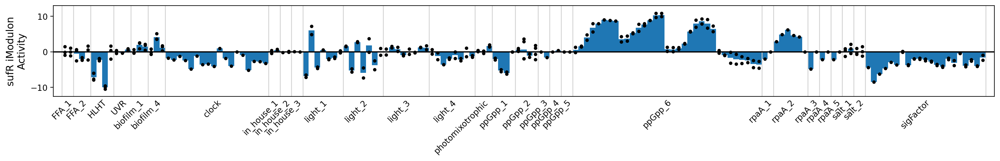

In [575]:
plot_activities(ica_data,'sufR')

<AxesSubplot:ylabel='sufR iModulon\nActivity'>

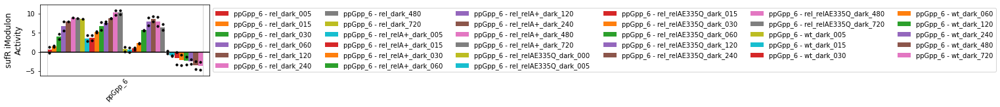

In [39]:
plot_activities(ica_data,'sufR',projects='ppGpp_6')

<AxesSubplot:ylabel='sufR iModulon\nActivity'>

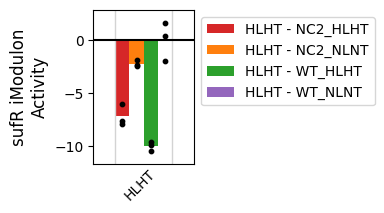

In [898]:
plot_activities(ica_data,'sufR',projects='HLHT')

<AxesSubplot:ylabel='sufR iModulon\nActivity'>

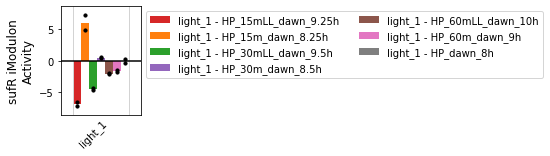

In [33]:
plot_activities(ica_data,'sufR',projects='light_1')

<AxesSubplot:xlabel='HLHT:WT_NLNT', ylabel='HLHT:WT_HLHT'>

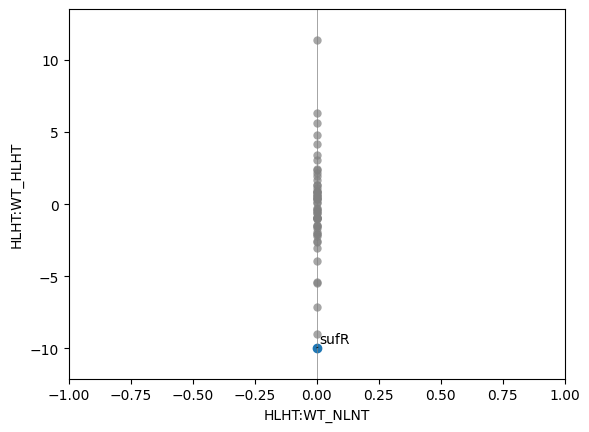

In [812]:
plot_dima(ica_data,'HLHT:WT_NLNT','HLHT:WT_HLHT')

## Regulon discovery -- CysR

In [890]:
ica_data.view_imodulon('CysR')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0019,0.089516,sir,CP000100.1,NaN,18615,20489,+,sulfite reductase (ferredoxin),Energy production and conversion,P30008,Op36,NaN
Synpcc7942_0020,0.073068,Synpcc7942_0020,CP000100.1,NaN,20490,21092,+,conserved hypothetical protein,No COG annotation,Q31SB7,Op36,NaN
Synpcc7942_0755,-0.063730,Synpcc7942_0755,CP000100.1,NaN,749431,750009,+,conserved hypothetical protein,Function unknown,Q31Q82,Op577,NaN
Synpcc7942_0797,-0.068807,Synpcc7942_0797,CP000100.1,NaN,792010,792270,+,hypothetical protein,No COG annotation,Q31Q40,Op614,NaN
Synpcc7942_0900,0.082095,Synpcc7942_0900,CP000100.1,NaN,909440,909643,-,conserved hypothetical protein,No COG annotation,Q31PT9,Op689,NaN
Synpcc7942_1240,-0.061442,nirA,CP000100.1,NaN,1263263,1264801,-,assimilatory nitrite reductase (ferredoxin) pr...,Energy production and conversion,P39661,Op934,"ntcA,ntcB"
Synpcc7942_1377,0.068692,Synpcc7942_1377,CP000100.1,NaN,1417540,1419879,+,metal dependent phosphohydrolase,Transcription,Q31NG2,Op1036,NaN
Synpcc7942_1661,0.055086,Synpcc7942_1661,CP000100.1,NaN,1731159,1731722,+,conserved hypothetical protein,No COG annotation,Q31MM8,Op1255,NaN
Synpcc7942_1680,0.208429,cysA,CP000100.1,NaN,1747842,1748858,-,Sulphate transport system permease protein 1,Inorganic ion transport and metabolism,P14788,Op1268,NaN
Synpcc7942_1681,0.350773,sbpA,CP000100.1,NaN,1749076,1750128,+,Thiosulphate-binding protein,Inorganic ion transport and metabolism,P27366,Op1269,NaN


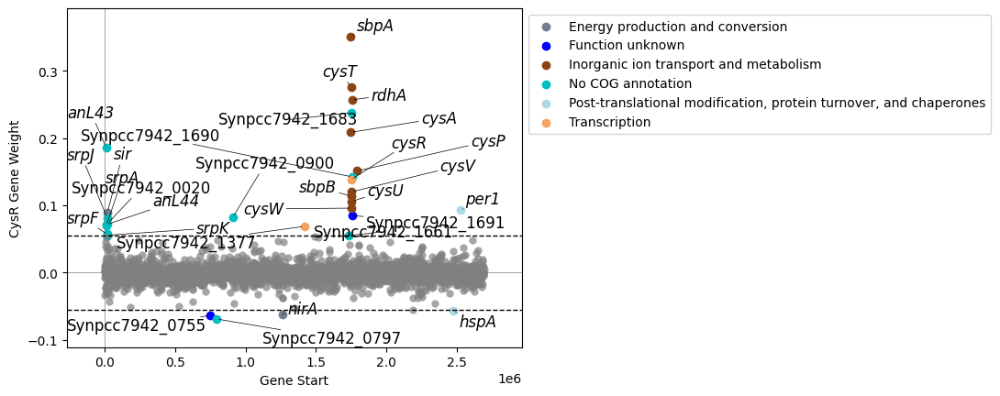

In [93]:
plot_gene_weights(ica_data,'CysR',show_labels=True)
plt.savefig('/home/annie/Documents/CysR.pdf',bbox_inches='tight')

<AxesSubplot:ylabel='CysR iModulon\nActivity'>

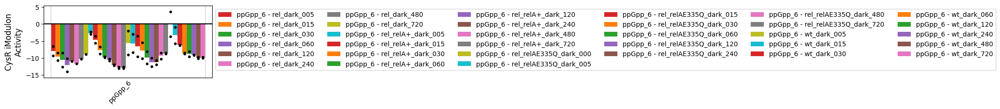

In [79]:
plot_activities(ica_data,'CysR',projects='ppGpp_6')

## Cluster -- unchar-9 & translation

## Investigate

State Transition & Competence

<AxesSubplot:xlabel='Gene Start', ylabel='State Transition Gene Weight'>

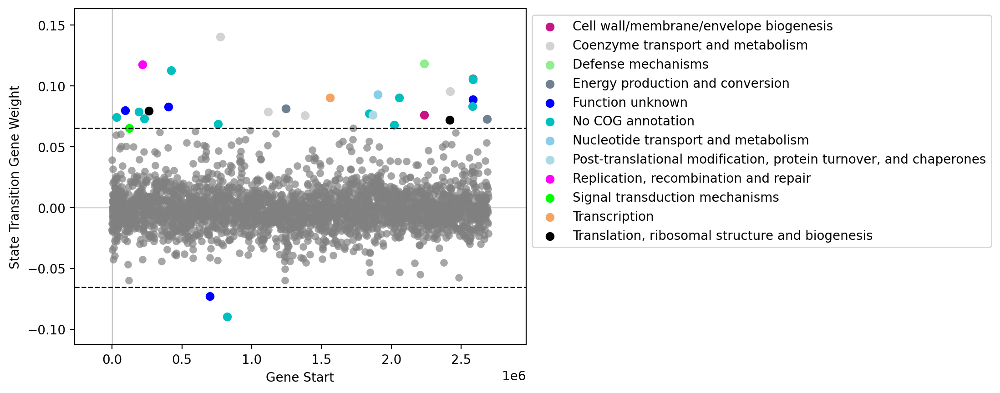

In [895]:
plot_gene_weights(ica_data,'State Transition')

In [896]:
ica_data.view_imodulon('State Transition')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0096,0.080034,Synpcc7942_0096,CP000100.1,NaN,93764,94285,-,conserved hypothetical protein,Function unknown,Q31S41,Op109,NaN
Synpcc7942_0122,0.065471,Synpcc7942_0122,CP000100.1,NaN,121831,123408,-,EAL,Signal transduction mechanisms,Q31S15,Op129,NaN
Synpcc7942_0193,0.078883,Synpcc7942_0193,CP000100.1,NaN,192247,192471,-,conserved hypothetical protein,No COG annotation,Q31RU4,Op179,NaN
Synpcc7942_0215,0.117702,Synpcc7942_0215,CP000100.1,NaN,217424,217813,-,conserved hypothetical protein,"Replication, recombination and repair",Q31RS2,Op194,NaN
Synpcc7942_0236,0.073112,Synpcc7942_0236,CP000100.1,NaN,232018,232557,+,cyclic nucleotide-binding domain (cNMP-BD) pro...,No COG annotation,Q31RQ1,Op209,NaN
Synpcc7942_0267,0.079543,rsmG,CP000100.1,NaN,263757,264485,+,methyltransferase GidB,"Translation, ribosomal structure and biogenesis",Q31RM0,Op230,NaN
Synpcc7942_0415,0.082752,Synpcc7942_0415,CP000100.1,NaN,405168,406145,-,conserved hypothetical protein,Function unknown,Q31R72,Op335,NaN
Synpcc7942_0433,0.112566,Synpcc7942_0433,CP000100.1,NaN,423632,424840,+,conserved hypothetical protein,No COG annotation,Q8GMQ5,Op348,NaN
Synpcc7942_0708,-0.072814,ubiB1,CP000100.1,NaN,698708,700459,+,conserved hypothetical protein,Function unknown,Q31QC9,Op550,NaN
Synpcc7942_0768,0.068486,Synpcc7942_0768,CP000100.1,NaN,760522,761178,+,conserved hypothetical protein,No COG annotation,Q31Q69,Op589,NaN


<AxesSubplot:ylabel='State Transition iModulon\nActivity'>

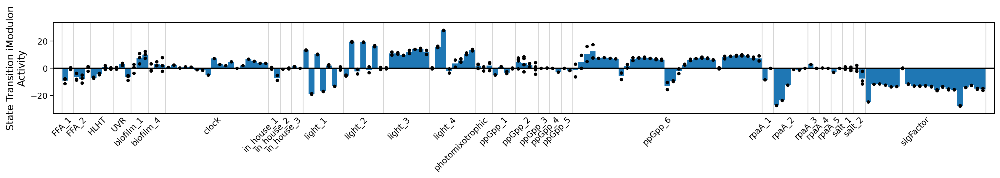

In [900]:
plot_activities(ica_data,'State Transition')

kaiABC & rpoD & sigF

<AxesSubplot:ylabel='kaiABC iModulon\nActivity'>

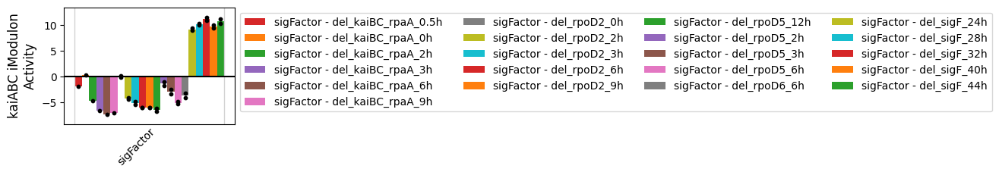

In [1093]:
plot_activities(ica_data,'kaiABC',projects='sigFactor')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

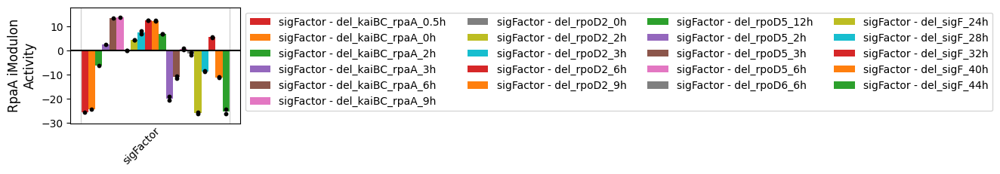

In [1094]:
plot_activities(ica_data,'RpaA',projects='sigFactor')

<AxesSubplot:ylabel='unchar_3 iModulon\nActivity'>

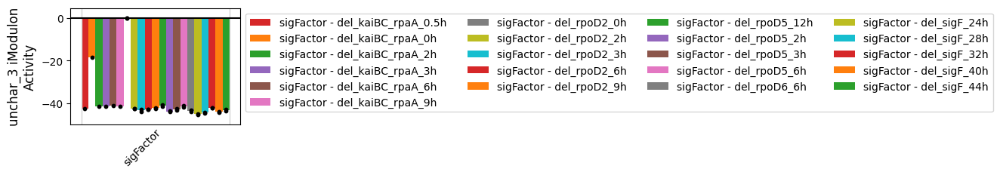

In [1095]:
plot_activities(ica_data,'unchar_3',projects='sigFactor')

<AxesSubplot:ylabel='State Transition iModulon\nActivity'>

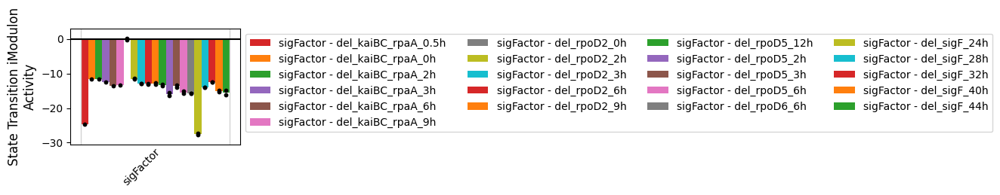

In [1105]:
plot_activities(ica_data,'State Transition',projects='sigFactor')

In [617]:
ica_data.view_imodulon('NtcA-4')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0836,0.114071,Synpcc7942_0836,CP000100.1,NaN,831166,832182,-,conserved hypothetical protein,Function unknown,Q31Q02,Op642,NaN
Synpcc7942_0837,0.185806,Synpcc7942_0837,CP000100.1,NaN,832179,832811,-,conserved hypothetical protein,Transcription,Q31Q01,Op642,NaN
Synpcc7942_0838,0.216872,Synpcc7942_0838,CP000100.1,NaN,832860,833957,-,Elongator protein 3/MiaB/NifB,Function unknown,Q31Q00,Op643,NaN
Synpcc7942_0839,0.180792,Synpcc7942_0839,CP000100.1,NaN,833950,834954,-,Nitrilase,Function unknown,Q31PZ9,Op643,NaN
Synpcc7942_1033,0.128060,Synpcc7942_1033,CP000100.1,NaN,1047992,1048948,+,conserved hypothetical protein,Function unknown,Q31PF6,Op789,NaN
Synpcc7942_1034,0.151499,Synpcc7942_1034,CP000100.1,NaN,1048952,1049815,+,Transglutaminase-like,Amino acid transport and metabolism,Q31PF5,Op789,NaN
Synpcc7942_1082,0.137719,pacL,CP000100.1,NaN,1094751,1097516,+,ATPase%2C E1-E2 type,Inorganic ion transport and metabolism,P37278,Op823,NaN
Synpcc7942_1153,0.097927,Synpcc7942_1153,CP000100.1,NaN,1179295,1181139,-,conserved hypothetical protein,Function unknown,Q31P36,Op880,NaN


In [629]:
ica_data.view_imodulon('NtcA-4')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0836,0.114071,Synpcc7942_0836,CP000100.1,NaN,831166,832182,-,conserved hypothetical protein,Function unknown,Q31Q02,Op642,NaN
Synpcc7942_0837,0.185806,Synpcc7942_0837,CP000100.1,NaN,832179,832811,-,conserved hypothetical protein,Transcription,Q31Q01,Op642,NaN
Synpcc7942_0838,0.216872,Synpcc7942_0838,CP000100.1,NaN,832860,833957,-,Elongator protein 3/MiaB/NifB,Function unknown,Q31Q00,Op643,NaN
Synpcc7942_0839,0.180792,Synpcc7942_0839,CP000100.1,NaN,833950,834954,-,Nitrilase,Function unknown,Q31PZ9,Op643,NaN
Synpcc7942_1033,0.128060,Synpcc7942_1033,CP000100.1,NaN,1047992,1048948,+,conserved hypothetical protein,Function unknown,Q31PF6,Op789,NaN
Synpcc7942_1034,0.151499,Synpcc7942_1034,CP000100.1,NaN,1048952,1049815,+,Transglutaminase-like,Amino acid transport and metabolism,Q31PF5,Op789,NaN
Synpcc7942_1082,0.137719,pacL,CP000100.1,NaN,1094751,1097516,+,ATPase%2C E1-E2 type,Inorganic ion transport and metabolism,P37278,Op823,NaN
Synpcc7942_1153,0.097927,Synpcc7942_1153,CP000100.1,NaN,1179295,1181139,-,conserved hypothetical protein,Function unknown,Q31P36,Op880,NaN


<AxesSubplot:xlabel='Gene Start', ylabel='NtcA-4 Gene Weight'>

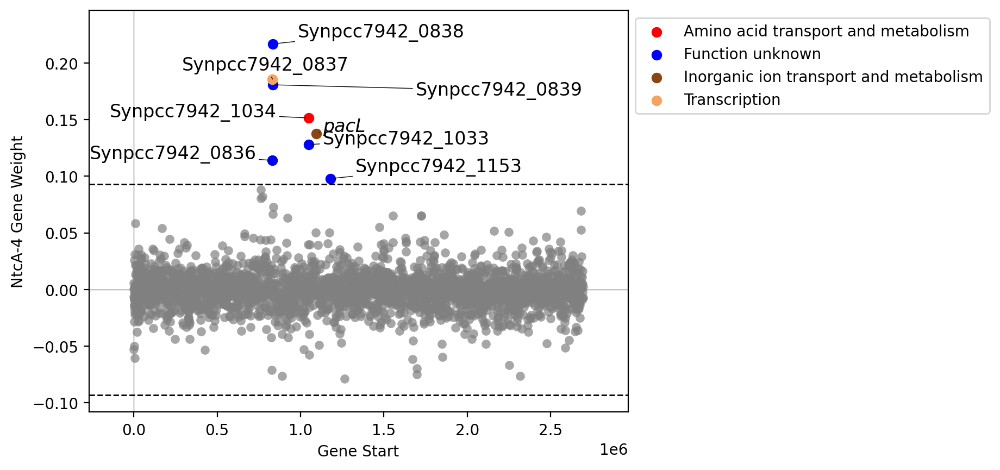

In [628]:
plot_gene_weights(ica_data,'NtcA-4')

<AxesSubplot:xlabel='NtcA-4 iModulon Activity', ylabel='RpaA iModulon Activity'>

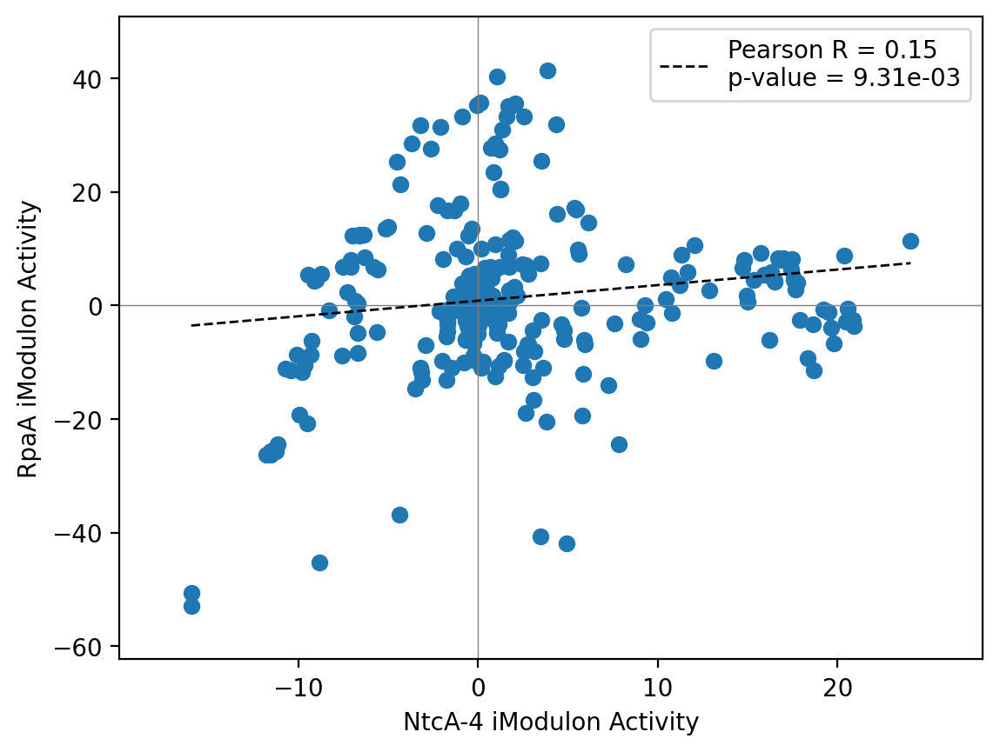

In [626]:
compare_activities(ica_data,'NtcA-4','RpaA')

# Add iModulon category

In [114]:
for i,row in ica_data.imodulon_table.iterrows():
    if pd.notnull(row.regulator):
        ica_data.imodulon_table.loc[i, 'category'] = 'regulatory'
    elif pd.notnull(row.single_gene):
        ica_data.imodulon_table.loc[i, 'category'] = 'single_gene'
    else:
        ica_data.imodulon_table.loc[i, 'category'] = 'uncharacterized'

In [115]:
ica_data.imodulon_table.head()

,regulator,pvalue,qvalue,precision,recall,f1score,TP,regulon_size,imodulon_size,n_regs,single_gene,explained_variance,category
CMM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,NaN,NaN,0.005086,uncharacterized
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,NaN,NaN,0.005835,uncharacterized
Translation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26,NaN,NaN,0.009849,uncharacterized
SG_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,NaN,True,0.001377,single_gene
SG_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,True,0.001744,single_gene


# Inspect all iModulons without an automated annotation

In [1646]:
unchar_imods = ica_data.imodulon_table[ica_data.imodulon_table.category == 'uncharacterized']

In [1647]:
unchar_imods

,regulator,pvalue,qvalue,precision,recall,f1score,TP,regulon_size,imodulon_size,n_regs,single_gene,explained_variance,category
UV,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77,NaN,,0.018320,uncharacterized
unchar_1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,NaN,,0.010668,uncharacterized
unchar_2,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45,NaN,,0.013696,uncharacterized
unchar_3,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42,NaN,,0.097238,uncharacterized
livJHMGF,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,NaN,,0.002354,uncharacterized
Cytc_oxidases,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19,NaN,,0.022565,uncharacterized
Fur-Like,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,,0.004887,uncharacterized
OxPh NADPH **,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45,NaN,,0.008016,uncharacterized
unchar_4,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34,NaN,,0.006214,uncharacterized
Biofilm-1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,NaN,,0.004884,uncharacterized


/home/annie/Documents/multi-Ecoli/strains/pymodulon/plotting.py:82: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


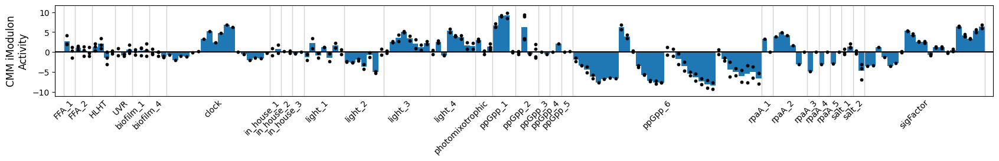

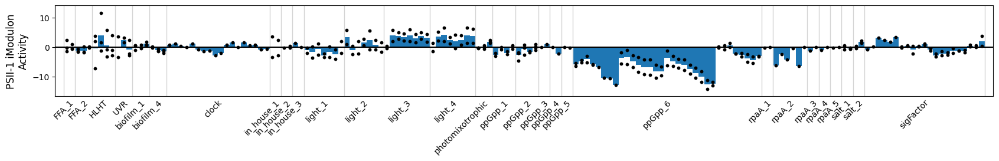

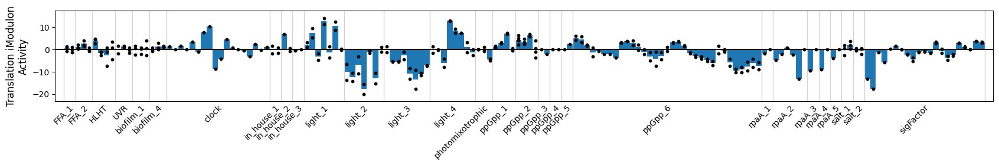

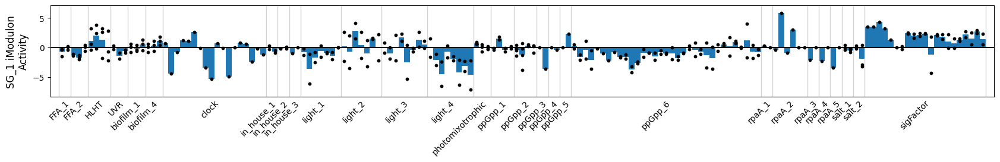

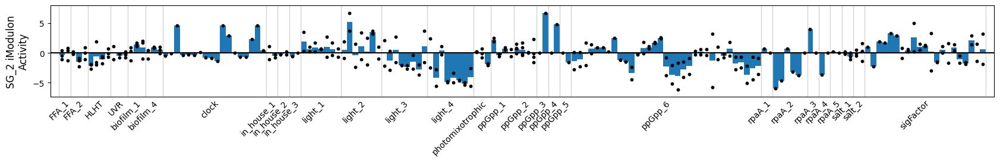

...

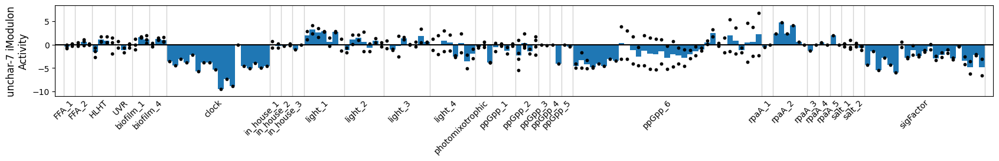

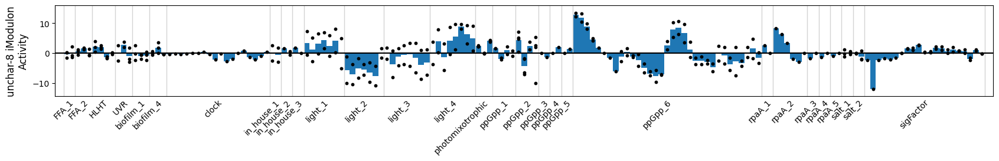

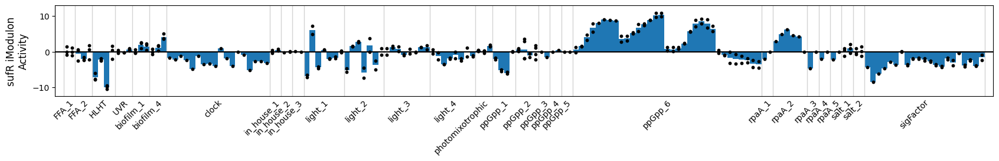

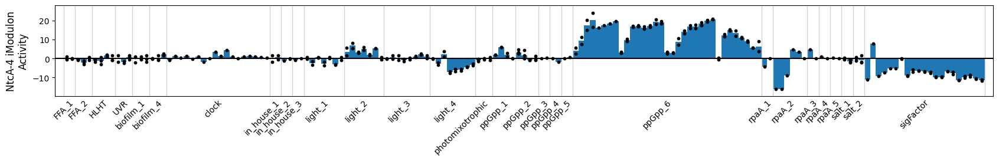

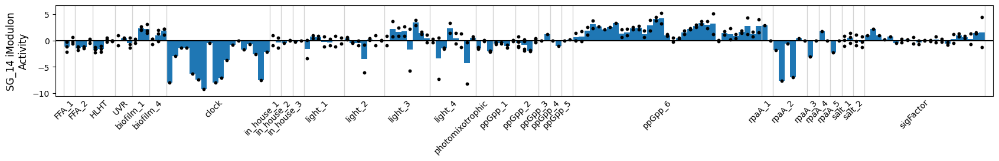

In [347]:
for i in ica_data.imodulon_names:
    plot_activities(ica_data,i)

In [638]:
# ica_data.rename_imodulons({'STR':'anL'})
# ica_data.imodulon_table.loc['anL','category'] = 'functional'
# save_to_json(ica_data, path.join(data_dir, 'ica_wip.json.gz'))
# ica_data.imodulon_table.to_csv(path.join(data_dir, 'imodulon_table.csv'))

<AxesSubplot:xlabel='unchar-2 iModulon Activity', ylabel='RpaA iModulon Activity'>

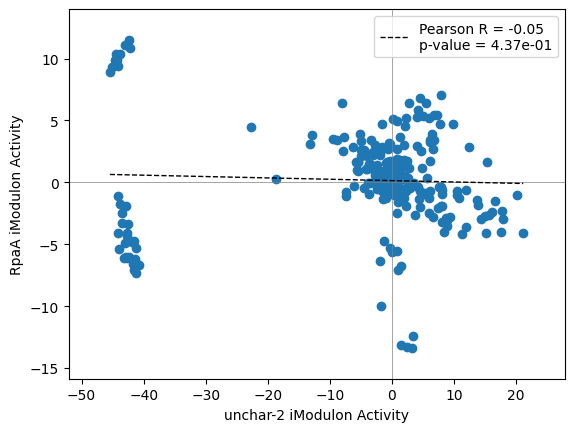

In [632]:
compare_activities(ica_data,'unchar-2','RpaA')

<AxesSubplot:xlabel='Gene Start', ylabel='ccmR-1 Gene Weight'>

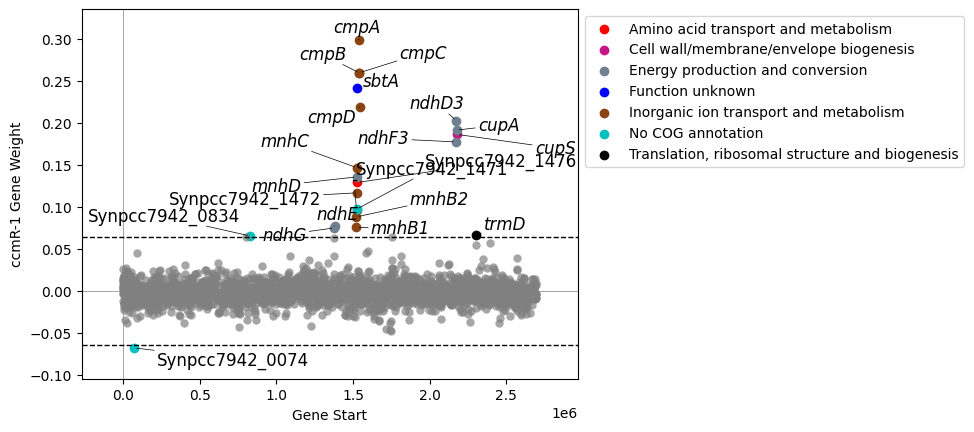

In [644]:
plot_gene_weights(ica_data,'ccmR-1',show_labels=True)

<AxesSubplot:xlabel='Cytc Oxidases '>

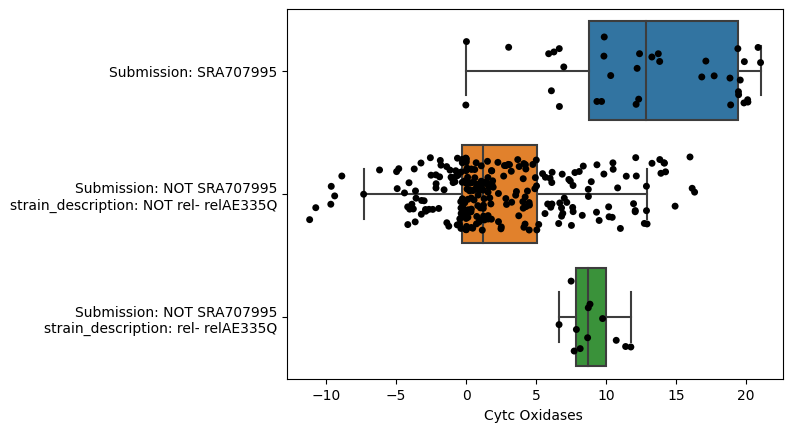

In [670]:
metadata_boxplot(ica_data,'Cytc Oxidases ')

<AxesSubplot:ylabel='sigA2 iModulon\nActivity'>

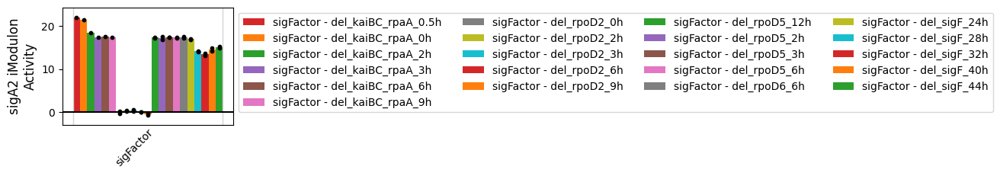

In [660]:
plot_activities(ica_data,'sigA2',projects='sigFactor')

<AxesSubplot:ylabel='Cytc Oxidases  iModulon\nActivity'>

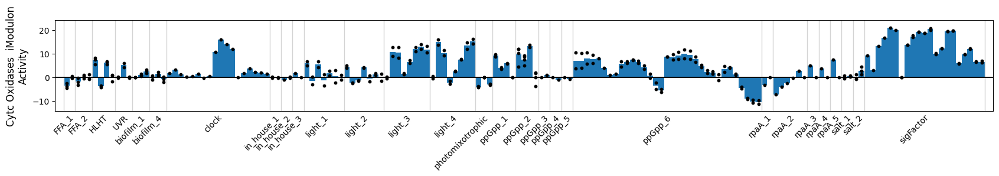

In [671]:
plot_activities(ica_data,'Cytc Oxidases ')

<AxesSubplot:ylabel='unchar-2 iModulon\nActivity'>

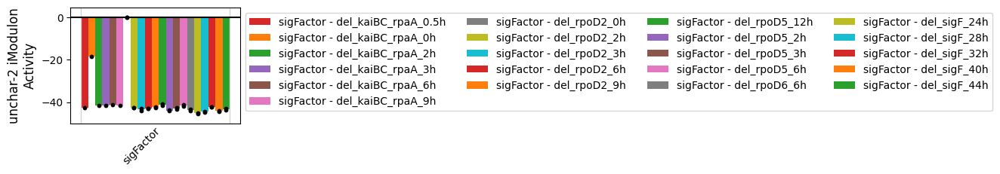

In [622]:
plot_activities(ica_data,'unchar-2',projects='sigFactor')

<AxesSubplot:ylabel='unchar-1 iModulon\nActivity'>

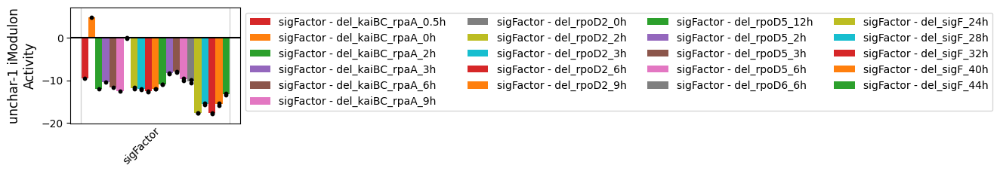

In [570]:
plot_activities(ica_data,'unchar-1',projects='sigFactor')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

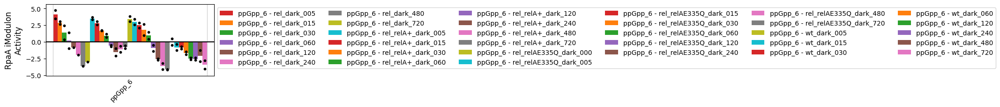

In [534]:
plot_activities(ica_data,'RpaA',projects='ppGpp_6')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

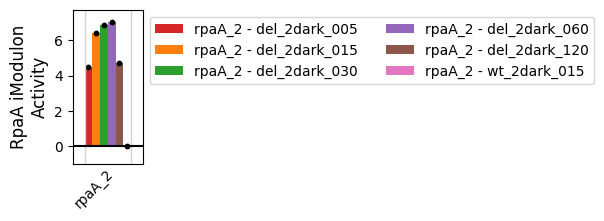

In [535]:
plot_activities(ica_data,'RpaA',projects='rpaA_2')

<AxesSubplot:ylabel='RpaA iModulon\nActivity'>

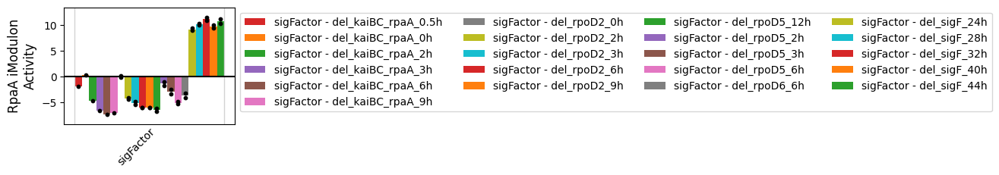

In [536]:
plot_activities(ica_data,'RpaA',projects='sigFactor')

<AxesSubplot:ylabel='Dark-Induced Transition iModulon\nActivity'>

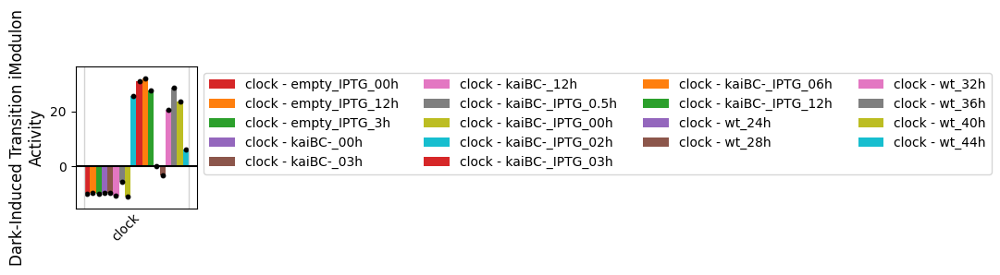

In [437]:
plot_activities(ica_data,'Dark-Induced Transition',projects='clock')

<AxesSubplot:xlabel='unchar-2 Gene Weight', ylabel='Number of Genes'>

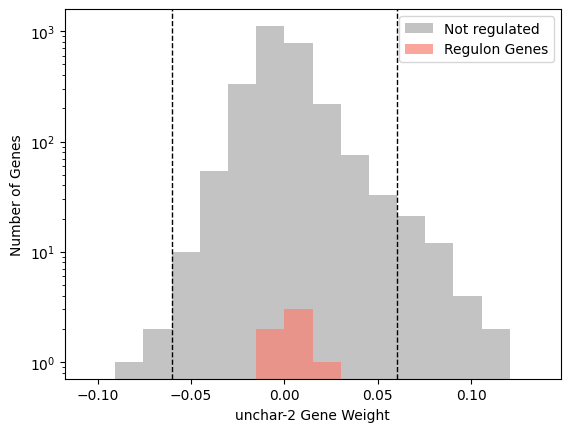

In [460]:
plot_regulon_histogram(ica_data,'PSII-1','ccmR')

<AxesSubplot:xlabel='PSII-2 iModulon Activity', ylabel='PSII-1 iModulon Activity'>

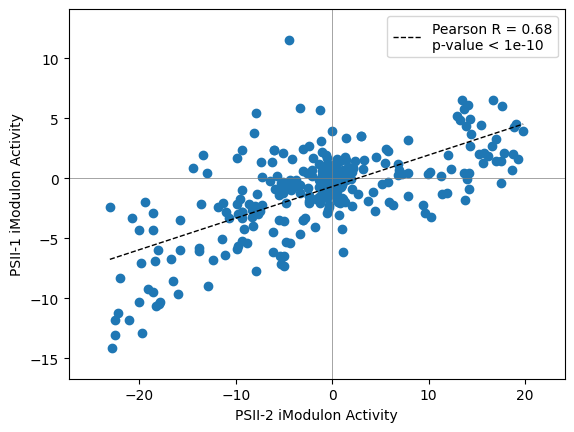

In [465]:
compare_activities(ica_data,'PSII-2','PSII-1')

<AxesSubplot:ylabel='CMM iModulon\nActivity'>

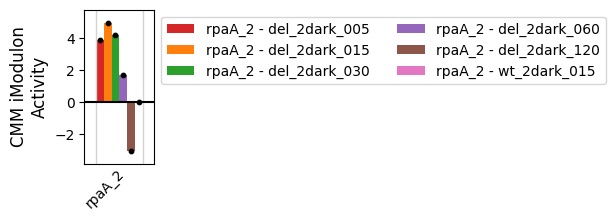

In [446]:
plot_activities(ica_data,'CMM',projects='rpaA_2')

<AxesSubplot:ylabel='CMM iModulon\nActivity'>

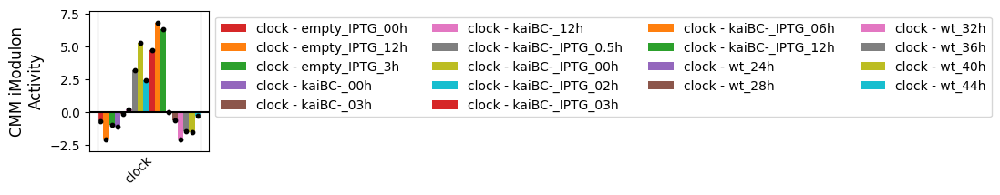

In [447]:
plot_activities(ica_data,'CMM',projects='clock')

<AxesSubplot:ylabel='CMM iModulon\nActivity'>

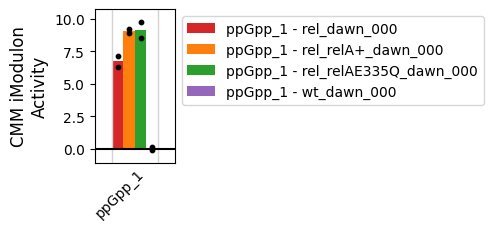

In [448]:
plot_activities(ica_data,'CMM',projects='ppGpp_1')

<AxesSubplot:ylabel='Dark-Induced Transition iModulon\nActivity'>

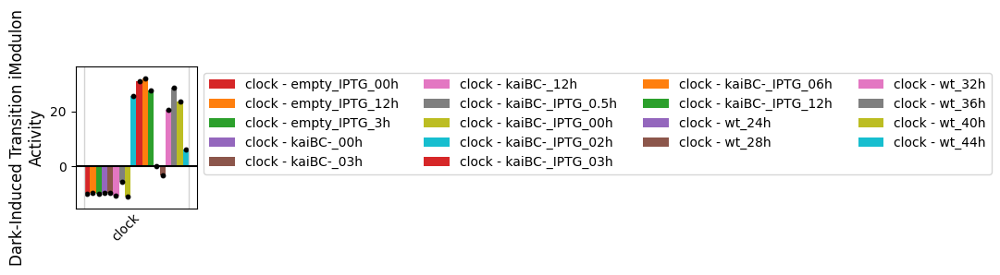

In [135]:
plot_activities(ica_data,'Dark-Induced Transition',projects='clock')

In [443]:
np.unique([str(x) for x in DF_enrichments.imodulon])

array(['0', '1', '14', '15', '16', '17', '18', '2', '25', '26', '28',
       '33', '36', '38', '42', '5', '51', '6', 'ccmR-1', 'ccmR-2',
       'ntcA-1', 'ntcA-2'], dtype='<U6')

In [601]:
DF_enrichments[DF_enrichments.imodulon=='6'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
2,6,map00196,2.293707e-16,4.702100e-14,0.155844,0.750000,0.258065,12.0,16.0,77.0,KEGG pathways,Photosynthesis - antenna proteins,NaN
3,6,map00195,1.672395e-11,1.714204e-09,0.194805,0.263158,0.223881,15.0,57.0,77.0,KEGG pathways,Photosynthesis,NaN
4,6,map01100,3.859217e-08,2.637131e-06,0.480519,0.067518,0.118400,37.0,548.0,77.0,KEGG pathways,Metabolic pathways,NaN
5,6,map00860,3.142256e-04,1.610406e-02,0.090909,0.148936,0.112903,7.0,47.0,77.0,KEGG pathways,Porphyrin metabolism,NaN
5,6,M00163,9.205161e-06,1.877853e-03,0.051948,0.666667,0.096386,4.0,6.0,77.0,KEGG modules,NaN,Photosystem I


### iModulon 1: PSII-1

In [240]:
ica_data.view_imodulon(1).shape

(21, 12)

In [241]:
ica_data.view_imodulon(1)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0113,0.140393,Synpcc7942_0113,CP000100.1,,113196,113288,+,hypothetical protein,No COG annotation,Q31S24,Op122,
Synpcc7942_0456,0.099624,psbK,CP000100.1,,445209,445346,+,photosystem II PsbK protein,Function unknown,Q79AV1,Op366,
Synpcc7942_0475,0.198139,petN,CP000100.1,,460449,460544,-,cytochrome b6-f complex subunit VIII,No COG annotation,Q31R12,Op381,
Synpcc7942_0696,0.111621,psbT,CP000100.1,,689050,689145,-,photosystem II PsbT protein,No COG annotation,Q31QE1,Op543,
Synpcc7942_0699,0.120552,psbM,CP000100.1,,691619,691726,+,photosystem II PsbM protein,Function unknown,Q31QD8,Op546,
Synpcc7942_0911,-0.085067,Synpcc7942_0911,CP000100.1,,918998,919249,+,conserved hypothetical protein,No COG annotation,Q31PS8,Op699,
Synpcc7942_0997,0.069600,rpmF,CP000100.1,,1005256,1005432,-,LSU ribosomal protein L32P,"Translation, ribosomal structure and biogenesis",Q31PJ2,Op763,
Synpcc7942_1279,0.096820,Synpcc7942_1279,CP000100.1,,1301796,1302047,-,hypothetical protein,No COG annotation,Q31NR0,Op962,
Synpcc7942_1479,0.136983,petG,CP000100.1,,1530970,1531083,+,cytochrome b6-f complex subunit 5,Energy production and conversion,Q9Z3G1,Op1117,
Synpcc7942_1483,0.070285,Synpcc7942_1483,CP000100.1,,1534449,1534877,-,conserved hypothetical protein,No COG annotation,Q31N56,Op1120,


<AxesSubplot:xlabel='Gene Start', ylabel='1 Gene Weight'>

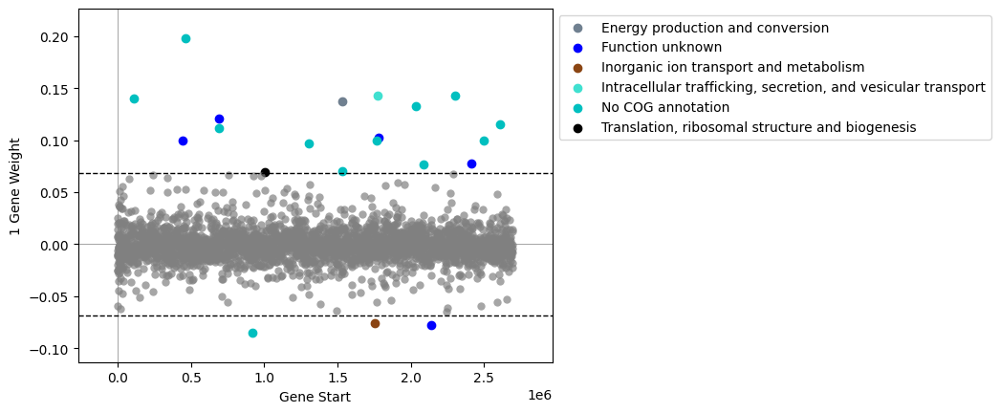

In [243]:
plot_gene_weights(ica_data,1)

<AxesSubplot:ylabel='1 iModulon\nActivity'>

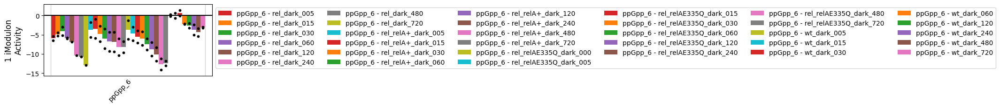

In [245]:
plot_activities(ica_data,1,projects = ['ppGpp_6'])

<AxesSubplot:ylabel='1 iModulon\nActivity'>

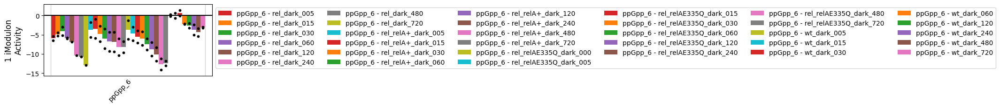

In [246]:
plot_activities(ica_data,1,projects = ['ppGpp_6'])

In [242]:
DF_enrichments[DF_enrichments.imodulon==1].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [249]:
# Update the ICA data object

# ica_data.rename_imodulons({1:'PSII-1'})
# ica_data.imodulon_table.loc['PSII-1','category'] = 'functional'

### iModulon 8: unknown

In [251]:
ica_data.view_imodulon(8)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0074,0.056229,Synpcc7942_0074,CP000100.1,,73306,73659,-,conserved hypothetical protein,No COG annotation,Q31S63,Op93,
Synpcc7942_0229,0.187914,Synpcc7942_0229,CP000100.1,,225658,226221,+,hypothetical protein,Function unknown,Q31RQ8,Op203,
Synpcc7942_0373,0.182087,Synpcc7942_0373,CP000100.1,,366738,368024,-,conserved hypothetical protein,Function unknown,Q31RB4,Op304,
Synpcc7942_0374,0.242159,Synpcc7942_0374,CP000100.1,,368290,368574,-,hypothetical protein,No COG annotation,Q31RB3,Op305,
Synpcc7942_0406,0.135708,Synpcc7942_0406,CP000100.1,,399953,400354,+,conserved hypothetical protein,No COG annotation,Q31R81,Op328,
Synpcc7942_0408,0.073553,trpF,CP000100.1,,400768,401421,+,phosphoribosylanthranilate isomerase,Amino acid transport and metabolism,Q31R79,Op330,
Synpcc7942_0443,0.178028,sek0027,CP000100.1,,433076,434317,-,conserved hypothetical protein,"Intracellular trafficking, secretion, and vesi...",Q8GMR4,Op356,
Synpcc7942_0444,0.192963,sek0026,CP000100.1,,434357,435040,-,conserved hypothetical protein,No COG annotation,Q8GAA4,Op356,
Synpcc7942_0553,0.073569,hlyD1,CP000100.1,,535182,536534,-,Secretion protein HlyD,Cell wall/membrane/envelope biogenesis,Q31QT4,Op432,
Synpcc7942_0585,0.131661,Synpcc7942_0585,CP000100.1,,566168,567388,-,PDZ/DHR/GLGF,"Post-translational modification, protein turno...",Q31QQ2,Op457,


<AxesSubplot:xlabel='Gene Start', ylabel='8 Gene Weight'>

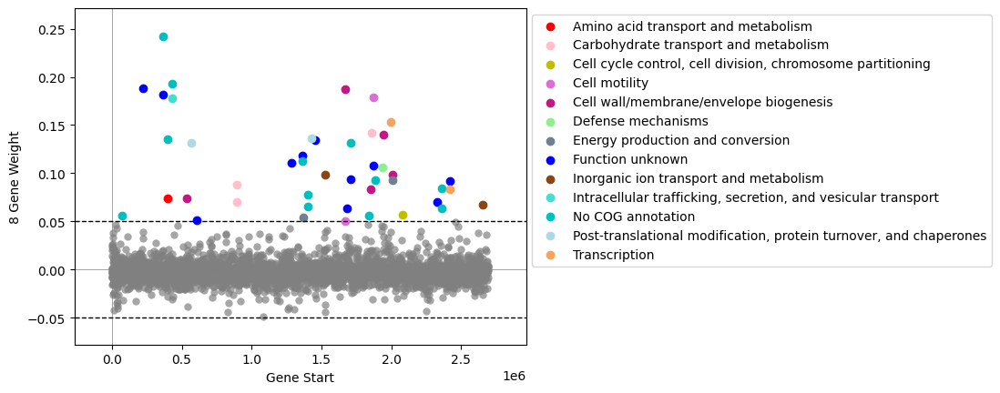

In [252]:
plot_gene_weights(ica_data,8)

<AxesSubplot:ylabel='8 iModulon\nActivity'>

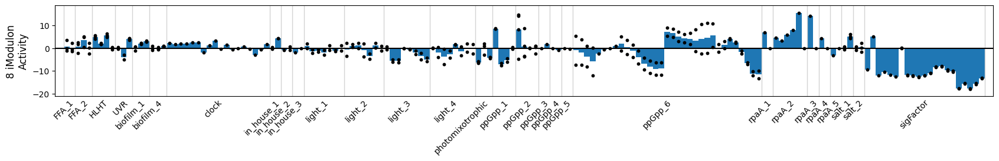

In [253]:
plot_activities(ica_data,8)

<AxesSubplot:ylabel='8 iModulon\nActivity'>

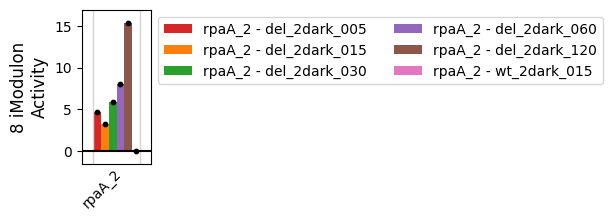

In [226]:
plot_activities(ica_data,8,projects='rpaA_2')

<AxesSubplot:ylabel='8 iModulon\nActivity'>

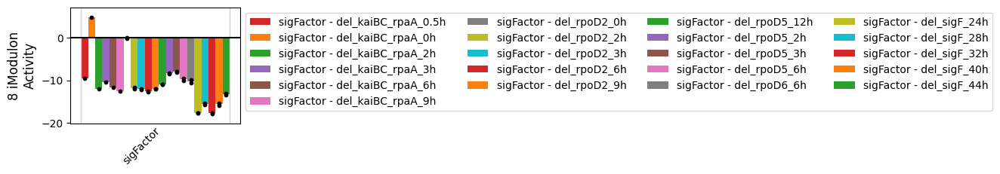

In [208]:
plot_activities(ica_data,8,projects = ['sigFactor'])

<AxesSubplot:ylabel='8 iModulon\nActivity'>

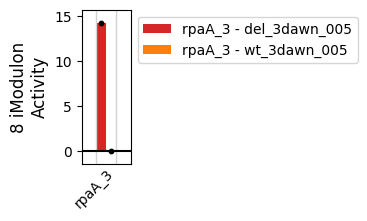

In [124]:
plot_activities(ica_data,8,projects = ['rpaA_3'])

<AxesSubplot:ylabel='8 iModulon\nActivity'>

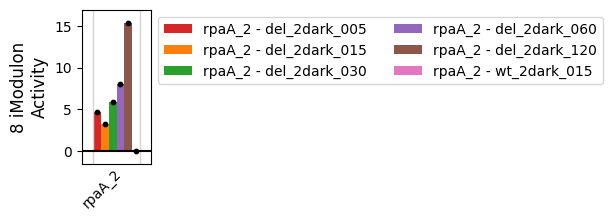

In [207]:
plot_activities(ica_data,8,projects = ['rpaA_2'])

In [206]:
DF_enrichments[DF_enrichments.imodulon=='8'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [331]:
# ica_data.rename_imodulons({8:'unchar-1'})
# ica_data.imodulon_table.loc['unchar-1','category'] = 'uncharacterized'

### iModulon 11: unknown - look closer

In [1226]:
ica_data.view_imodulon('unchar_3')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0095,-0.081149,rpaA,CP000100.1,,92590,93339,-,two component transcriptional regulator%2C win...,Transcription,Q31S42,Op108,
Synpcc7942_0195,0.060531,Synpcc7942_0195,CP000100.1,,195630,196058,+,conserved hypothetical protein,Signal transduction mechanisms,Q31RU2,Op181,
Synpcc7942_0267,0.083137,rsmG,CP000100.1,,263757,264485,+,methyltransferase GidB,"Translation, ribosomal structure and biogenesis",Q31RM0,Op230,
Synpcc7942_0291,0.062169,Synpcc7942_0291,CP000100.1,,288312,288530,+,conserved hypothetical protein,Function unknown,Q31RJ6,Op244,
Synpcc7942_0491,0.107984,ndhQ,CP000100.1,,479700,479837,+,hypothetical protein,No COG annotation,Q31QZ6,Op393,
Synpcc7942_0497,0.068040,-,CP000100.1,,484328,484504,-,conserved hypothetical protein,No COG annotation,Q31QZ0,Op398,
Synpcc7942_0522,0.086381,Synpcc7942_0522,CP000100.1,,507941,508312,+,hypothetical protein,No COG annotation,Q31QW5,Op411,
Synpcc7942_0573,0.068486,Synpcc7942_0573,CP000100.1,,555297,555533,-,hypothetical protein,No COG annotation,Q31QR4,Op447,
Synpcc7942_0592,0.069449,pfkA,CP000100.1,,579312,580394,-,6-phosphofructokinase,Coenzyme transport and metabolism,Q31QP5,Op463,
Synpcc7942_0667,0.060560,Synpcc7942_0667,CP000100.1,,663985,664296,+,conserved hypothetical protein,No COG annotation,Q31QH0,Op520,


<AxesSubplot:xlabel='Gene Start', ylabel='11 Gene Weight'>

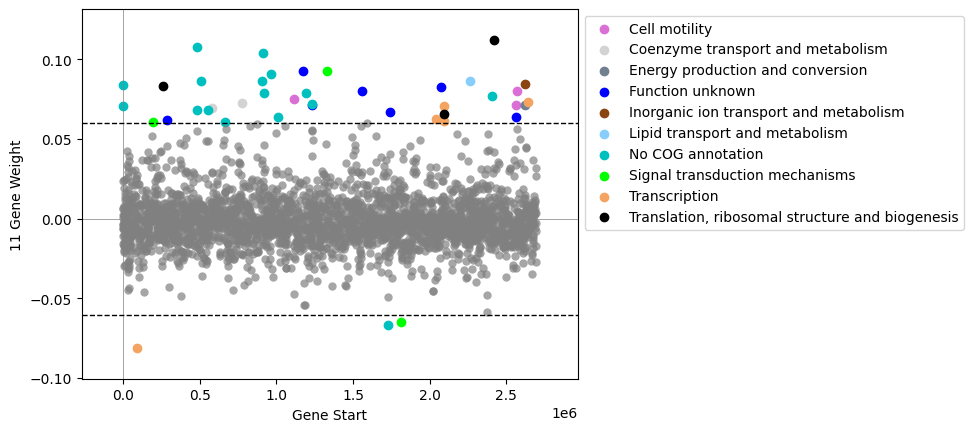

In [257]:
plot_gene_weights(ica_data,11)

<AxesSubplot:ylabel='11 iModulon\nActivity'>

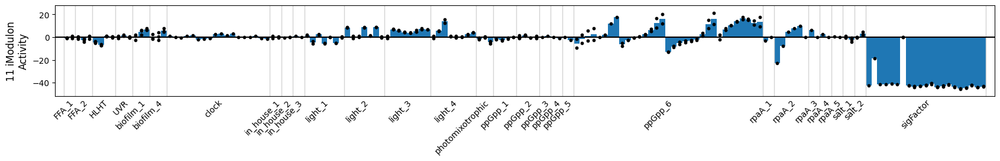

In [255]:
plot_activities(ica_data,11)

<AxesSubplot:ylabel='kaiABC iModulon\nActivity'>

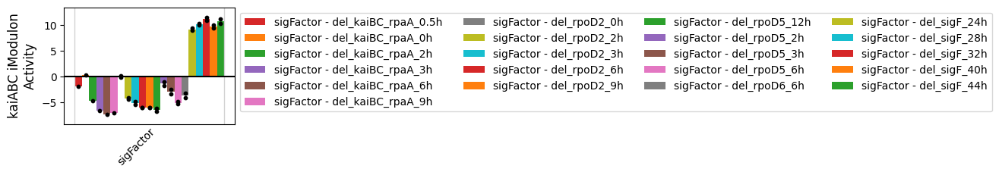

In [1637]:
plot_activities(ica_data,'kaiABC',projects='sigFactor')

<AxesSubplot:xlabel='kaiABC iModulon Activity', ylabel='unchar_3 iModulon Activity'>

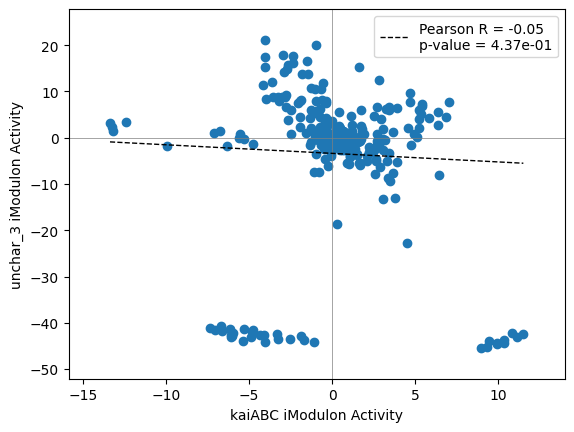

In [1636]:
compare_activities(ica_data,'kaiABC','unchar_3')

<AxesSubplot:ylabel='11 iModulon\nActivity'>

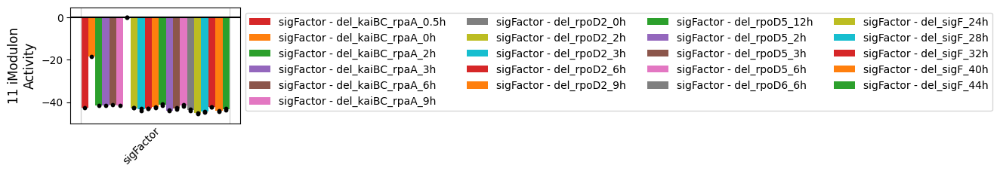

In [34]:
plot_activities(ica_data,11,projects='sigFactor')

In [258]:
DF_enrichments[DF_enrichments.imodulon=='11'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [332]:
# ica_data.rename_imodulons({11:'unchar-2'})
# ica_data.imodulon_table.loc['unchar-2','category'] = 'uncharacterized'

### iModulon 15: livJHMGF 
BCAA transporter

In [40]:
ica_data.view_imodulon(15)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon
Synpcc7942_1377,0.121401,Synpcc7942_1377,CP000100.1,NaN,1417540,1419879,+,metal dependent phosphohydrolase,Transcription,Q31NG2,Op1036
Synpcc7942_2492,0.148315,livF,CP000100.1,NaN,2573355,2574068,-,ATPase,Amino acid transport and metabolism,Q31K97,Op1871
Synpcc7942_2493,0.203961,livG,CP000100.1,NaN,2574061,2574822,-,ATPase,Amino acid transport and metabolism,Q8GIU0,Op1871
Synpcc7942_2494,0.221265,livM,CP000100.1,NaN,2574819,2575742,-,putative branched-chain amino acid ABC transpo...,Amino acid transport and metabolism,Q8GIU1,Op1871
Synpcc7942_2495,0.229308,livH,CP000100.1,NaN,2575746,2576687,-,integral membrane protein of the ABC-type Nat ...,Amino acid transport and metabolism,Q935W9,Op1871
Synpcc7942_2496,0.219909,livJ,CP000100.1,NaN,2576687,2577886,-,branched-chain amino-acid ABC transport system...,Amino acid transport and metabolism,Q935X0,Op1871
Synpcc7942_2497,0.169913,ndk,CP000100.1,NaN,2577916,2578371,-,nucleoside diphosphate kinase,Nucleotide transport and metabolism,P50590,Op1871


<AxesSubplot:xlabel='Gene Start', ylabel='15 Gene Weight'>

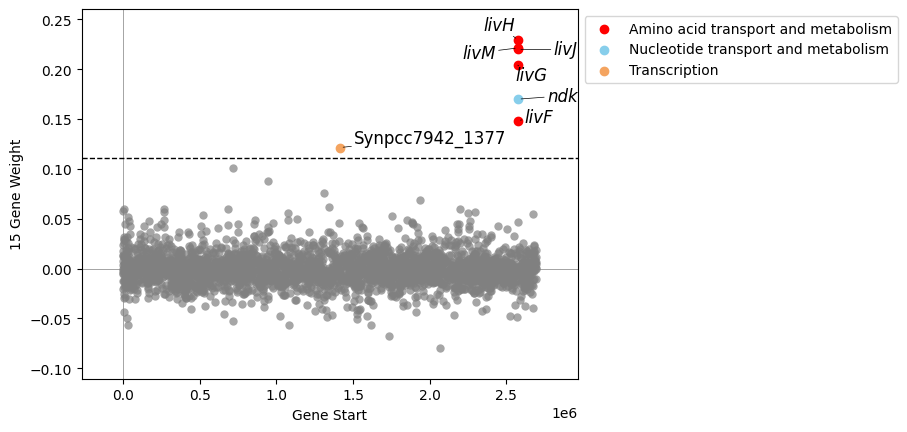

In [79]:
plot_gene_weights(ica_data,15)

<AxesSubplot:ylabel='15 iModulon\nActivity'>

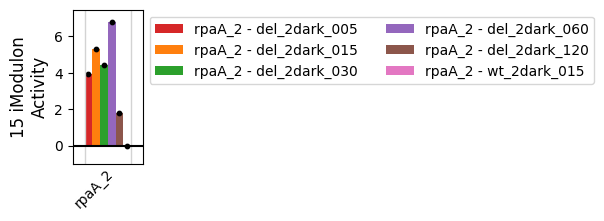

In [27]:
plot_activities(ica_data,15,projects='rpaA_2')

<AxesSubplot:ylabel='15 iModulon\nActivity'>

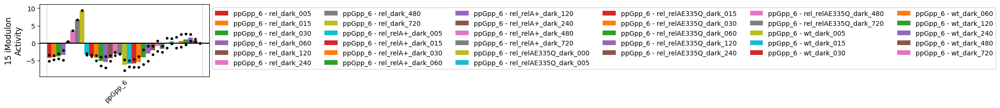

In [28]:
plot_activities(ica_data,15,projects='ppGpp_6')

In [42]:
DF_enrichments[DF_enrichments.imodulon=='15'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [99]:
# Update the ica_data object
# ica_data.rename_imodulons({15:'livJHMGF'})

### iModulon 17: heat shock

In [317]:
ica_data.view_imodulon(17)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0685,0.133449,groEL2,CP000100.1,,678881,680548,+,Chaperonin Cpn60/TCP-1,"Post-translational modification, protein turno...",Q31QF2,Op534,
Synpcc7942_1041,-0.107055,Synpcc7942_1041,CP000100.1,,1055349,1055621,-,hypothetical protein,No COG annotation,Q31PE8,Op795,
Synpcc7942_1290,-0.161369,-,CP000100.1,,1313290,1313460,-,SmtA metallothionein,Function unknown,P30331,Op968,smtB
Synpcc7942_1813,0.146426,htpG,CP000100.1,,1884434,1886350,-,ATP-binding region%2C ATPase-like,"Post-translational modification, protein turno...",Q79N42,Op1370,
Synpcc7942_2313,0.280411,groEL1,CP000100.1,,2381614,2383248,-,Chaperonin Cpn60/TCP-1,"Post-translational modification, protein turno...",P22879,Op1732,
Synpcc7942_2314,0.268450,groES,CP000100.1,,2383296,2383607,-,GroES protein%2C 10 kD chaperonin,"Post-translational modification, protein turno...",P22880,Op1732,"hrcA,hrcA"
Synpcc7942_2468,0.144976,dnaK2,CP000100.1,,2548622,2550526,+,Heat shock protein Hsp70,"Post-translational modification, protein turno...",P50021,Op1849,


<AxesSubplot:xlabel='Gene Start', ylabel='17 Gene Weight'>

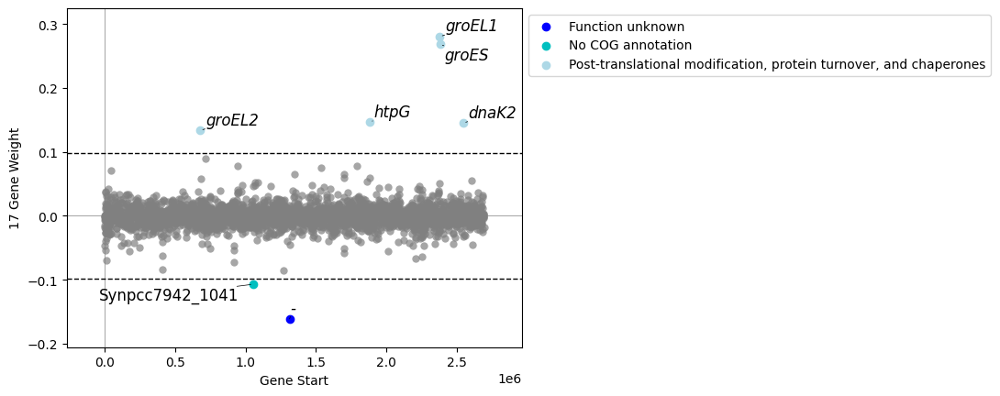

In [318]:
plot_gene_weights(ica_data,17)

<AxesSubplot:ylabel='17 iModulon\nActivity'>

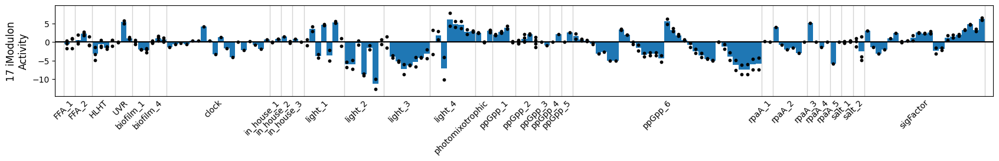

In [319]:
plot_activities(ica_data,17)

In [320]:
DF_enrichments[DF_enrichments.imodulon=='17'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
14,17,map04940,5.898137e-06,0.000302,0.285714,1.000000,0.444444,2.0,2.0,7.0,KEGG pathways,Type I diabetes mellitus,NaN
11,17,map05152,3.852772e-07,0.000079,0.428571,0.428571,0.428571,3.0,7.0,7.0,KEGG pathways,Tuberculosis,NaN
15,17,map05134,3.530041e-05,0.001447,0.285714,0.500000,0.363636,2.0,4.0,7.0,KEGG pathways,Legionellosis,NaN
12,17,map04212,1.808135e-06,0.000185,0.428571,0.272727,0.333333,3.0,11.0,7.0,KEGG pathways,Longevity regulating pathway - worm,NaN
13,17,map03018,4.963617e-06,0.000302,0.428571,0.200000,0.272727,3.0,15.0,7.0,KEGG pathways,RNA degradation,NaN
16,17,map04151,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,PI3K-Akt signaling pathway,NaN
17,17,map04612,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,Antigen processing and presentation,NaN
18,17,map04626,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,Plant-pathogen interaction,NaN
19,17,map04657,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,IL-17 signaling pathway,NaN
20,17,map04659,2.622705e-03,0.041358,0.142857,1.000000,0.250000,1.0,1.0,7.0,KEGG pathways,Th17 cell differentiation,NaN


In [321]:
# Update the ica_data object
# ica_data.rename_imodulons({17:'heat shock'})
# ica_data.imodulon_table.loc['heat shock','category'] = 'functional'

### iModulon 20: unknown

In [179]:
ica_data.view_imodulon(20)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0059,0.097932,Synpcc7942_0059,CP000100.1,,60867,61112,-,hypothetical protein,No COG annotation,Q31S78,Op84,
Synpcc7942_0138,0.096519,Synpcc7942_0138,CP000100.1,,139416,140018,+,Membrane proteins%2C metalloendopeptidases-like,Cell wall/membrane/envelope biogenesis,Q31RZ9,Op142,
Synpcc7942_0291,0.059013,Synpcc7942_0291,CP000100.1,,288312,288530,+,conserved hypothetical protein,Function unknown,Q31RJ6,Op244,
Synpcc7942_0494,0.135969,Synpcc7942_0494,CP000100.1,,482631,482984,-,conserved hypothetical protein,No COG annotation,Q31QZ3,Op396,
Synpcc7942_0540,0.069529,Synpcc7942_0540,CP000100.1,,524367,524828,+,conserved hypothetical protein,No COG annotation,Q31QU7,Op423,
Synpcc7942_0551,0.139794,Synpcc7942_0551,CP000100.1,,533570,533941,+,conserved hypothetical protein,No COG annotation,Q31QT6,Op430,
Synpcc7942_0631,0.070703,rplL,CP000100.1,,623876,624262,-,LSU ribosomal protein L12P,"Translation, ribosomal structure and biogenesis",Q31QK6,Op492,L10_leader
Synpcc7942_0705,0.087230,Synpcc7942_0705,CP000100.1,,695935,696570,+,conserved hypothetical protein,Amino acid transport and metabolism,Q31QD2,Op548,
Synpcc7942_0784,0.111330,Synpcc7942_0784,CP000100.1,,779531,779848,+,conserved hypothetical protein,No COG annotation,Q31Q53,Op601,
Synpcc7942_0875,0.077962,Synpcc7942_0875,CP000100.1,,877453,877887,-,conserved hypothetical protein,No COG annotation,Q31PW4,Op669,


<AxesSubplot:ylabel='20 iModulon\nActivity'>

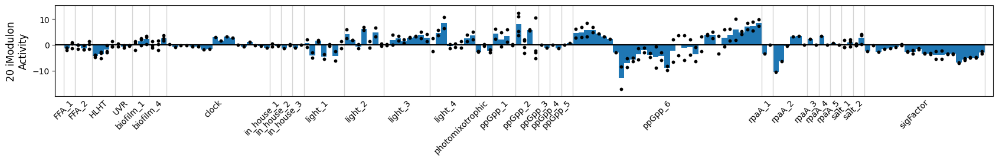

In [180]:
plot_activities(ica_data,20)

In [181]:
DF_enrichments[DF_enrichments.imodulon=='20'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [333]:
# ica_data.rename_imodulons({20:'unchar-3'})
# ica_data.imodulon_table.loc['unchar-3','category'] = 'uncharacterized'

### iModulon 24: unknown

In [182]:
ica_data.view_imodulon(24)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
HTX97_RS00035,-0.042732,HTX97_RS00035,NC_004990.1,,6605,6793,+,hypothetical protein,No COG annotation,,Op15,
Synpcc7942_0014,0.122956,Synpcc7942_0014,CP000100.1,,13067,13411,-,conserved hypothetical protein,Signal transduction mechanisms,Q31SC3,Op29,
Synpcc7942_0015,0.065007,phyA1,CP000100.1,,13577,14248,-,Prolyl 4-hydroxylase%2C alpha subunit,Energy production and conversion,Q31SC2,Op31,
Synpcc7942_0017,0.050202,eda,CP000100.1,,15630,16193,-,2-keto-3-deoxy-phosphogluconate aldolase,Carbohydrate transport and metabolism,Q31SC0,Op34,
Synpcc7942_0035,0.054934,Synpcc7942_0035,CP000100.1,,34357,35115,-,conserved hypothetical protein,No COG annotation,Q31SA2,Op55,
...,...,...,...,...,...,...,...,...,...,...,...,...
Synpcc7942_B2622,0.046958,srpC,CP000101.1,,13100,14281,+,probable chromate transport transmembrane protein,No COG annotation,Q55027,Op30,
Synpcc7942_B2630,0.107528,srpM,CP000101.1,,20808,21608,+,sulfonate ABC transporter%2C permease protein%...,No COG annotation,Q9R6V0,Op35,
Synpcc7942_B2632,0.044521,anL59,CP000101.1,,23609,24160,-,hypothetical protein,No COG annotation,Q31JU8,Op40,
Synpcc7942_B2657,0.082873,anL03,CP000101.1,,29150,29365,-,hypothetical protein,No COG annotation,Q8KUX0,Op47,


<AxesSubplot:xlabel='Gene Start', ylabel='24 Gene Weight'>

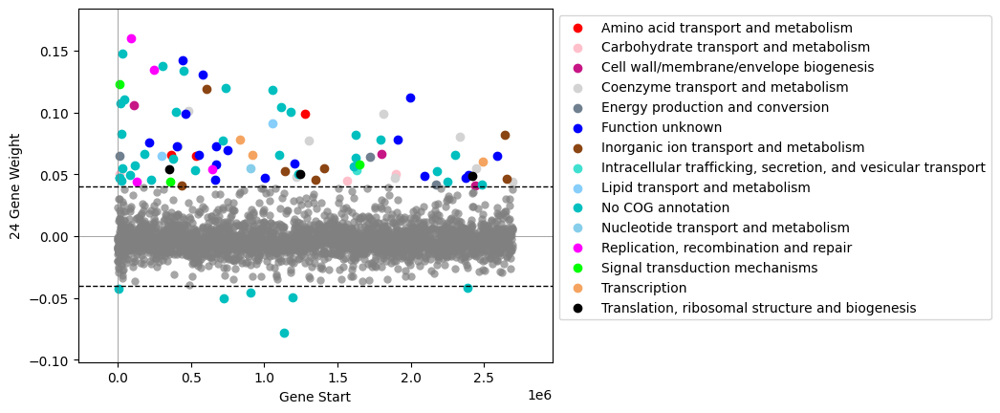

In [186]:
plot_gene_weights(ica_data,24)

<AxesSubplot:ylabel='24 iModulon\nActivity'>

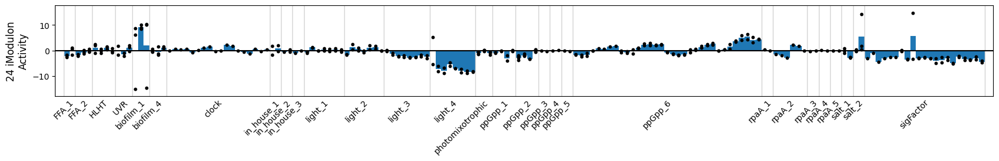

In [183]:
plot_activities(ica_data,24)

<AxesSubplot:ylabel='24 iModulon\nActivity'>

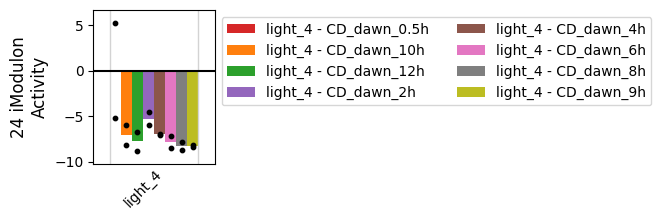

In [184]:
plot_activities(ica_data,24,projects = 'light_4')

In [185]:
DF_enrichments[DF_enrichments.imodulon=='24'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [334]:
# ica_data.rename_imodulons({24:'unchar-4'})
# ica_data.imodulon_table.loc['unchar-4','category'] = 'uncharacterized'

### iModulon 28: phosphate

In [56]:
ica_data.view_imodulon(28)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon
Synpcc7942_0188,0.232471,Synpcc7942_0188,CP000100.1,NaN,185682,187418,+,diguanylate cyclase/phosphodiesterase (GGDEF %...,Signal transduction mechanisms,Q31RU9,Op175
Synpcc7942_1254,-0.247238,Synpcc7942_1254,CP000100.1,NaN,1277460,1277855,+,cyclic nucleotide-binding domain (cNMP-BD) pro...,Signal transduction mechanisms,Q31NT5,Op944
Synpcc7942_1957,0.148413,Synpcc7942_1957,CP000100.1,NaN,2029234,2029671,-,cyclic nucleotide-binding domain (cNMP-BD) pro...,Signal transduction mechanisms,Q54777,Op1472
Synpcc7942_2356,0.320988,Synpcc7942_2356,CP000100.1,NaN,2422193,2422819,-,transcriptional regulator%2C Crp/Fnr family,Transcription,Q31KN3,Op1766
Synpcc7942_2441,0.133085,pstB,CP000100.1,NaN,2517856,2518650,-,Phosphate transport system permease protein 1,Inorganic ion transport and metabolism,Q31KE8,Op1827
Synpcc7942_2442,0.150088,pstA,CP000100.1,NaN,2518698,2519609,-,Phosphate transport system permease protein 2,Inorganic ion transport and metabolism,Q31KE7,Op1828
Synpcc7942_2443,0.138548,pstC,CP000100.1,NaN,2519609,2520541,-,Phosphate ABC transporter%2C permease protein ...,Inorganic ion transport and metabolism,Q31KE6,Op1828
Synpcc7942_2444,0.224572,pstS,CP000100.1,NaN,2520627,2521640,-,Phosphate binding protein,Inorganic ion transport and metabolism,Q31KE5,Op1829
Synpcc7942_2445,0.468764,sphX,CP000100.1,NaN,2521920,2522933,-,Phosphate binding protein,Inorganic ion transport and metabolism,P39665,Op1830


<AxesSubplot:xlabel='Gene Start', ylabel='phosphate Gene Weight'>

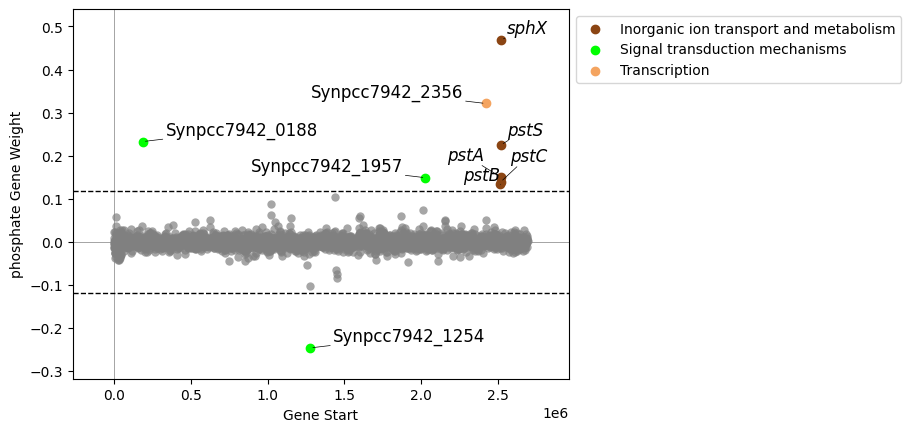

In [22]:
plot_gene_weights(ica_data,'phosphate')

<AxesSubplot:ylabel='28 iModulon\nActivity'>

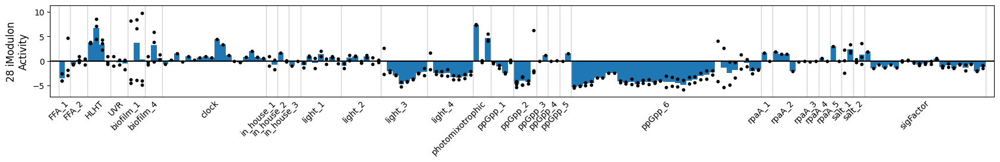

In [57]:
plot_activities(ica_data,28)

<AxesSubplot:ylabel='28 iModulon\nActivity'>

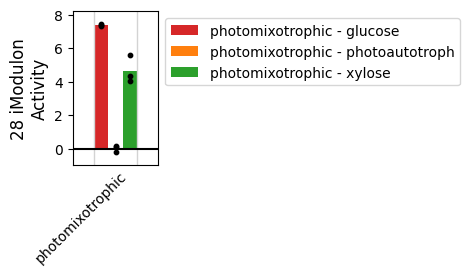

In [29]:
plot_activities(ica_data,28,projects='photomixotrophic')

In [148]:
DF_enrichments[DF_enrichments.imodulon=='28'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
16,28,M00222,3.289537e-11,6.710655e-09,0.294118,0.833333,0.434783,5.0,6.0,17.0,KEGG modules,NaN,NaN
17,28,M00434,3.819746e-05,3.896141e-03,0.117647,1.000000,0.210526,2.0,2.0,17.0,KEGG modules,NaN,NaN
37,28,map05152,7.872263e-04,5.379380e-02,0.117647,0.285714,0.166667,2.0,7.0,17.0,KEGG pathways,Tuberculosis,NaN
36,28,map02020,1.309164e-04,1.341893e-02,0.235294,0.090909,0.131148,4.0,44.0,17.0,KEGG pathways,Two-component system,NaN
35,28,map02010,3.622232e-05,7.425576e-03,0.294118,0.076923,0.121951,5.0,65.0,17.0,KEGG pathways,ABC transporters,NaN


In [21]:
# Update the ica_data object
# ica_data.rename_imodulons({28:'phosphate'})

### iModulon 38: photosystem - closer look later

In [1170]:
ica_data.view_imodulon('PSII-1')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0113,0.140393,Synpcc7942_0113,CP000100.1,,113196,113288,+,hypothetical protein,No COG annotation,Q31S24,Op122,
Synpcc7942_0456,0.099624,psbK,CP000100.1,,445209,445346,+,photosystem II PsbK protein,Function unknown,Q79AV1,Op366,
Synpcc7942_0475,0.198139,petN,CP000100.1,,460449,460544,-,cytochrome b6-f complex subunit VIII,No COG annotation,Q31R12,Op381,
Synpcc7942_0696,0.111621,psbT,CP000100.1,,689050,689145,-,photosystem II PsbT protein,No COG annotation,Q31QE1,Op543,
Synpcc7942_0699,0.120552,psbM,CP000100.1,,691619,691726,+,photosystem II PsbM protein,Function unknown,Q31QD8,Op546,
Synpcc7942_0911,-0.085067,Synpcc7942_0911,CP000100.1,,918998,919249,+,conserved hypothetical protein,No COG annotation,Q31PS8,Op699,
Synpcc7942_0997,0.069600,rpmF,CP000100.1,,1005256,1005432,-,LSU ribosomal protein L32P,"Translation, ribosomal structure and biogenesis",Q31PJ2,Op763,
Synpcc7942_1279,0.096820,Synpcc7942_1279,CP000100.1,,1301796,1302047,-,hypothetical protein,No COG annotation,Q31NR0,Op962,
Synpcc7942_1479,0.136983,petG,CP000100.1,,1530970,1531083,+,cytochrome b6-f complex subunit 5,Energy production and conversion,Q9Z3G1,Op1117,
Synpcc7942_1483,0.070285,Synpcc7942_1483,CP000100.1,,1534449,1534877,-,conserved hypothetical protein,No COG annotation,Q31N56,Op1120,


<AxesSubplot:ylabel='PSII-2 iModulon\nActivity'>

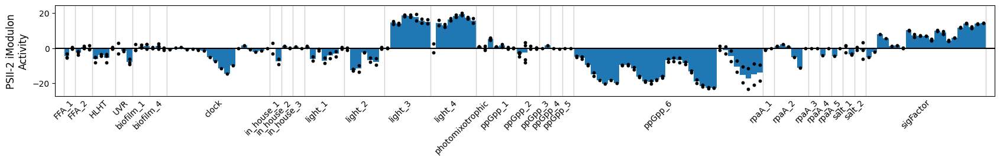

In [1081]:
plot_activities(ica_data,'PSII-2')

<AxesSubplot:ylabel='PSII-1 iModulon\nActivity'>

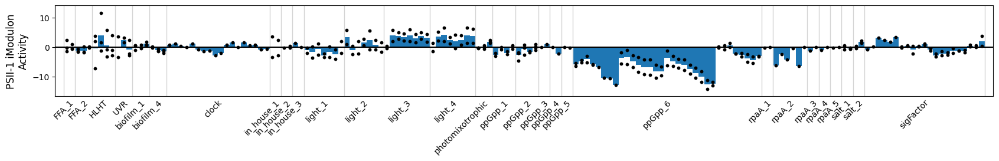

In [1082]:
plot_activities(ica_data,'PSII-1')

In [899]:
ica_data.view_imodulon('sufR')

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1731,0.129343,Synpcc7942_1731,CP000100.1,NaN,1802686,1803171,-,conserved hypothetical protein,Nucleotide transport and metabolism,Q31MF8,Op1306,NaN
Synpcc7942_1732,0.106568,Synpcc7942_1732,CP000100.1,NaN,1803168,1803578,-,conserved hypothetical protein,No COG annotation,Q31MF7,Op1306,NaN
Synpcc7942_1734,0.130198,ftrC,CP000100.1,NaN,1804395,1804757,+,ferredoxin-thioredoxin reductase catalytic chain,Energy production and conversion,Q31MF5,Op1307,sufR
Synpcc7942_1735,0.141866,sufB,CP000100.1,NaN,1804805,1806244,+,Iron-regulated ABC transporter membrane compon...,"Post-translational modification, protein turno...",Q31MF4,Op1308,sufR
Synpcc7942_1736,0.172991,sufC,CP000100.1,NaN,1806290,1807075,+,Iron-regulated ABC transporter ATPase subunit ...,"Post-translational modification, protein turno...",Q31MF3,Op1309,sufR
Synpcc7942_1737,0.176528,sufD,CP000100.1,NaN,1807075,1808403,+,Iron-regulated ABC transporter permease protei...,"Post-translational modification, protein turno...",Q31MF2,Op1309,sufR
Synpcc7942_1738,0.186087,sufS,CP000100.1,NaN,1808413,1809672,+,cysteine desulfurase,Amino acid transport and metabolism,Q31MF1,Op1309,sufR
Synpcc7942_1739,0.176539,merR,CP000100.1,NaN,1809717,1810142,+,transcriptional regulator%2C MerR family,Transcription,Q31MF0,Op1310,NaN


<AxesSubplot:ylabel='sufR iModulon\nActivity'>

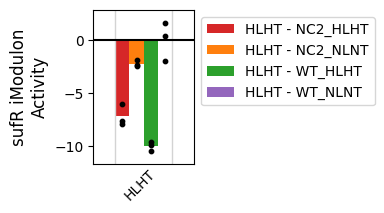

In [898]:
plot_activities(ica_data,'sufR',projects='HLHT')

<AxesSubplot:xlabel='HLHT:WT_NLNT', ylabel='HLHT:WT_HLHT'>

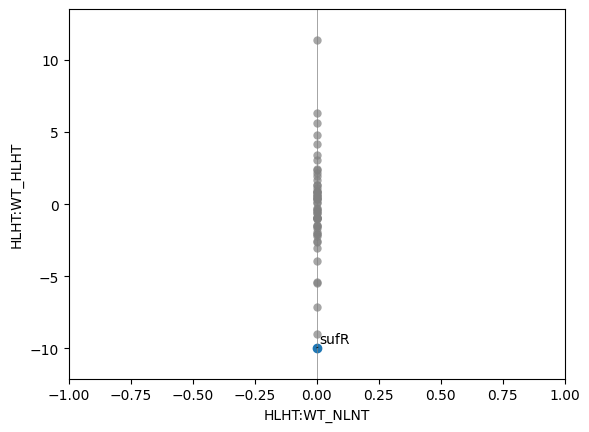

In [812]:
plot_dima(ica_data,'HLHT:WT_NLNT','HLHT:WT_HLHT')

<AxesSubplot:ylabel='38 iModulon\nActivity'>

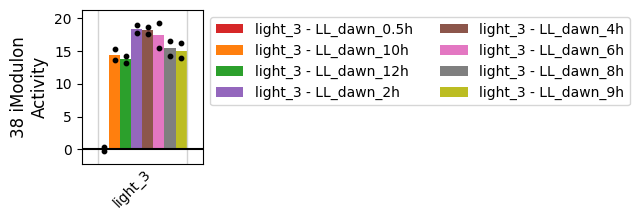

In [136]:
plot_activities(ica_data,38,projects='light_3')

<AxesSubplot:ylabel='38 iModulon\nActivity'>

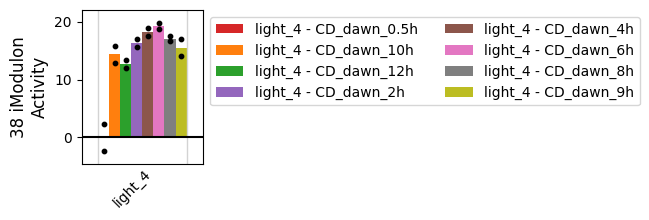

In [137]:
plot_activities(ica_data,38,projects='light_4')

<AxesSubplot:ylabel='38 iModulon\nActivity'>

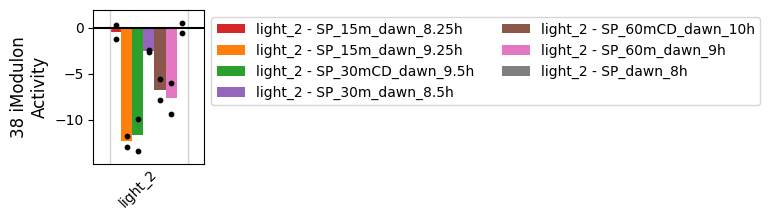

In [139]:
plot_activities(ica_data,38,projects='light_2')

<AxesSubplot:ylabel='PSII-2 iModulon\nActivity'>

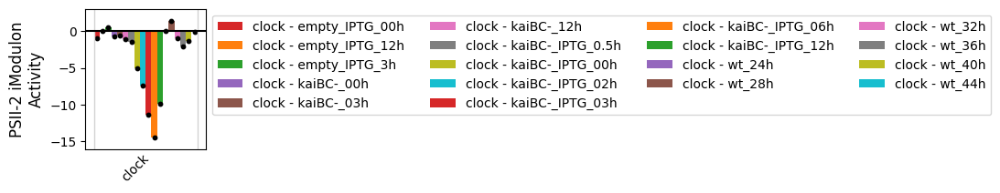

In [365]:
plot_activities(ica_data,'PSII-2',projects='clock')

<AxesSubplot:ylabel='PSII-2 iModulon\nActivity'>

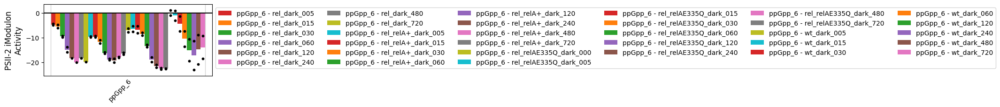

In [364]:
plot_activities(ica_data,'PSII-2',projects='ppGpp_6')

In [140]:
DF_enrichments[DF_enrichments.imodulon=='38'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
42,38,map00196,5.173019e-22,1.060469e-19,0.295455,0.812500,0.433333,13.0,16.0,44.0,KEGG pathways,Photosynthesis - antenna proteins,NaN
43,38,map00195,6.934575e-10,7.107940e-08,0.250000,0.192982,0.217822,11.0,57.0,44.0,KEGG pathways,Photosynthesis,NaN
20,38,M00161,2.289009e-07,4.669579e-05,0.113636,0.500000,0.185185,5.0,10.0,44.0,KEGG modules,NaN,Photosystem II
45,38,map02025,1.309164e-04,6.709466e-03,0.090909,0.235294,0.131148,4.0,17.0,44.0,KEGG pathways,Biofilm formation - Pseudomonas aeruginosa,NaN
21,38,M00507,8.082307e-05,8.243953e-03,0.068182,0.500000,0.120000,3.0,6.0,44.0,KEGG modules,NaN,NaN
46,38,map02020,6.501595e-04,2.665654e-02,0.113636,0.113636,0.113636,5.0,44.0,44.0,KEGG pathways,Two-component system,NaN
44,38,map01100,1.897039e-08,1.296310e-06,0.590909,0.047445,0.087838,26.0,548.0,44.0,KEGG pathways,Metabolic pathways,NaN


In [250]:
# Update the ICA data object

# ica_data.rename_imodulons({'photosystem':'PSII-2'})
# ica_data.imodulon_table.loc['photosystem','category'] = 'functional'

### iModulon 42: unknown

In [198]:
ica_data.view_imodulon(42)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
HTX97_RS00010,-0.038047,HTX97_RS00010,NC_004990.1,pUH24_03%2CST32046_p3,574,1161,-,hypothetical protein,No COG annotation,,Op3,
HTX97_RS00005,-0.035832,HTX97_RS00005,NC_004990.1,pUH24_01%2CST32046_p1,7504,8145,-,hypothetical protein,No COG annotation,,Op17,
Synpcc7942_0014,0.048969,Synpcc7942_0014,CP000100.1,,13067,13411,-,conserved hypothetical protein,Signal transduction mechanisms,Q31SC3,Op29,
Synpcc7942_0032,0.087094,Synpcc7942_0032,CP000100.1,,32849,33202,-,conserved hypothetical protein,Function unknown,Q31SA5,Op50,
Synpcc7942_0033,0.185011,-,CP000100.1,,33174,33506,-,conserved hypothetical protein,Function unknown,Q31SA4,Op51,
...,...,...,...,...,...,...,...,...,...,...,...,...
Synpcc7942_B2662,0.035924,srpI,CP000101.1,,5275,6195,-,major membrane protein I,No COG annotation,Q55032,Op12,
Synpcc7942_B2616,0.077161,anL42,CP000101.1,,8691,9050,+,conserved hypothetical protein,No COG annotation,Q8KUU4,Op19,
Synpcc7942_B2655,0.110961,anL58,CP000101.1,,22675,23511,-,conserved hypothetical protein,No COG annotation,Q8KUT3,Op39,
Synpcc7942_B2656,0.160087,anL02,CP000101.1,,27980,28894,-,hypothetical protein,No COG annotation,Q8KUX3,Op45,


<AxesSubplot:xlabel='Gene Start', ylabel='42 Gene Weight'>

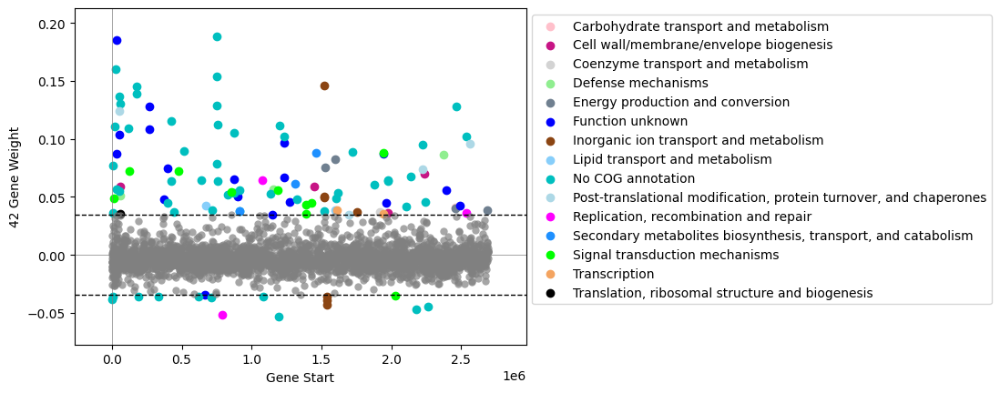

In [199]:
plot_gene_weights(ica_data,42)

<AxesSubplot:ylabel='42 iModulon\nActivity'>

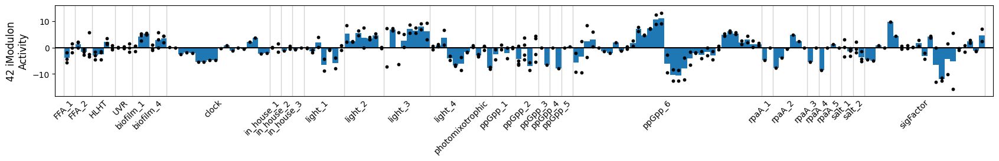

In [200]:
plot_activities(ica_data,42)

In [201]:
DF_enrichments[DF_enrichments.imodulon=='42'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
22,42,M00321,0.000343,0.070018,0.025,0.75,0.048387,3.0,4.0,120.0,KEGG modules,NaN,NaN


In [335]:
# Update ICA data object
# ica_data.rename_imodulons({42:'unchar-5'})
# ica_data.imodulon_table.loc['unchar-5','category'] = 'uncharacterized'

### iModulon 45: unknown

In [171]:
ica_data.view_imodulon(45)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0437,0.087484,sel0033,CP000100.1,,427463,428029,+,putative glutathione peroxidase,No COG annotation,Q8GMQ9,Op350,
Synpcc7942_0918,-0.111153,fadD,CP000100.1,,924079,926028,+,long-chain-fatty-acid CoA ligase,Lipid transport and metabolism,Q31PS1,Op704,
Synpcc7942_1023,0.147188,-,CP000100.1,,1037841,1038086,-,conserved hypothetical protein,No COG annotation,Q31PG6,Op782,
Synpcc7942_1563,0.091060,Synpcc7942_1563,CP000100.1,,1621096,1621512,-,signal transduction inhibitor,No COG annotation,Q31MX6,Op1181,
Synpcc7942_2127,0.098265,nblA,CP000100.1,,2207167,2207346,+,phycobilisome degradation protein NblA,No COG annotation,P35087,Op1601,


<AxesSubplot:xlabel='Gene Start', ylabel='45 Gene Weight'>

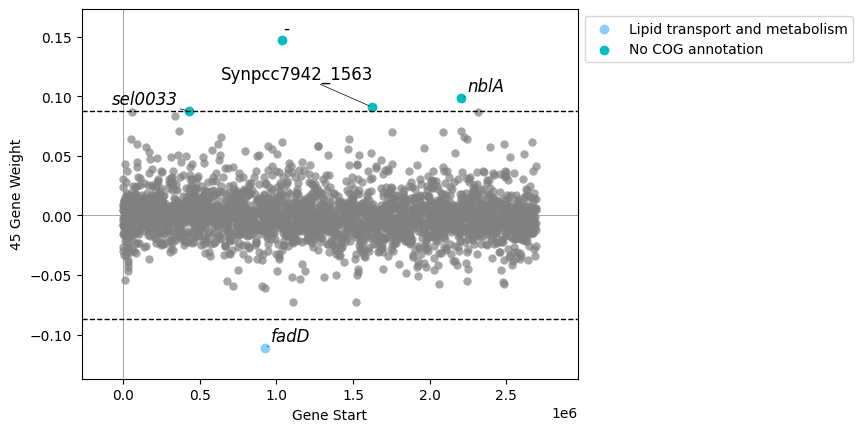

In [172]:
plot_gene_weights(ica_data,45)

<AxesSubplot:ylabel='45 iModulon\nActivity'>

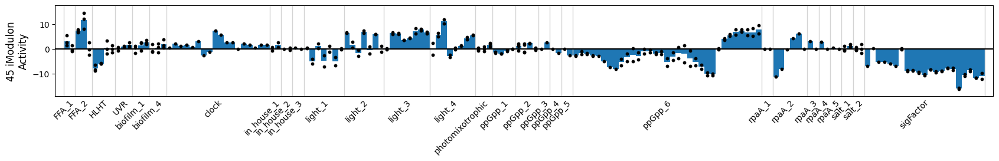

In [173]:
plot_activities(ica_data,45)

<AxesSubplot:ylabel='45 iModulon\nActivity'>

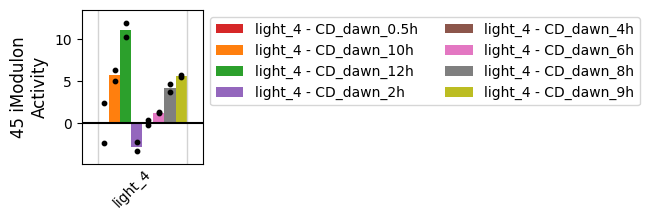

In [178]:
plot_activities(ica_data,45,projects = 'light_4')

In [151]:
DF_enrichments[DF_enrichments.imodulon=='45'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [337]:
# ica_data.rename_imodulons({45:'unchar-6'})
# ica_data.imodulon_table.loc['unchar-6','category'] = 'uncharacterized'

### iModulon 47: sps_ko

In [67]:
ica_data.view_imodulon(47)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon
Synpcc7942_0808,0.361658,spsA,CP000100.1,NaN,800851,802980,-,HAD-superfamily hydrolase subfamily IIB,Cell wall/membrane/envelope biogenesis,Q31Q29,Op621
Synpcc7942_0809,-0.204011,Synpcc7942_0809,CP000100.1,NaN,803073,804815,+,conserved hypothetical protein,Cell wall/membrane/envelope biogenesis,Q31Q28,Op622
Synpcc7942_0810,-0.098993,Synpcc7942_0810,CP000100.1,NaN,804853,805086,+,hypothetical protein,No COG annotation,Q31Q27,Op622
Synpcc7942_1290,-0.102221,-,CP000100.1,NaN,1313290,1313460,-,SmtA metallothionein,Function unknown,P30331,Op968
Synpcc7942_1475,0.107325,sbtA,CP000100.1,NaN,1525833,1526954,-,sodium-dependent bicarbonate transporter,Function unknown,Q31N64,Op1113
Synpcc7942_1488,-0.101347,cmpA,CP000100.1,NaN,1538545,1539897,+,membrane protein,Inorganic ion transport and metabolism,P39660,Op1122
Synpcc7942_1489,-0.121481,cmpB,CP000100.1,NaN,1539953,1540789,+,nitrate transport permease,Inorganic ion transport and metabolism,Q55106,Op1122
Synpcc7942_1490,-0.155393,cmpC,CP000100.1,NaN,1540818,1542809,+,nitrate transport ATP-binding subunits C and D,Inorganic ion transport and metabolism,Q55107,Op1122
Synpcc7942_1491,-0.159504,cmpD,CP000100.1,NaN,1542834,1543670,+,nitrate transport ATP-binding subunits C and D,Inorganic ion transport and metabolism,Q55108,Op1122
Synpcc7942_B2617,0.104781,anL43,CP000101.1,NaN,9300,9845,-,conserved hypothetical protein,No COG annotation,Q8KUU3,Op21


<AxesSubplot:xlabel='Gene Start', ylabel='47 Gene Weight'>

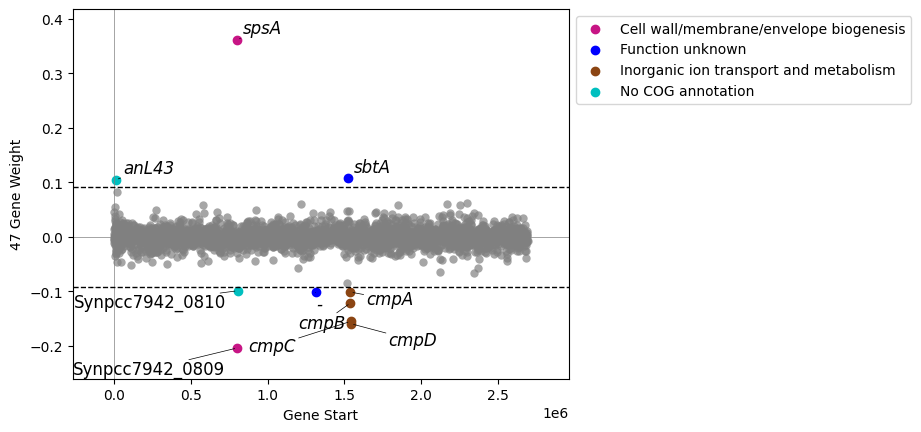

In [23]:
plot_gene_weights(ica_data,47)

<AxesSubplot:ylabel='47 iModulon\nActivity'>

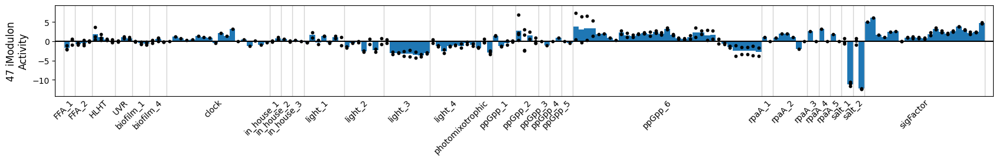

In [68]:
plot_activities(ica_data,47)

<AxesSubplot:ylabel='47 iModulon\nActivity'>

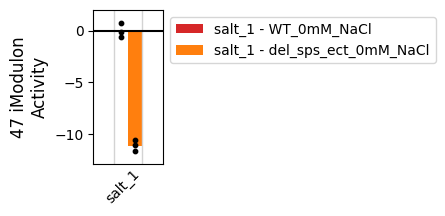

In [30]:
plot_activities(ica_data,47,projects='salt_1')

<AxesSubplot:ylabel='47 iModulon\nActivity'>

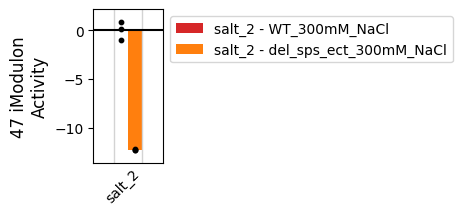

In [31]:
plot_activities(ica_data,47,projects='salt_2')

In [152]:
DF_enrichments[DF_enrichments.imodulon=='47'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [24]:
# Update ICA data object
# ica_data.rename_imodulons({47:'sps_ko'})
# ica_data.imodulon_table.loc['yxi-operon','category'] = 'functional'

### iModulon 51: ribosome

In [161]:
ica_data.view_imodulon(51)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0632,0.086440,rplJ,CP000100.1,NaN,624322,624849,-,LSU ribosomal protein L10P,"Translation, ribosomal structure and biogenesis",Q31QK5,Op493,L10_leader
Synpcc7942_0633,0.081628,rplA,CP000100.1,NaN,625078,625791,-,LSU ribosomal protein L1P,"Translation, ribosomal structure and biogenesis",Q31QK4,Op494,NaN
Synpcc7942_0634,0.083561,rplK,CP000100.1,NaN,625866,626291,-,LSU ribosomal protein L11P,"Translation, ribosomal structure and biogenesis",Q31QK3,Op495,NaN
Synpcc7942_0693,0.088678,Synpcc7942_0693,CP000100.1,NaN,686247,687080,-,conserved hypothetical protein,Function unknown,Q31QE4,Op540,NaN
Synpcc7942_0886,0.083238,rpsG,CP000100.1,NaN,893112,893582,-,SSU ribosomal protein S7P,"Translation, ribosomal structure and biogenesis",Q31PV3,Op678,NaN
Synpcc7942_0887,0.080060,rpsL,CP000100.1,NaN,893750,894124,-,SSU ribosomal protein S12P,"Translation, ribosomal structure and biogenesis",P63200,Op679,NaN
Synpcc7942_1084,-0.079708,-,CP000100.1,NaN,1099185,1099628,-,hypothetical protein,No COG annotation,Q31PA5,Op825,NaN
Synpcc7942_1122,0.120325,rpmG,CP000100.1,NaN,1140801,1140995,+,LSU ribosomal protein L33P,"Translation, ribosomal structure and biogenesis",Q31P67,Op851,NaN
Synpcc7942_1123,0.117764,rpsR,CP000100.1,NaN,1141051,1141266,+,SSU ribosomal protein S18P,"Translation, ribosomal structure and biogenesis",Q31P66,Op852,NaN
Synpcc7942_1222,0.078151,truB,CP000100.1,NaN,1242925,1243809,+,tRNA pseudouridine synthase B,"Translation, ribosomal structure and biogenesis",Q8KIY0,Op923,NaN


<AxesSubplot:ylabel='51 iModulon\nActivity'>

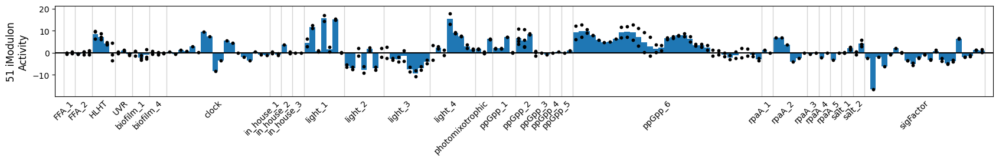

In [162]:
plot_activities(ica_data,51)

In [163]:
DF_enrichments[DF_enrichments.imodulon=='51'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name
50,51,map03010,4.404872e-13,9.029988e-11,0.642857,0.169811,0.268657,9.0,53.0,14.0,KEGG pathways,Ribosome,NaN
24,51,M00178,4.404872e-13,8.985939e-11,0.642857,0.169811,0.268657,9.0,53.0,14.0,KEGG modules,NaN,NaN
25,51,M00179,2.364095e-07,2.411377e-05,0.357143,0.166667,0.227273,5.0,30.0,14.0,KEGG modules,NaN,NaN


In [166]:
# Update ICA data object
# ica_data.rename_imodulons({51:'ribosome'})
# ica_data.imodulon_table.loc['ribosome','category'] = 'functional'

### iModulon 52: unknown

In [187]:
ica_data.view_imodulon(52)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_1165,0.423366,Synpcc7942_1165,CP000100.1,,1198844,1199239,-,hypothetical protein,Nucleotide transport and metabolism,Q31P24,Op888,
Synpcc7942_1539,-0.093939,-,CP000100.1,,1597516,1597818,-,conserved hypothetical protein,No COG annotation,Q31N00,Op1160,
Synpcc7942_2157,0.104686,Synpcc7942_2157,CP000100.1,,2240800,2241084,-,conserved hypothetical protein,No COG annotation,Q31L82,Op1625,
Synpcc7942_2275,0.293566,Synpcc7942_2275,CP000100.1,,2343631,2343915,+,hypothetical protein,No COG annotation,Q31KW4,Op1704,


<AxesSubplot:xlabel='Gene Start', ylabel='52 Gene Weight'>

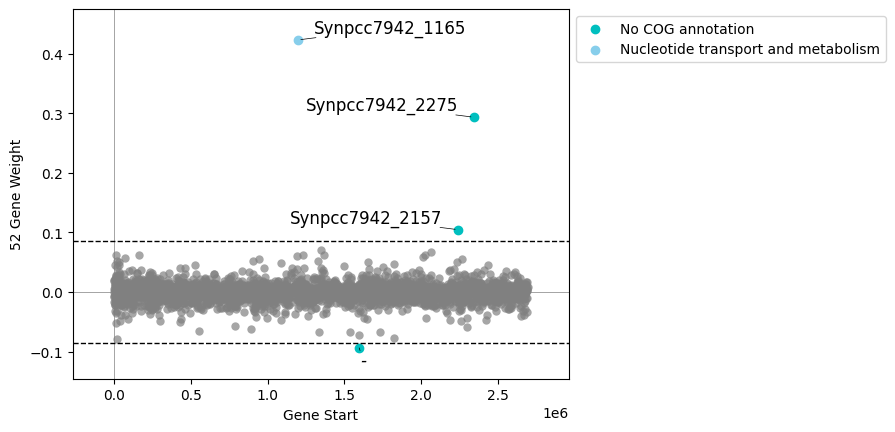

In [188]:
plot_gene_weights(ica_data,52)

<AxesSubplot:ylabel='52 iModulon\nActivity'>

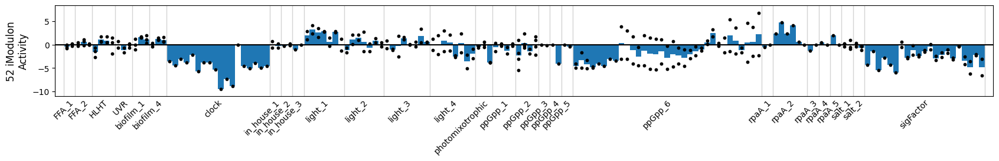

In [189]:
plot_activities(ica_data,52)

<AxesSubplot:ylabel='52 iModulon\nActivity'>

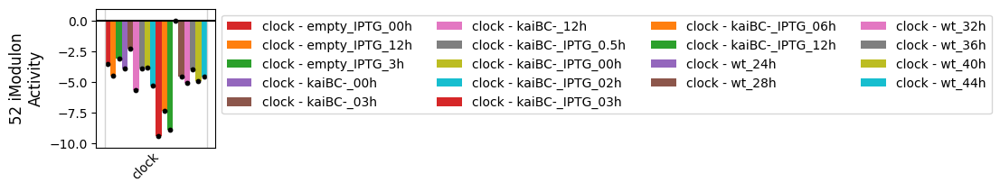

In [191]:
plot_activities(ica_data,52,projects='clock')

In [190]:
DF_enrichments[DF_enrichments.imodulon=='52'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [338]:
# Update ICA data object
# ica_data.rename_imodulons({52:'unchar-7'})
# ica_data.imodulon_table.loc['unchar-7','category'] = 'uncharacterized'

### iModulon 53: unknown

In [192]:
ica_data.view_imodulon(53)

,gene_weight,gene_name,accession,old_locus_tag,start,end,strand,gene_product,COG,uniprot,operon,regulator
Synpcc7942_0063,-0.077730,Synpcc7942_0063,CP000100.1,,64266,64706,-,dual specificity protein phosphatase,Signal transduction mechanisms,Q31S74,Op86,
Synpcc7942_0353,0.068353,Synpcc7942_0353,CP000100.1,,345470,346432,+,Na+-dependent transporter-like,Function unknown,Q31RD4,Op288,
Synpcc7942_0383,0.087053,Synpcc7942_0383,CP000100.1,,375762,376448,-,hypothetical protein,Function unknown,Q31RA4,Op310,
Synpcc7942_0630,0.071614,Synpcc7942_0630,CP000100.1,,622432,623574,+,hypothetical protein,Function unknown,Q31QK7,Op491,
Synpcc7942_1281,0.083935,Synpcc7942_1281,CP000100.1,,1303144,1303836,-,conserved hypothetical protein,Function unknown,Q31NQ8,Op962,
Synpcc7942_1343,0.099991,ndhA,CP000100.1,,1377217,1378335,+,NADH dehydrogenase subunit 1,Energy production and conversion,Q31NJ6,Op1011,
Synpcc7942_1344,0.072562,ndhI,CP000100.1,,1378378,1378986,+,NADH-plastoquinone oxidoreductase%2C I subunit...,Energy production and conversion,Q31NJ5,Op1011,
Synpcc7942_1361,0.068843,Synpcc7942_1361,CP000100.1,,1401085,1401588,+,conserved hypothetical protein,Function unknown,Q31NH8,Op1021,
Synpcc7942_1426,0.073147,cbbL,CP000100.1,,1479461,1480879,+,ribulose-1%2C5-bisphosphate carboxylase/oxygen...,Coenzyme transport and metabolism,Q31NB3,Op1077,
Synpcc7942_1648,0.102862,Synpcc7942_1648,CP000100.1,,1716189,1716638,-,putative ferric uptake regulator%2C FUR family,Transcription,Q31MP1,Op1244,perR


<AxesSubplot:xlabel='Gene Start', ylabel='53 Gene Weight'>

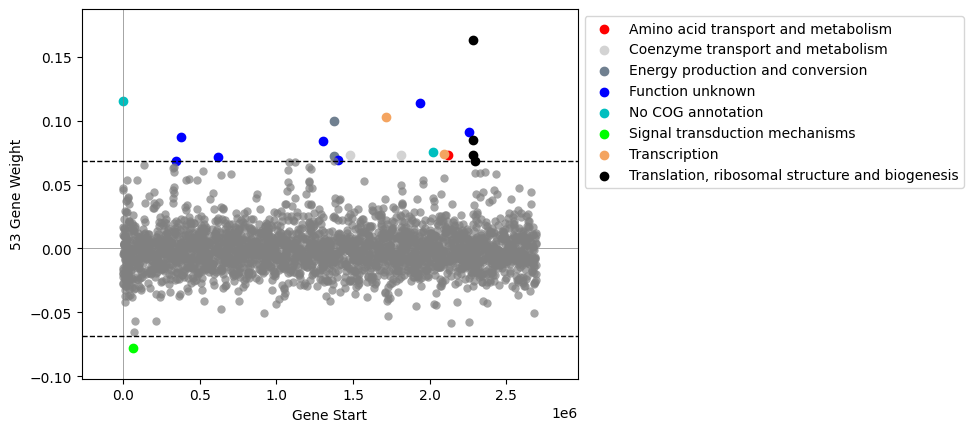

In [330]:
plot_gene_weights(ica_data,53)

<AxesSubplot:ylabel='53 iModulon\nActivity'>

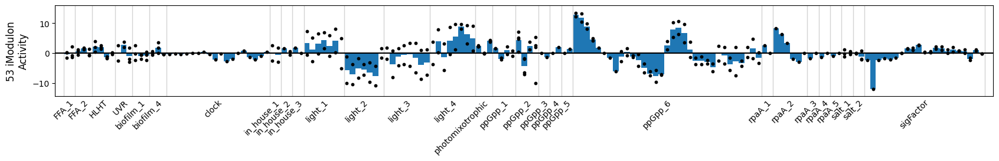

In [193]:
plot_activities(ica_data,53)

<AxesSubplot:ylabel='53 iModulon\nActivity'>

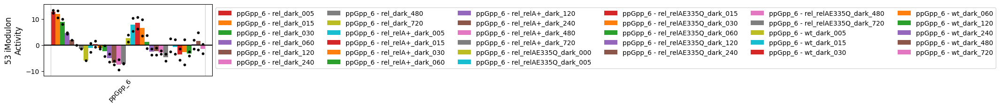

In [194]:
plot_activities(ica_data,53,projects='ppGpp_6')

<AxesSubplot:ylabel='53 iModulon\nActivity'>

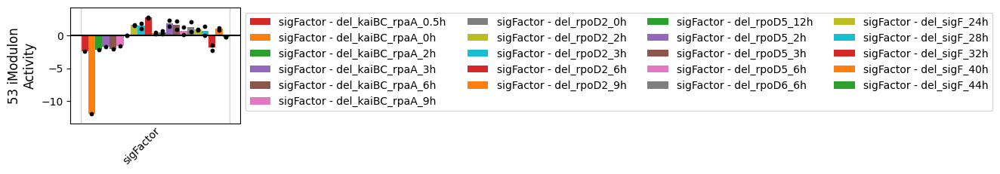

In [195]:
plot_activities(ica_data,53,projects='sigFactor')

In [160]:
DF_enrichments[DF_enrichments.imodulon=='53'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,pathway_name,module_name


In [339]:
# Update ICA data object
# ica_data.rename_imodulons({53:'unchar-8'})
# ica_data.imodulon_table.loc['unchar-8','category'] = 'uncharacterized'

# DIMA

<AxesSubplot:xlabel='clock:kaiBC-_IPTG_03h', ylabel='clock:kaiBC-_IPTG_00h'>

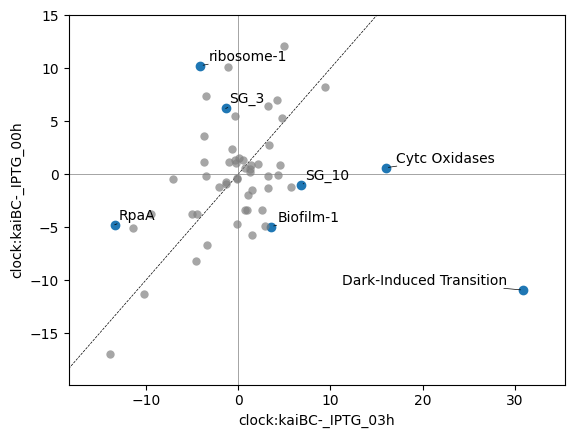

In [831]:
plot_dima(ica_data,'clock:kaiBC-_IPTG_03h','clock:kaiBC-_IPTG_00h')

/home/annie/Documents/multi-Ecoli/strains/pymodulon/util.py:174: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  _diff[":".join(name)] = abs(A_to_use[i1] - A_to_use[i2])


<AxesSubplot:xlabel='clock:empty_IPTG_3h', ylabel='clock:kaiBC-_IPTG_03h'>

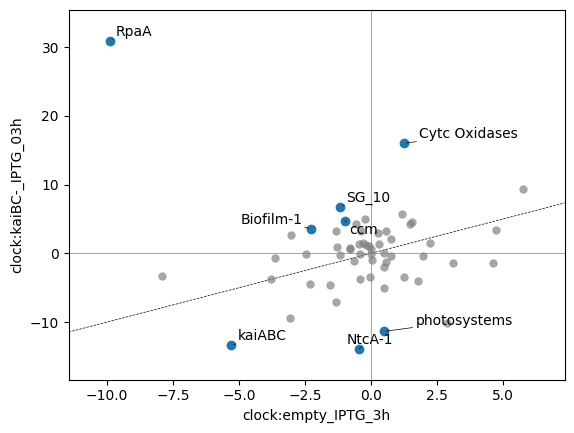

In [1195]:
plot_dima(ica_data,'clock:empty_IPTG_3h','clock:kaiBC-_IPTG_03h')

<AxesSubplot:ylabel='PSII-1 iModulon\nActivity'>

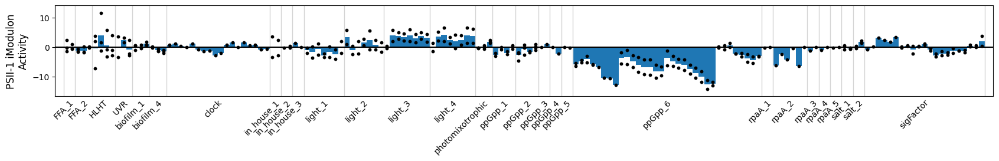

In [803]:
plot_activities(ica_data,'PSII-1')

<AxesSubplot:ylabel='PSII-1 iModulon\nActivity'>

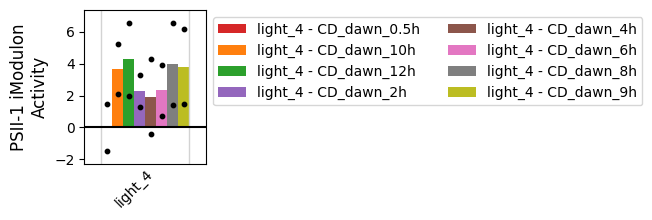

In [1035]:
plot_activities(ica_data,'PSII-1',projects='light_4')

<AxesSubplot:xlabel='clock:kaiBC-_IPTG_0.5h', ylabel='clock:kaiBC-_IPTG_02h'>

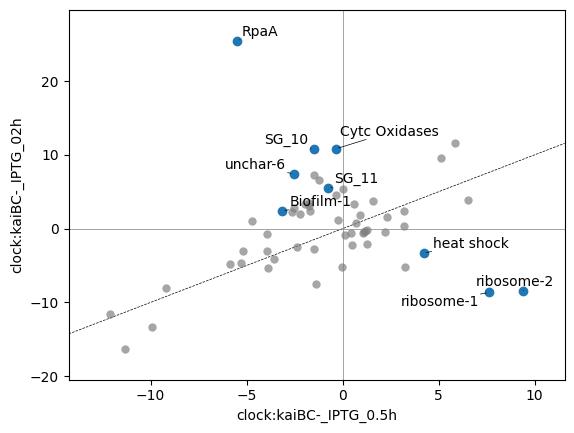

In [1023]:
plot_dima(ica_data,'clock:kaiBC-_IPTG_0.5h','clock:kaiBC-_IPTG_02h')

<AxesSubplot:xlabel='rpaA_2:del_2dark_015', ylabel='rpaA_2:wt_2dark_015'>

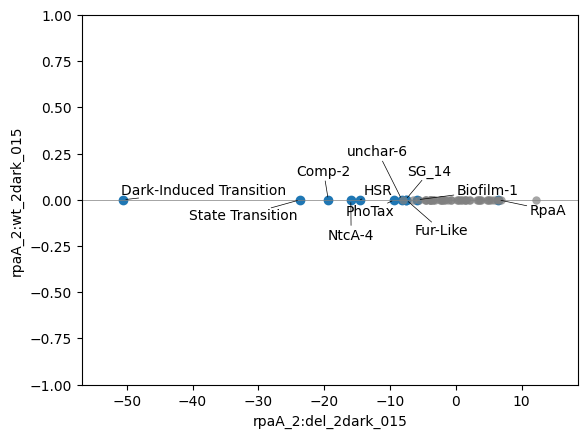

In [878]:
plot_dima(ica_data,'rpaA_2:del_2dark_015','rpaA_2:wt_2dark_015')

# Cluster activities

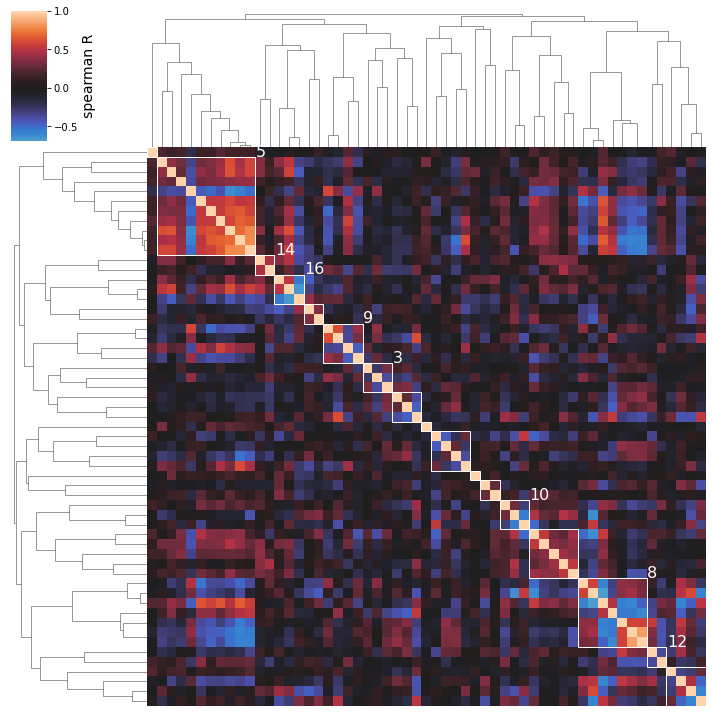

[AgglomerativeClustering(affinity='precomputed', compute_full_tree=True,
                         distance_threshold=0.8, linkage='complete',
                         n_clusters=None)]

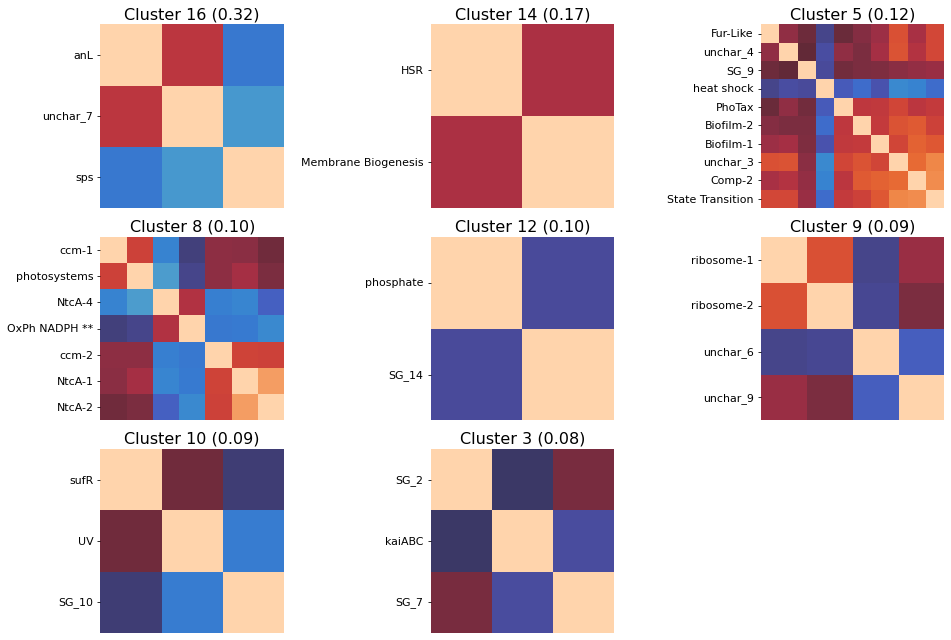

In [158]:
cluster_activities(ica_data,
                   distance_threshold=0.8,
                   show_best_clusters=True,
                   correlation_method = 'spearman')

<AxesSubplot:ylabel='unchar_3 iModulon\nActivity'>

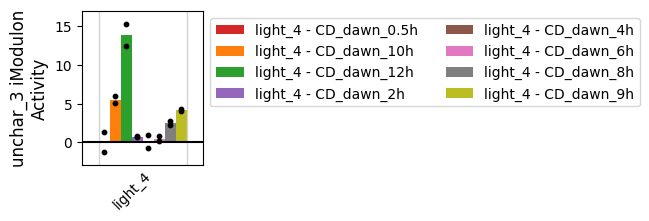

In [1509]:
plot_activities(ica_data,'unchar_3',projects='light_4')

In [1529]:
plot_dima?

/home/annie/Documents/multi-Ecoli/strains/pymodulon/util.py:174: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  _diff[":".join(name)] = abs(A_to_use[i1] - A_to_use[i2])


<AxesSubplot:xlabel='light_4:CD_dawn_2h', ylabel='light_4:CD_dawn_9h'>

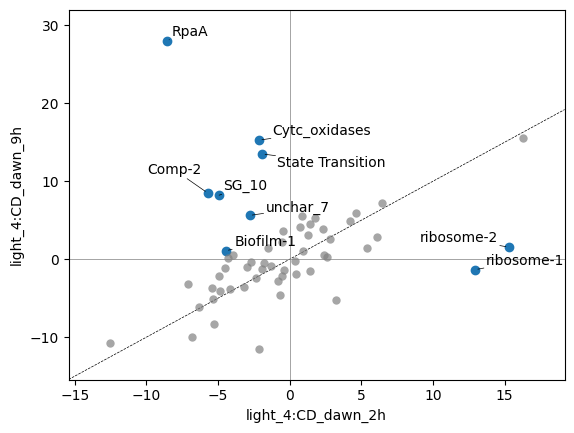

In [1536]:
plot_dima(ica_data,'light_4:CD_dawn_2h','light_4:CD_dawn_9h')

<AxesSubplot:xlabel='light_4:CD_dawn_2h', ylabel='light_4:CD_dawn_10h'>

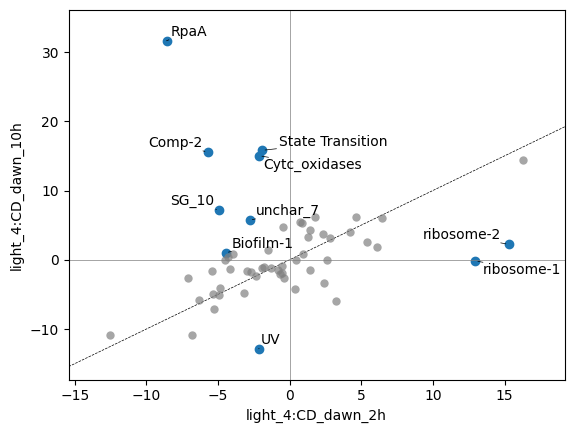

In [1524]:
plot_dima(ica_data,'light_4:CD_dawn_2h','light_4:CD_dawn_10h')

<AxesSubplot:xlabel='light_4:CD_dawn_2h', ylabel='light_4:CD_dawn_12h'>

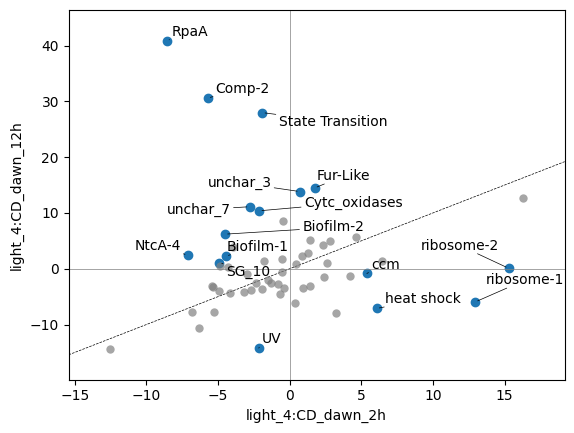

In [1523]:
plot_dima(ica_data,'light_4:CD_dawn_2h','light_4:CD_dawn_12h')

<AxesSubplot:xlabel='rpaA_2:del_2dark_015', ylabel='rpaA_2:wt_2dark_015'>

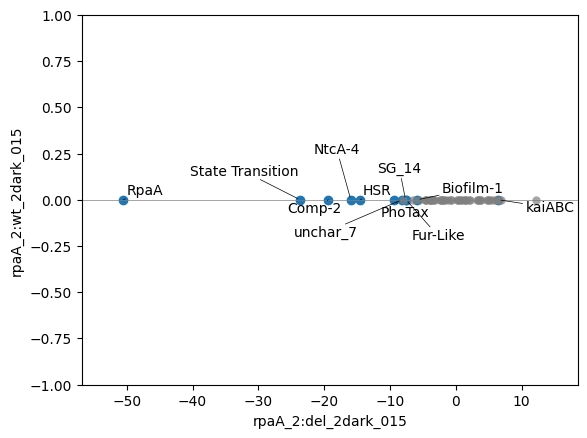

In [1500]:
plot_dima(ica_data,'rpaA_2:del_2dark_015','rpaA_2:wt_2dark_015')

# Activity trends

In [10]:
clst14 = ['ccm','CysR','NtcA-1','NtcA-2','ccmR-1','sigA2','photosystems']
clst1 = ['anL','Phage Related','OxiTol','ccmR-2','heat shock','unchar_4','IdiB']
clst13 = ['HSR','kaiABC','Biofilm-2','unchar_7','unchar_6','Comp-2','unchar_3','State Transition','unchar_1',
          'unchar_4']

In [11]:
p6 = ['ccm','kaiABC','PSII','ribosome-1','unchar_3','anL','ccmR-1','sigA2','NtcA-1','CysR','photosystems',
     'Membrane Biogenesis','Comp-2','PhoTax','OxiTol','phosphate','SG_8','NtcA-2','State Transition','ribosome-2',
     'sufR','NtcA-4']
# 'Biofilm-1','Biofilm-2','unchar_7'

In [12]:
light4 = ['ccm','ribosome-1','kaiABC','unchar_1','unchar_3','anL','Cytc_oxidases','Comp-2',
          'State Transition','unchar_7','ribosome-2','NtcA-4']
# 'UV''RpaA',

In [13]:
clst = ['CysR','NtcA-1','NtcA-2','ccmR-1','RpaA','PSII','ccm','sigA2','ribosome-1','ribosome-2']

In [14]:
clock_idx = ica_data.sample_table[ica_data.sample_table['project'] == 'clock'].index

In [15]:
light4 = ['State Transition','Cytc_oxidases','Comp-2','unchar_3',
          'unchar_7','kaiABC','NtcA-4','ribosome-1','ribosome-2','ccm','unchar_1']

In [23]:
def ppgpp6_activity(ica_data,imod_list):
    A = ica_data.A
    _15 = ['SRX3176782','SRX3176800']
    _30 = ['SRX3176783','SRX3176801']
    _60 = ['SRX3176784','SRX3176802']
    _120 = ['SRX3176785','SRX3176803']
    _240 = ['SRX3176786','SRX3176804']
    _480 = ['SRX3176787','SRX3176805']
    _720 = ['SRX3176788','SRX3176806']
    
    rela_5 = ['SRX3312460', 'SRX3312478']
    rela_15 = ['SRX3312461', 'SRX3312479']
    rela_30 = ['SRX3312462', 'SRX3312480']
    rela_60 = ['SRX3312463', 'SRX3312481']
    rela_120 = ['SRX3312464', 'SRX3312482']
    rela_240 = ['SRX3312465', 'SRX3312483']
    rela_480 = ['SRX3312466', 'SRX3312484']
    rela_720 = ['SRX3312467', 'SRX3312485']

    del_rela_5 = ['SRX3176790', 'SRX3176808']
    del_rela_15 = ['SRX3176791', 'SRX3176809']
    del_rela_30 = ['SRX3176792', 'SRX3176810']
    del_rela_60 = ['SRX3176793', 'SRX3176811']
    del_rela_120 = ['SRX3176794']
    del_rela_240 = ['SRX3176795']
    del_rela_480 = ['SRX3176796']
    del_rela_720 = ['SRX3176797']
    
    relae335q_0 = ['SRX3312468', 'SRX3312486']
    relae335q_5 = ['SRX3312469', 'SRX3312487']
    relae335q_15 = ['SRX3312470', 'SRX3312488']
    relae335q_30 = ['SRX3312471','SRX3312489']
    relae335q_60 = ['SRX3312472', 'SRX3312490']
    relae335q_120 = ['SRX3312473', 'SRX3312491']
    relae335q_240 = ['SRX3312474', 'SRX3312492']
    relae335q_480 = ['SRX3312475', 'SRX3312493']
    relae335q_720 = ['SRX3312476', 'SRX3312494']
    
    activity_array = []
    for imod in imod_list:
        result = []
        lists = [_15, _30, _60, _120, _240, _480, _720,rela_5, rela_15, rela_30, rela_60, rela_120, rela_240, 
                 rela_480, rela_720,del_rela_5, del_rela_15, del_rela_30, del_rela_60]
        for sublist in lists:
            avg = (A.loc[imod][sublist[0]] + A.loc[imod][sublist[1]]) / 2
            result.append(avg)
        
        result.append(A.loc[imod][del_rela_120][0])
        result.append(A.loc[imod][del_rela_240][0])
        result.append(A.loc[imod][del_rela_480][0])        
        result.append(A.loc[imod][del_rela_720][0])
        
        lists = [relae335q_0, relae335q_5, relae335q_15, relae335q_30, relae335q_60, relae335q_120, relae335q_240, 
        relae335q_480, relae335q_720]
        for sublist in lists:
            avg = (A.loc[imod][sublist[0]] + A.loc[imod][sublist[1]]) / 2
            result.append(avg)
        
        activity_array.append(result)
    col_index = ["_15", "_30", "_60", "_120", "_240", "_480", "_720","rela_5", "rela_15", "rela_30", 
                  "rela_60", "rela_120", "rela_240", "rela_480", "rela_720","del_rela_5", "del_rela_15", 
                  "del_rela_30", "del_rela_60", "del_rela_120", "del_rela_240", "del_rela_480", "del_rela_720",
                  "relae335q_0", "relae335q_5", "relae335q_15", "relae335q_30", "relae335q_60", "relae335q_120",
                  "relae335q_240", "relae335q_480", "relae335q_720"]

    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = col_index)
    return activity_df

In [24]:
def light3_activity(ica_data,imod_list):
    A = ica_data.A
#     ctrl = ["SRX3211304", "SRX3211305"]
    _2h = ["SRX3211306", "SRX3211307"]
    _4h = ["SRX3211308", "SRX3211309"]
    _6h = ["SRX3211310", "SRX3211311"]
    _8h = ["SRX3211312", "SRX3211313"]
    _9h = ["SRX3211314", "SRX3211315"]
    _10h = ["SRX3211316", "SRX3211317"]
    _12h = ["SRX3211318", "SRX3211319"]
    
    activity_array = []
    for imod in imod_list:
#         a1 = (A.loc[imod][ctrl[0]] + A.loc[imod][ctrl[1]]) / 2
        a2 = (A.loc[imod][_2h[0]] + A.loc[imod][_2h[1]]) / 2
        a3 = (A.loc[imod][_4h[0]] + A.loc[imod][_4h[1]]) / 2
        a4 = (A.loc[imod][_6h[0]] + A.loc[imod][_6h[1]]) / 2
        a5 = (A.loc[imod][_8h[0]] + A.loc[imod][_8h[1]]) / 2
        a6 = (A.loc[imod][_9h[0]] + A.loc[imod][_9h[1]]) / 2
        a7 = (A.loc[imod][_10h[0]] + A.loc[imod][_10h[1]]) / 2
        a8 = (A.loc[imod][_12h[0]] + A.loc[imod][_12h[1]]) / 2

        activity_array.append([a2,a3,a4,a5,a6,a7,a8])
    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = ['LL_2h','LL_4h','LL_6h',
                                                                            'LL_8h','LL_9h','LL_10h','LL_12h'])
    return activity_df

In [25]:
def light4_activity(ica_data,imod_list):
    A = ica_data.A
#     ctrl = ['SRX3211320','SRX3211321']
    _2h = ['SRX3211322','SRX3211323']
    _4h = ['SRX3211324','SRX3211325']
    _6h = ['SRX3211326','SRX3211327']
    _8h = ['SRX3211328','SRX3211329']
    _9h = ['SRX3211330','SRX3211331']
    _10h = ['SRX3211332','SRX3211333']
    _12h = ['SRX3211334','SRX3211335']
    
    activity_array = []
    for imod in imod_list:
#         a1 = (A.loc[imod][ctrl[0]] + A.loc[imod][ctrl[1]]) / 2
        a2 = (A.loc[imod][_2h[0]] + A.loc[imod][_2h[1]]) / 2
        a3 = (A.loc[imod][_4h[0]] + A.loc[imod][_4h[1]]) / 2
        a4 = (A.loc[imod][_6h[0]] + A.loc[imod][_6h[1]]) / 2
        a5 = (A.loc[imod][_8h[0]] + A.loc[imod][_8h[1]]) / 2
        a6 = (A.loc[imod][_9h[0]] + A.loc[imod][_9h[1]]) / 2
        a7 = (A.loc[imod][_10h[0]] + A.loc[imod][_10h[1]]) / 2
        a8 = (A.loc[imod][_12h[0]] + A.loc[imod][_12h[1]]) / 2

        activity_array.append([a2,a3,a4,a5,a6,a7,a8])
    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = ['CD_2h','CD_4h','CD_6h',
                                                                            'CD_8h','CD_9h','CD_10h','CD_12h'])
    return activity_df

In [26]:
def shade_pulse(ica_data,imod_list):
    A = ica_data.A
#     ctrl = ['SRX3211320','SRX3211321']
    _2h = ['SRX3211322','SRX3211323']
    _4h = ['SRX3211324','SRX3211325']
    _6h = ['SRX3211326','SRX3211327']
    _8h = ['SRX3211328','SRX3211329']
    
    sp_15 = ['SRX3211349','SRX3211350']
    sp_30 = ['SRX3211351','SRX3211352']
    sp_60 = ['SRX3211353','SRX3211354']
    sp_cd_15 = ['SRX3211355','SRX3211356']
    sp_cd_30 = ['SRX3211357','SRX3211358']
    sp_cd_60 = ['SRX3211359','SRX3211360']
    
    _9h = ['SRX3211330','SRX3211331']
    _10h = ['SRX3211332','SRX3211333']
    _12h = ['SRX3211334','SRX3211335']
    
    activity_array = []
    for imod in imod_list:
        result = []
        lists = [_2h,_4h,_6h,_8h,sp_15,sp_30,sp_60,sp_cd_15,sp_cd_30,sp_cd_60,_9h,_10h,_12h]
        for sublist in lists:
            avg = (A.loc[imod][sublist[0]] + A.loc[imod][sublist[1]]) / 2
            result.append(avg)

        activity_array.append(result)
    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = ['CD_2h','CD_4h','CD_6h',
                                                                        'CD_8h','SP_15','SP_30','SP_60',
                                                                         'SP_CD_15','SP_CD_30','SP_CD_60',
                                                                         'CD_9h','CD_10h','CD_12h'])
    return activity_df

In [27]:
def high_light(ica_data,imod_list):
    A = ica_data.A
#     ctrl = ['SRX3211320','SRX3211321']
    _2h = ["SRX3211306", "SRX3211307"]
    _4h = ["SRX3211308", "SRX3211309"]
    _6h = ["SRX3211310", "SRX3211311"]
    _8h = ["SRX3211312", "SRX3211313"]
    
    hp_15 = ['SRX3211338','SRX3211339']
    hp_30 = ['SRX3211340','SRX3211341']
    hp_60 = ['SRX3211301','SRX3211342']
    hp_ll_15 = ['SRX3211302','SRX3211303']
    hp_ll_30 = ['SRX3211343','SRX3211344']
    hp_ll_60 = ['SRX3211345','SRX3211346']
    
    _9h = ["SRX3211314", "SRX3211315"]
    _10h = ["SRX3211316", "SRX3211317"]
    _12h = ["SRX3211318", "SRX3211319"]
    
    activity_array = []
    for imod in imod_list:
        result = []
        lists = [_2h,_4h,_6h,_8h,hp_15,hp_30,hp_60,hp_ll_15,hp_ll_30,hp_ll_60,_9h,_10h,_12h]
        for sublist in lists:
            avg = (A.loc[imod][sublist[0]] + A.loc[imod][sublist[1]]) / 2
            result.append(avg)

        activity_array.append(result)
    activity_df = pd.DataFrame(activity_array,index=imod_list,columns = ['LL_2h','LL_4h','LL_6h',
                                                                        'LL_8h','HP_15','HP_30','HP_60',
                                                                         'HP_LL_15','HP_LL_30','HP_LL_60',
                                                                         'LL_9h','LL_10h','LL_12h'])
    return activity_df

In [1614]:
for i in ica_data.imodulon_names:
    r = max(high_light(ica_data,[i]).loc[i]) - min(high_light(ica_data,[i]).loc[i])
    if r > 20:
        print(i)

ribosome-1
UV
RpaA
Comp-2
photosystems
State Transition
ribosome-2


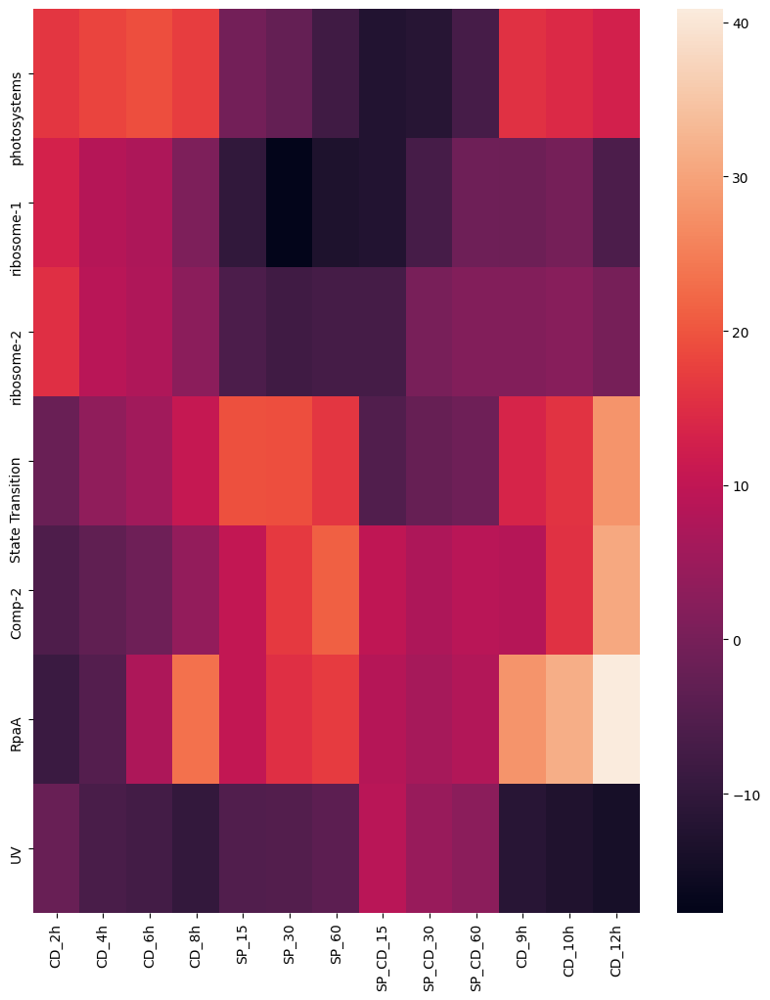

In [85]:
plt.figure(figsize=(10,12))
sns.heatmap(shade_pulse(ica_data,['photosystems','ribosome-1','ribosome-2','State Transition','Comp-2','RpaA','UV']))
plt.savefig('/home/annie/Documents/sp_trend.pdf')

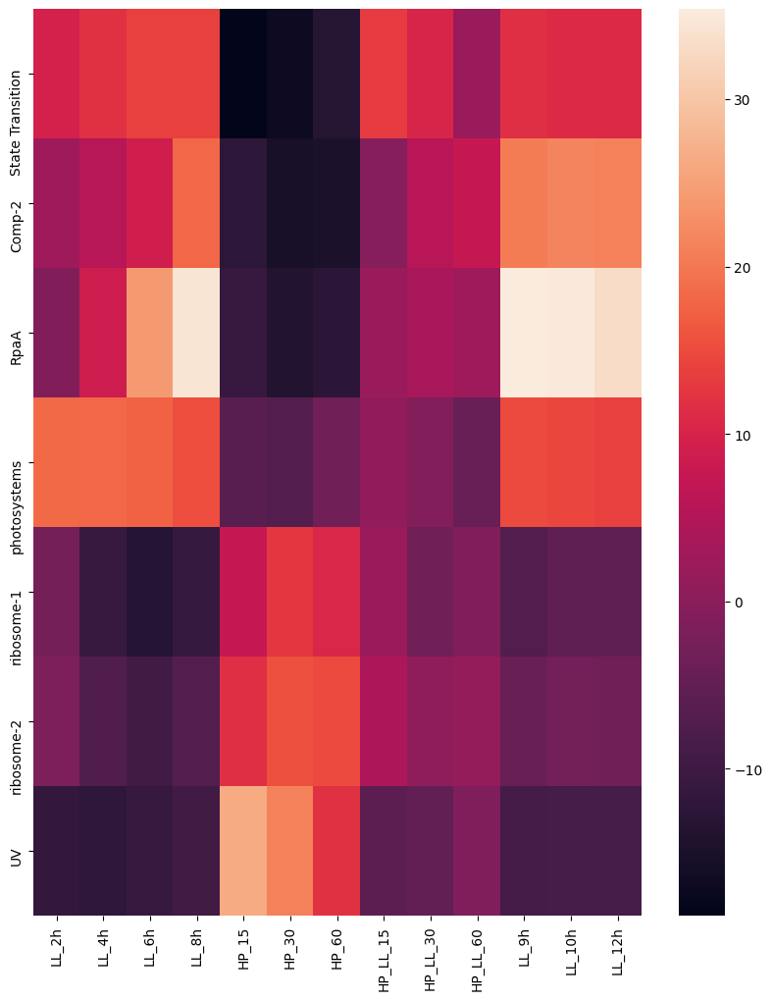

In [86]:
plt.figure(figsize=(10,12))
sns.heatmap(high_light(ica_data,['State Transition','Comp-2','RpaA','photosystems','ribosome-1','ribosome-2','UV']))
plt.savefig('/home/annie/Documents/highlight_trend.pdf')

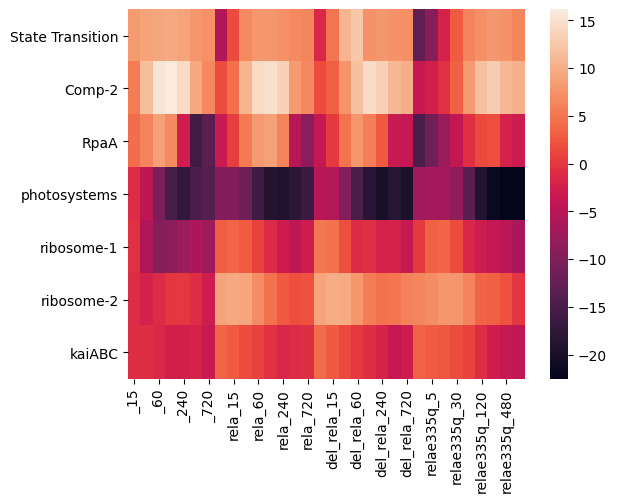

In [87]:
sns.heatmap(ppgpp6_activity(ica_data,['State Transition','Comp-2','RpaA','photosystems','ribosome-1','ribosome-2',
                                     'kaiABC']))
plt.savefig('/home/annie/Documents/osilation.pdf')

In [1434]:
# plt.figure(figsize = (10,6))
# for i in ['State Transition','Comp-2','unchar_3','unchar_7','HSR','kaiABC','RpaA']:
# #     plt.figure(figsize = (14,6))
#     plt.plot(ica_data.A[light_3_idx].loc[i])
#     plt.xticks(rotation=-45)
# #     plt.xticks(range(len(l)),l,rotation=-45)
#     plt.title(i)

# Compare

In [148]:
from pymodulon.io import *
from pymodulon.compare import *

In [169]:
mapping = pd.read_csv('../bbh/genome_full_vs_genome_full_parsed.csv',index_col=0)

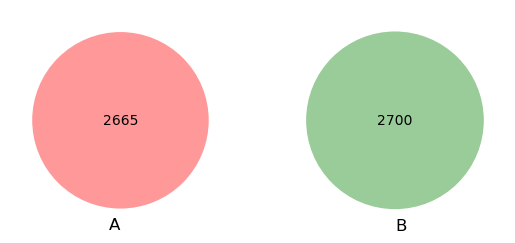

In [171]:
venn2([set(mapping.subject),set(old.M.index)])

In [172]:
old.M.index

Index(['HKK26_RS00005', 'HKK26_RS00010', 'HKK26_RS00015', 'HKK26_RS00020',
       'HKK26_RS00025', 'HKK26_RS00030', 'HKK26_RS00035', 'HKK26_RS00040',
       'HKK26_RS00045', 'HKK26_RS00050',
       ...
       'SYNPCC7942_RS13290', 'SYNPCC7942_RS13295', 'SYNPCC7942_RS13300',
       'SYNPCC7942_RS13305', 'SYNPCC7942_RS13310', 'ST32046_p4', 'ST32046_p5',
       'ST32046_p7', 'ST32046_p8', 'ST32046_p9'],
      dtype='object', length=2700)

In [170]:
mapping

,gene,subject,PID,alnLength,mismatchCount,gapOpenCount,queryStart,queryEnd,subjectStart,subjectEnd,eVal,bitScore,gene_length,COV,BBH
0,Synpcc7942_0001,SYNPCC7942_0001,100,390,0,0,1,390,1,390,0.000000e+00,786.0,390,1,<=>
1,Synpcc7942_0002,SYNPCC7942_0002,100,290,0,0,1,290,1,290,0.000000e+00,579.0,290,1,<=>
3,Synpcc7942_0003,SYNPCC7942_0003,100,777,0,0,1,777,1,777,0.000000e+00,1579.0,777,1,<=>
5,Synpcc7942_0004,SYNPCC7942_0004,100,493,0,0,1,493,1,493,0.000000e+00,1011.0,493,1,<=>
7,Synpcc7942_0005,SYNPCC7942_0005,100,531,0,0,1,531,1,531,0.000000e+00,1047.0,531,1,<=>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8677,HTX97_RS00020,HTX97_RS00020,100,171,0,0,1,171,1,171,8.330000e-122,337.0,171,1,<=>
8679,HTX97_RS00025,HTX97_RS00025,100,141,0,0,1,141,1,141,2.540000e-103,288.0,141,1,<=>
8680,HTX97_RS00030,HTX97_RS00030,100,876,0,0,1,876,1,876,0.000000e+00,1790.0,876,1,<=>
8682,HTX97_RS00035,HTX97_RS00035,100,62,0,0,1,62,1,62,6.470000e-44,131.0,62,1,<=>


In [167]:
old.M.index

Index(['HKK26_RS00005', 'HKK26_RS00010', 'HKK26_RS00015', 'HKK26_RS00020',
       'HKK26_RS00025', 'HKK26_RS00030', 'HKK26_RS00035', 'HKK26_RS00040',
       'HKK26_RS00045', 'HKK26_RS00050',
       ...
       'SYNPCC7942_RS13290', 'SYNPCC7942_RS13295', 'SYNPCC7942_RS13300',
       'SYNPCC7942_RS13305', 'SYNPCC7942_RS13310', 'ST32046_p4', 'ST32046_p5',
       'ST32046_p7', 'ST32046_p8', 'ST32046_p9'],
      dtype='object', length=2700)

In [160]:
ica_data.M.index

Index(['HTX97_RS00010', 'HTX97_RS00015', 'HTX97_RS00020', 'HTX97_RS00025',
       'HTX97_RS00030', 'HTX97_RS00035', 'HTX97_RS00040', 'HTX97_RS00005',
       'Synpcc7942_0001', 'Synpcc7942_0002',
       ...
       'Synpcc7942_B2643', 'Synpcc7942_B2644', 'Synpcc7942_B2645',
       'Synpcc7942_B2646', 'Synpcc7942_B2647', 'Synpcc7942_B2649',
       'Synpcc7942_B2650', 'Synpcc7942_B2660', 'Synpcc7942_B2651',
       'Synpcc7942_B2653'],
      dtype='object', length=2669)

In [166]:
dots,links = compare_ica(ica_data.M,old.M,cutoff=0.3,
                         ortho_file = '../bbh/genome_full_vs_genome_full_parsed.csv')
dots

ValueError: No shared genes. Check that matrix 1 conforms to the 'gene' column of the BBH file and matrix 2 conforms to the 'subject' column

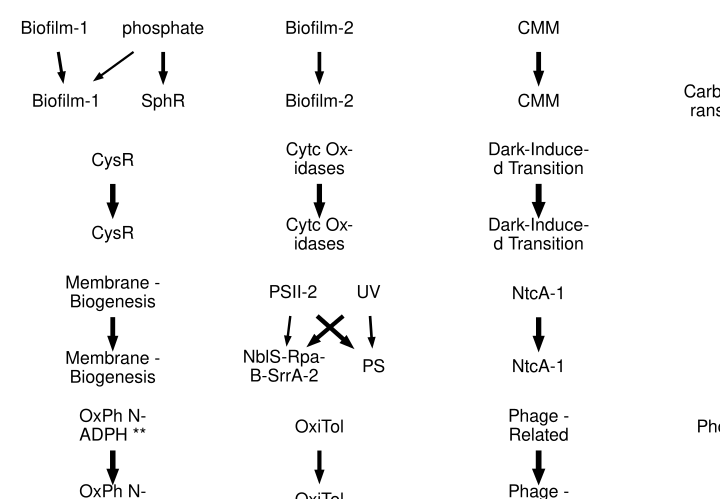

In [262]:
links

# Double-check low-scoring iModulons

In [211]:
ica_data.imodulon_table[ica_data.imodulon_table['f1score']  < 0.25]

,regulator,pvalue,qvalue,precision,recall,f1score,TP,regulon_size,imodulon_size,n_regs,single_gene,explained_variance,category
NtcA-2,ntcA,2.770449e-09,8.311348e-09,0.175,0.388889,0.241379,7.0,18.0,40,1.0,,0.021265,regulatory


In [212]:
def clear_row(imodulon):
    clear_columns = ['regulator','pvalue','qvalue','precision','recall','f1score','TP','regulon_size','n_regs']
    
    for col in clear_columns:
        ica_data.imodulon_table.loc[imodulon,col] = None

### CsoR/Fnr -> SPbeta-1

In [57]:
ica_data.imodulon_table.loc['CsoR/Fnr']

regulator                CsoR/Fnr
pvalue                1.84222e-11
qvalue                 8.7999e-07
precision                0.113636
recall                        0.4
f1score                  0.176991
TP                             10
regulon_size                   25
imodulon_size                  88
n_regs                          2
single_gene                   NaN
explained_variance      0.0182374
category               regulatory
Name: CsoR/Fnr, dtype: object

In [58]:
DF_enrichments[DF_enrichments.imodulon=='CsoR/Fnr'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,kegg_id,pathway_name,module_name,value
30,CsoR/Fnr,NaN,6.770882e-80,1.936472e-77,0.772727,0.361702,0.492754,68.0,188.0,88.0,NaN,NaN,NaN,NaN,SP-beta prophage
31,CsoR/Fnr,NaN,7.175086e-65,1.026037e-62,0.772727,0.233677,0.358839,68.0,291.0,88.0,NaN,NaN,NaN,NaN,prophages
32,CsoR/Fnr,NaN,1.953503e-63,1.862339e-61,0.772727,0.223684,0.346939,68.0,304.0,88.0,NaN,NaN,NaN,NaN,Prophages and mobile genetic elements
33,CsoR/Fnr,NaN,3.678034e-07,2.629795e-05,0.056818,0.555556,0.103093,5.0,9.0,88.0,NaN,NaN,NaN,NaN,anaerobic respiration
35,CsoR/Fnr,NaN,8.372872e-05,3.991069e-03,0.068182,0.162162,0.096000,6.0,37.0,88.0,NaN,NaN,NaN,NaN,respiration
34,CsoR/Fnr,NaN,1.866140e-05,1.067432e-03,0.045455,0.444444,0.082474,4.0,9.0,88.0,NaN,NaN,NaN,NaN,overflow metabolism
10,CsoR/Fnr,NaN,3.111113e-04,7.000005e-02,0.045455,0.235294,0.076190,4.0,17.0,88.0,NaN,map00910,Nitrogen metabolism,NaN,NaN
10,CsoR/Fnr,NaN,8.144105e-06,2.190764e-03,0.034091,1.000000,0.065934,3.0,3.0,88.0,NaN,M00529,NaN,"Denitrification, nitrate => nitrogen",NaN
11,CsoR/Fnr,NaN,1.557860e-04,2.095322e-02,0.034091,0.500000,0.063830,3.0,6.0,88.0,NaN,M00530,NaN,"Dissimilatory nitrate reduction, nitrate => am...",NaN
12,CsoR/Fnr,NaN,4.093833e-04,3.670804e-02,0.022727,1.000000,0.044444,2.0,2.0,88.0,NaN,M00804,NaN,"Complete nitrification, comammox, ammonia => n...",NaN


In [59]:
# Update the ICA data object

ica_data.rename_imodulons({'CsoR/Fnr':'SPbeta-1'})
ica_data.imodulon_table.loc['SPbeta-1','category'] = 'functional'
clear_row('SPbeta-1')

### RhgR -> Carbon metabolism/skin element

In [60]:
ica_data.imodulon_table.loc['RhgR']

regulator                    RhgR
pvalue                4.73904e-13
qvalue                1.61127e-11
precision                  0.0625
recall                          1
f1score                  0.117647
TP                              8
regulon_size                    8
imodulon_size                 128
n_regs                          1
single_gene                   NaN
explained_variance      0.0195274
category               regulatory
Name: RhgR, dtype: object

In [61]:
DF_enrichments[DF_enrichments.imodulon=='RhgR'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,kegg_id,pathway_name,module_name,value
83,RhgR,NaN,4.916032e-15,7.029925e-13,0.257812,0.143478,0.184358,33.0,239.0,128.0,NaN,NaN,NaN,NaN,utilization of specific carbon sources
82,RhgR,NaN,3.414975e-18,9.766827e-16,0.093750,0.923077,0.170213,12.0,13.0,128.0,NaN,NaN,NaN,NaN,utilization of pectin
84,RhgR,NaN,2.442151e-12,2.328184e-10,0.257812,0.116197,0.160194,33.0,299.0,128.0,NaN,NaN,NaN,NaN,carbon metabolism
85,RhgR,NaN,1.883701e-10,1.346846e-08,0.117188,0.238095,0.157068,15.0,63.0,128.0,NaN,NaN,NaN,NaN,Skin element
90,RhgR,NaN,2.879252e-04,9.149623e-03,0.156250,0.068729,0.095465,20.0,291.0,128.0,NaN,NaN,NaN,NaN,prophages
91,RhgR,NaN,5.123535e-04,1.465331e-02,0.156250,0.065789,0.092593,20.0,304.0,128.0,NaN,NaN,NaN,NaN,Prophages and mobile genetic elements
92,RhgR,NaN,1.857884e-03,4.830500e-02,0.187500,0.054920,0.084956,24.0,437.0,128.0,NaN,NaN,NaN,NaN,transporters
93,RhgR,NaN,3.471510e-03,8.273765e-02,0.109375,0.066351,0.082596,14.0,211.0,128.0,NaN,NaN,NaN,NaN,ABC transporters
24,RhgR,NaN,2.234027e-05,3.004766e-03,0.039062,0.384615,0.070922,5.0,13.0,128.0,NaN,M00429,NaN,NaN,NaN
88,RhgR,NaN,7.057531e-05,2.883505e-03,0.039062,0.312500,0.069444,5.0,16.0,128.0,NaN,NaN,NaN,NaN,utilization of hexuronate


In [62]:
# Update the ICA data object

ica_data.rename_imodulons({'RhgR':'carbon metabolism/skin element'})
ica_data.imodulon_table.loc['carbon metabolism/skin element','category'] = 'functional'
clear_row('carbon metabolism/skin element')

## NusA -> ComK/LevR/NusA

In [63]:
ica_data.imodulon_table.loc['NusA']

regulator                    NusA
pvalue                1.78821e-11
qvalue                7.51047e-10
precision               0.0542636
recall                          1
f1score                  0.102941
TP                              7
regulon_size                    7
imodulon_size                 129
n_regs                          1
single_gene                   NaN
explained_variance      0.0117704
category               regulatory
Name: NusA, dtype: object

In [64]:
DF_enrichments[DF_enrichments.imodulon=='NusA'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,kegg_id,pathway_name,module_name,value
206,NusA,NaN,7.520894e-07,1.075488e-04,0.147287,0.107955,0.124590,19.0,187.0,129.0,NaN,NaN,NaN,NaN,genetics
57,NusA,NaN,5.731914e-10,1.541885e-07,0.062016,0.615385,0.112676,8.0,13.0,129.0,NaN,M00429,NaN,NaN,NaN
207,NusA,NaN,2.144949e-06,2.044851e-04,0.077519,0.192308,0.110497,10.0,104.0,129.0,NaN,NaN,NaN,NaN,genetic competence
76,NusA,NaN,2.640817e-08,5.941839e-06,0.054264,0.538462,0.098592,7.0,13.0,129.0,NaN,map00290,"Valine, leucine and isoleucine biosynthesis",NaN,NaN
205,NusA,NaN,2.708177e-07,7.745386e-05,0.054264,0.411765,0.095890,7.0,17.0,129.0,NaN,NaN,NaN,NaN,biosynthesis/ acquisition of branched-chain am...
209,NusA,NaN,5.143547e-04,2.788112e-02,0.209302,0.057447,0.090150,27.0,470.0,129.0,NaN,NaN,NaN,NaN,sporulation proteins
78,NusA,NaN,1.253048e-05,9.397862e-04,0.054264,0.250000,0.089172,7.0,28.0,129.0,NaN,map01210,2-Oxocarboxylic acid metabolism,NaN,NaN
212,NusA,NaN,2.183264e-03,7.805167e-02,0.317829,0.045354,0.079380,41.0,1131.0,129.0,NaN,NaN,NaN,NaN,Information processing
213,NusA,NaN,2.457999e-03,7.810976e-02,0.054264,0.111111,0.072917,7.0,63.0,129.0,NaN,NaN,NaN,NaN,Skin element
210,NusA,NaN,5.849187e-04,2.788112e-02,0.046512,0.166667,0.072727,6.0,36.0,129.0,NaN,NaN,NaN,NaN,tRNA modification and maturation


In [65]:
ica_data.compute_trn_enrichment('NusA', max_regs=3,force=True,save=True)

,imodulon,regulator,pvalue,qvalue,precision,recall,f1score,TP,regulon_size,imodulon_size,n_regs
0,NusA,ComK/LevR/NusA,2.191960e-21,7.674319e-15,0.193798,0.352113,0.250000,25.0,71.0,129.0,3.0
1,NusA,LevR/OhrR/NusA,8.056984e-21,1.410424e-14,0.100775,1.000000,0.183099,13.0,13.0,129.0,3.0
2,NusA,LevR/YfmP/NusA,1.099801e-19,6.417561e-14,0.100775,0.928571,0.181818,13.0,14.0,129.0,3.0
3,NusA,ComK/SigL/NusA,7.419812e-20,6.417561e-14,0.201550,0.292135,0.238532,26.0,89.0,129.0,3.0
4,NusA,ComK/NusA/T-box,6.486468e-20,6.417561e-14,0.217054,0.261682,0.237288,28.0,107.0,129.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...
460,NusA,ComK/SigG/MalR,1.287429e-09,9.758854e-06,0.193798,0.119048,0.147493,25.0,210.0,129.0,3.0
461,NusA,ComK/SigG/SacY,1.287429e-09,9.758854e-06,0.193798,0.119048,0.147493,25.0,210.0,129.0,3.0
462,NusA,SigL/MhqR/T-box,1.290543e-09,9.758854e-06,0.116279,0.211268,0.150000,15.0,71.0,129.0,3.0
463,NusA,NusA/MhqR,1.304144e-09,9.819285e-06,0.062016,0.571429,0.111888,8.0,14.0,129.0,2.0


In [66]:
# Update the ICA data object

ica_data.rename_imodulons({'NusA':'ComK/LevR/NusA'})

## CsoR -> SPbeta-2

In [67]:
ica_data.imodulon_table.loc['CsoR']

regulator                    CsoR
pvalue                1.16361e-10
qvalue                8.14527e-10
precision                0.127273
recall                        0.5
f1score                  0.202899
TP                              7
regulon_size                   14
imodulon_size                  55
n_regs                          1
single_gene                   NaN
explained_variance      0.0153802
category               regulatory
Name: CsoR, dtype: object

In [68]:
DF_enrichments[DF_enrichments.imodulon=='CsoR'].sort_values('f1score',ascending=False)

,imodulon,annotation,pvalue,qvalue,precision,recall,f1score,TP,target_set_size,imodulon_size,source,kegg_id,pathway_name,module_name,value
214,CsoR,NaN,4.560304e-76,1.304247e-73,0.981818,0.287234,0.444444,54.0,188.0,55.0,NaN,NaN,NaN,NaN,SP-beta prophage
215,CsoR,NaN,1.937387e-64,2.770463e-62,0.981818,0.185567,0.312139,54.0,291.0,55.0,NaN,NaN,NaN,NaN,prophages
216,CsoR,NaN,2.598987e-63,2.477701e-61,0.981818,0.177632,0.300836,54.0,304.0,55.0,NaN,NaN,NaN,NaN,Prophages and mobile genetic elements
64,CsoR,NaN,2.192982e-04,5.899121e-02,0.054545,0.300000,0.092308,3.0,10.0,55.0,NaN,M00053,NaN,"Pyrimidine deoxyribonuleotide biosynthesis, CD...",NaN
217,CsoR,NaN,9.373689e-04,6.702187e-02,0.036364,0.500000,0.067797,2.0,4.0,55.0,NaN,NaN,NaN,NaN,DNA replication/ based on similarity


In [69]:
# Update the ICA data object

ica_data.rename_imodulons({'CsoR':'SPbeta-2'})
ica_data.imodulon_table.loc['SPbeta-2','category'] = 'functional'
clear_row('SPbeta-2')

## Xpf

In [70]:
ica_data.compute_trn_enrichment('Xpf',max_regs=2,save=True)

,imodulon,regulator,pvalue,qvalue,precision,recall,f1score,TP,regulon_size,imodulon_size,n_regs
0,Xpf,Xre/Xpf,5.255146e-69,2.509332e-64,0.611111,1.000000,0.758621,33.0,33.0,54.0,2.0
1,Xpf,Xpf,1.548917e-55,3.698039e-51,0.500000,1.000000,0.666667,27.0,27.0,54.0,1.0
2,Xpf,Xpf/YclJ,2.809484e-50,4.471762e-46,0.518519,0.777778,0.622222,28.0,36.0,54.0,2.0
3,Xpf,Xpf/FadR,4.263676e-49,5.089764e-45,0.537037,0.674419,0.597938,29.0,43.0,54.0,2.0
4,Xpf,Xpf/LexA,1.367897e-41,1.306342e-37,0.574074,0.369048,0.449275,31.0,84.0,54.0,2.0
5,Xpf,SigM/Xpf,9.957493e-31,7.924505e-27,0.518519,0.233333,0.321839,28.0,120.0,54.0,2.0
6,Xpf,Xpf/AbrB,1.074619e-21,7.330439e-18,0.555556,0.100671,0.170455,30.0,298.0,54.0,2.0
7,Xpf,Xre,2.851014e-12,1.701699e-08,0.111111,1.000000,0.200000,6.0,6.0,54.0,1.0
8,Xpf,Xre/FadR,9.651932e-11,5.120886e-07,0.148148,0.363636,0.210526,8.0,22.0,54.0,2.0
9,Xpf,Xre/YclJ,1.888649e-10,9.018299e-07,0.129630,0.466667,0.202899,7.0,15.0,54.0,2.0


In [71]:
ica_data.rename_imodulons({'Xpf':'Xre/Xpf'})

## Adjust some thresholds

In [72]:
ica_data.change_threshold('Thi-box',.1)
ica_data.change_threshold('LnrK',.15)
ica_data.change_threshold('KipR',0.12)

# Recalculate enrichments
ica_data.compute_trn_enrichment(['Thi-box','LnrK','KipR'], save=True)

,imodulon,regulator,pvalue,qvalue,precision,recall,f1score,TP,regulon_size,imodulon_size,n_regs
0,Thi-box,Thi-box,1.033185e-33,1.033185e-33,1.0,0.857143,0.923077,12.0,14.0,12.0,1.0
1,LnrK,LnrK,0.000000e+00,0.000000e+00,1.0,1.000000,1.000000,3.0,3.0,3.0,1.0
2,KipR,KipR,0.000000e+00,0.000000e+00,1.0,1.000000,1.000000,7.0,7.0,7.0,1.0
3,KipR,TnrA,8.103543e-13,1.620709e-12,1.0,0.083333,0.153846,7.0,84.0,7.0,1.0


# Add biological functions
This is only relevant for 'biological' and 'regulatory iModulons

In [73]:
subti_annot = pd.read_csv(path.join('..','data','external','subtiwiki_categories.csv'))
subti_annot.rename({'BSU_number':'gene_id'},axis=1,inplace=True)
subti_annot = subti_annot[subti_annot.gene_id.isin(ica_data.gene_names)]

In [74]:
subti_enrich = ica_data.compute_annotation_enrichment(subti_annot,'FuncName2')
functions = subti_enrich.sort_values('qvalue').drop_duplicates('imodulon').set_index('imodulon')['FuncName2']
functions = functions[ica_data.imodulon_table.category.isin(['regulatory','functional'])]
functions.head()

imodulon
SPbeta-1      prophages
SPbeta-2      prophages
SigK        sporulation
SigE        sporulation
Fur         homeostasis
Name: FuncName2, dtype: object

In [75]:
ica_data.imodulon_table['function'] = functions

## Manually curate functions

In [76]:
ica_data.imodulon_table.function.value_counts()

carbon metabolism                                    8
amino acid/ nitrogen metabolism                      6
coping with stress                                   6
prophages                                            5
nucleotide metabolism                                3
sporulation                                          3
exponential and early post-exponential lifestyles    3
homeostasis                                          3
electron transport and ATP synthesis                 3
transporters                                         2
additional metabolic pathways                        2
proteins of unknown function                         2
lipid metabolism                                     1
ncRNA                                                1
short peptides                                       1
essential genes                                      1
mobile genetic elements/ based on similarity         1
cell envelope and cell division                      1
mobile gen

In [77]:
rename = {'carbon metabolism':'Carbon Metabolism',
          'coping with stress':'Stress Response',
          'amino acid/ nitrogen metabolism':'AA/Nucleotide Metabolism',
          'prophages':'Prophages',
          'sporulation':'Lifestyles',
          'exponential and early post-exponential lifestyles':'Lifestyles',
          'electron transport and ATP synthesis': 'Misc. Metabolism',
          'homeostasis':'Homeostasis',
          'nucleotide metabolism':'AA/Nucleotide Metabolism',
          'proteins of unknown function':'Other',
          'additional metabolic pathways':'Misc. Metabolism',
          'short peptides':'Cellular Processes',
          'essential genes':'Cellular Processes',
          'transporters':'Misc. Metabolism',
          'mobile genetic elements': 'Cellular Processes',
          'ncRNA':'Cellular Processes',
          'mobile genetic elements/ based on similarity':'Cellular Processes',
          'lipid metabolism':'Misc. Metabolism',
          'cell envelope and cell division': 'Cellular Processes',
          'genetics':'Cellular Processes'}

In [78]:
ica_data.imodulon_table.function = ica_data.imodulon_table.function.replace(rename)

In [79]:
ica_data.imodulon_table.loc['ybc-operon','function'] = 'Prophages'
ica_data.imodulon_table.loc['SigI','function'] = 'Stress Response'
ica_data.imodulon_table.loc['LnrK','function'] = 'Cellular Processes'
ica_data.imodulon_table.loc['early-biofilm','function'] = 'Lifestyles'
ica_data.imodulon_table.loc['KipR','function'] = 'Misc. Metabolism'
ica_data.imodulon_table.loc['AbrB','function'] = 'Lifestyles'
ica_data.imodulon_table.loc['putative-cssRS','function'] = 'Lifestyles'
ica_data.imodulon_table.loc['YvaF','function'] = 'Other'

In [80]:
ica_data.imodulon_table.function.value_counts()

AA/Nucleotide Metabolism    9
Lifestyles                  9
Carbon Metabolism           8
Cellular Processes          8
Misc. Metabolism            8
Stress Response             7
Prophages                   6
Homeostasis                 3
Other                       3
Name: function, dtype: int64

## Fill in Uncharacterized and Single Gene iModulons

In [81]:
ica_data.imodulon_table.function = ['Uncharacterized' if row.category == 'uncharacterized' else
                                    'Single Gene' if row.category == 'single_gene' else row.function
                                    for i,row in ica_data.imodulon_table.iterrows()]


# Save final ICA data object

In [371]:
save_to_json(ica_data, path.join(data_dir, 'ica_wip.json.gz'))

In [372]:
ica_data.imodulon_table.to_csv(path.join(data_dir, 'imodulon_table.csv'))